In [43]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.stats import gaussian_kde
import warnings
warnings.filterwarnings("ignore")
import lmfit
import scipy
from astropy.coordinates import Distance
from astropy.cosmology import Planck15
from scipy.integrate import simps
#from scipy import interpolate
import pandas as pd
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d
from scipy import interpolate
from numpy import loadtxt
from astropy.io import fits
import math
import os
from grizli.catalog import query_tap_catalog
from scipy.signal import find_peaks
import eazy


In [7]:
Deblended = fits.open("Dub_with_zspec_and_FIR.fit")

Dub_data = Deblended[1].data

Dub_header = Deblended[1].header



In [105]:
len(Dub_data['ID']), len(cosmos2015_data['Seq'])

(1219, 23246)

In [9]:
Cosmos2015 = fits.open("Cosmos2015_Filter2_Optical.fit")

cosmos2015_data = Cosmos2015[1].data

cosmos2015_header = Cosmos2015[1].header



In [11]:
# Dub_data['ID'][5,3]
import numpy as np
tes = np.array([1,2,3])


# type(Dub_data['ID'][tes])

In [30]:


common_galaxies_ID = Dub_data['ID'][np.array([index for index, value in enumerate(Dub_data['ID']) if value in cosmos2015_data['Seq']])]


index_for_FIR = np.where(Dub_data['ID']==common_galaxies_ID)




In [31]:


FIR_indices = np.array([index for index, value in enumerate(Dub_data['ID']) if value in common_galaxies_ID])

OPTICAL_indices = np.array([index for index, value in enumerate(cosmos2015_data['Seq']) if value in common_galaxies_ID])



In [32]:
# len(FIR_indices)

In [33]:
len(OPTICAL_indices)

636

In [34]:
# Dub_data['ID']

# Build Catalouge for EAZY

In [36]:
#Convert mag to mJy

def flux_density(ab_mag):
    return 10 ** ((ab_mag - 23.9) / -2.5)

def flux_density_error(ab_mag, delta_ab_mag):

    df_dmag = flux_density(ab_mag)

    delta_flux = abs(df_dmag) * delta_ab_mag* math.log(10) / 2.5

    return delta_flux



In [201]:
import numpy as np
import pandas as pd

# Create some sample data

header_name=['Seq','Fu','e_Fu','FB','e_FB','FV','e_FV','FR','e_FR','Fi','e_Fi','FKs','e_FKs','FJ','e_FJ','FH','e_FH','FY','e_FY','F3_6','e_F3_6','F4_5','e_F4_5','F5_8','e_F5_8','F8_0','e_F8_0']


# FIR_index
cosmos2015_filtered_index  = OPTICAL_indices


Seq = cosmos2015_data['Seq'][cosmos2015_filtered_index]


Fu = flux_density(cosmos2015_data['umag'][cosmos2015_filtered_index])
e_Fu = flux_density_error(cosmos2015_data['umag'][cosmos2015_filtered_index],cosmos2015_data['e_umag'][cosmos2015_filtered_index])

FB = flux_density(cosmos2015_data['Bmag'][cosmos2015_filtered_index])
e_FB = flux_density_error(cosmos2015_data['Bmag'][cosmos2015_filtered_index],cosmos2015_data['e_Bmag'][cosmos2015_filtered_index])

FV = flux_density(cosmos2015_data['Vmag'][cosmos2015_filtered_index])
e_FV = flux_density_error(cosmos2015_data['Vmag'][cosmos2015_filtered_index],cosmos2015_data['e_Vmag'][cosmos2015_filtered_index])

FR = flux_density(cosmos2015_data['rmag'][cosmos2015_filtered_index])
e_FR = flux_density_error(cosmos2015_data['rmag'][cosmos2015_filtered_index],cosmos2015_data['e_rmag'][cosmos2015_filtered_index])

Fi = flux_density(cosmos2015_data['ipmag'][cosmos2015_filtered_index])
e_Fi = flux_density_error(cosmos2015_data['ipmag'][cosmos2015_filtered_index],cosmos2015_data['e_ipmag'][cosmos2015_filtered_index])


FKs = flux_density(cosmos2015_data['Ksmag'][cosmos2015_filtered_index])
e_FKs = flux_density_error(cosmos2015_data['Ksmag'][cosmos2015_filtered_index],cosmos2015_data['e_Ksmag'][cosmos2015_filtered_index])

FJ = flux_density(cosmos2015_data['Jmag'][cosmos2015_filtered_index])
e_FJ = flux_density_error(cosmos2015_data['Jmag'][cosmos2015_filtered_index],cosmos2015_data['e_Jmag'][cosmos2015_filtered_index])

FH = flux_density(cosmos2015_data['Hmag'][cosmos2015_filtered_index])
e_FH = flux_density_error(cosmos2015_data['Hmag'][cosmos2015_filtered_index],cosmos2015_data['e_Hmag'][cosmos2015_filtered_index])

FY = flux_density(cosmos2015_data['Ymag'][cosmos2015_filtered_index])
e_FY = flux_density_error(cosmos2015_data['Ymag'][cosmos2015_filtered_index],cosmos2015_data['e_Ymag'][cosmos2015_filtered_index])

F3_6 = flux_density(cosmos2015_data['_3_6mag'][cosmos2015_filtered_index])
e_F3_6 = flux_density_error(cosmos2015_data['_3_6mag'][cosmos2015_filtered_index],cosmos2015_data['e_3_6mag'][cosmos2015_filtered_index])

F4_5 = flux_density(cosmos2015_data['_4_5mag'][cosmos2015_filtered_index])
e_F4_5 = flux_density_error(cosmos2015_data['_4_5mag'][cosmos2015_filtered_index],cosmos2015_data['e_4_5mag'][cosmos2015_filtered_index])

F5_8 = flux_density(cosmos2015_data['_5_8mag'][cosmos2015_filtered_index])
e_F5_8 = flux_density_error(cosmos2015_data['_5_8mag'][cosmos2015_filtered_index],cosmos2015_data['e_5_8mag'][cosmos2015_filtered_index])

F8_0 = flux_density(cosmos2015_data['_8_0mag'][cosmos2015_filtered_index])
e_F8_0 = flux_density_error(cosmos2015_data['_8_0mag'][cosmos2015_filtered_index],cosmos2015_data['e_8_0mag'][cosmos2015_filtered_index])

e_Jmag = cosmos2015_data['e_Jmag'][cosmos2015_filtered_index]

# F250_Dublended = Dub_data['F250'][FIR_indices_in_dublended]

# z_photo = cosmos2015_data['zphot']

# F250 = cosmos2015_data['F250um']
# F250_err = cosmos2015_data['e_F250tot']

# F350 = cosmos2015_data['F350um']
# F350_err = cosmos2015_data['e_F350tot']

# F500 = cosmos2015_data['F500um']
# F500_err = cosmos2015_data['e_F500tot']



# Combine the data into a single array
combined_data = np.vstack((Seq,Fu,e_Fu,FB,e_FB,FV,e_FV,FR,e_FR,Fi,e_Fi,FKs,e_FKs,FJ,e_FJ,FH,e_FH,FY,e_FY,F3_6,e_F3_6,F4_5,e_F4_5,F5_8,e_F5_8,F8_0,e_F8_0 )).T

# Create a Pandas DataFrame from the combined data
df = pd.DataFrame(combined_data, columns= header_name)
                  

# Save the DataFrame to a CSV file
df.to_csv('zfourge.uds.zspec.vizier999.csv', index=False)





# df


1219

In [127]:
params = {}
params['CATALOG_FILE'] = os.path.join(str(os.getenv('EAZYCODE')), '/inputs/hdfn_fs99_eazy.cat')

params['MAIN_OUTPUT_FILE'] = 'hdfn.eazypy'

# Galactic extinction
params['MW_EBV'] = 0.0103
params['CAT_HAS_EXTCORR'] = True

params['Z_STEP'] = 0.01
params['Z_MIN'] = 0.01
params['Z_MAX'] = 6.

params['PRIOR_ABZP'] = 25 
params['PRIOR_FILTER'] = 28 # K
params['PRIOR_FILE'] = 'templates/prior_K_TAO.dat'

params['TEMPLATES_FILE'] = 'templates/fsps_full/tweak_fsps_QSF_12_v3.param'

params['FIX_ZSPEC'] = False

params['IGM_SCALE_TAU'] = 1.0

translate_file = os.path.join(str(os.getenv('EAZYCODE')), 'inputs/zphot.translate')


In [117]:
# translate_file

In [128]:
# field = 'cdfs'
field = 'uds'


# Bright mag to limit catalog size
MAX_KMAG = 22.5
cat_name = f'zfourge.{field}.zspec.vizier999.csv'


print(cat_name)

zfourge.uds.zspec.vizier999.csv


In [129]:
#### Update parameters

# Predefined translate file
trans_name = f'zfourge.{field}.vizier.translate.csv'
# csv_trans = pd.read_csv(f'https://erda.ku.dk/vgrid/Gabriel%20Brammer/Catalogs/{trans_name}')
# csv_trans.to_csv(trans_name, index=False)

# New parameters
# params['MW_EBV'] = eazy.utils.get_irsa_dust(np.nanmedian(zf['ra']), np.nanmedian(zf['dec']))

params['CATALOG_FILE'] = cat_name
params['PRIOR_ABZP'] = 25
params['CATALOG_FORMAT'] = 'csv'
params['PRIOR_FILTER'] = 255
#params['TEMPLATES_FILE'] = 'templates/spline_templates_v2/tweak_spline.param'
params['MAIN_OUTPUT_FILE'] = f'zfourge.{field}'

params['SYS_ERR'] = 0.03

params['Z_MAX'] = 12.
params['Z_STEP'] = 0.005

translate_file = trans_name

In [130]:
self = eazy.photoz.PhotoZ(param_file=None, translate_file=translate_file, zeropoint_file=None, 
                          params=params, load_prior=True, load_products=False)

Read default param file: /Users/ptanouri/Library/Python/3.9/lib/python/site-packages/eazy/data/zphot.param.default
Read CATALOG_FILE: zfourge.uds.zspec.vizier999.csv
   >>> NOBJ = 636
F8_0 e_F8_0 ( 21): IRAC/irac_tr4_2004-08-09.dat
F5_8 e_F5_8 ( 20): IRAC/irac_tr3_2004-08-09.dat
F4_5 e_F4_5 ( 19): IRAC/irac_tr2_2004-08-09.dat
F3_6 e_F3_6 ( 18): IRAC/irac_tr1_2004-08-09.dat
FKs e_FKs (255): FOURSTAR/Ks_cam_optics_sky.txt
Fu e_Fu ( 88): megaprime/cfht_mega_u_cfh9301.dat
FB e_FB (122): UKIDSS/B_qe.txt
FV e_FV ( 79): COSMOS/SUBARU_filter_V.txt
FR e_FR (123): UKIDSS/R_qe.txt
Fi e_Fi (124): UKIDSS/i_qe.txt
FY e_FY (266): VLT/hawki_y_ETC.dat
FJ e_FJ (263): UKIDSS/Table04_online.dat
FH e_FH (264): UKIDSS/Table05_online.dat
Set sys_err = 0.03 (positive=True)
Read PRIOR_FILE:  templates/prior_K_TAO.dat
Template grid: templates/fsps_full/tweak_fsps_QSF_12_v3.param (this may take some time)


100%|███████████████████████████████████████████████████████████| 12/12 [00:11<00:00,  1.06it/s]


Template   0: tweak_fsps_QSF_12_v3_001.dat (NZ=1).
Template   1: tweak_fsps_QSF_12_v3_002.dat (NZ=1).
Template   2: tweak_fsps_QSF_12_v3_003.dat (NZ=1).
Template   3: tweak_fsps_QSF_12_v3_004.dat (NZ=1).
Template   4: tweak_fsps_QSF_12_v3_005.dat (NZ=1).
Template   5: tweak_fsps_QSF_12_v3_006.dat (NZ=1).
Template   6: tweak_fsps_QSF_12_v3_007.dat (NZ=1).
Template   7: tweak_fsps_QSF_12_v3_008.dat (NZ=1).
Template   8: tweak_fsps_QSF_12_v3_009.dat (NZ=1).
Template   9: tweak_fsps_QSF_12_v3_010.dat (NZ=1).
Template  10: tweak_fsps_QSF_12_v3_011.dat (NZ=1).
Template  11: tweak_fsps_QSF_12_v3_012.dat (NZ=1).
Process templates: 11.783 s


511it [00:00, 7322.80it/s]


Iteration:  0


100%|█████████████████████████████████████████████████████████| 511/511 [00:07<00:00, 69.58it/s]


Compute best fits
fit_best: 0.1 s (n_proc=1,  NOBJ=636)
Fit 7.7 s (n_proc=8, NOBJ=636)
Iterative correction - zeropoint / template
Iteration:  1


100%|█████████████████████████████████████████████████████████| 511/511 [00:06<00:00, 74.04it/s]


Compute best fits
fit_best: 0.1 s (n_proc=1,  NOBJ=636)
Fit 7.5 s (n_proc=8, NOBJ=636)
Iterative correction - zeropoint / template
Iteration:  2


100%|█████████████████████████████████████████████████████████| 511/511 [00:06<00:00, 77.99it/s]


Compute best fits
fit_best: 0.1 s (n_proc=1,  NOBJ=636)
Fit 7.3 s (n_proc=8, NOBJ=636)
Iterative correction - zeropoint / template


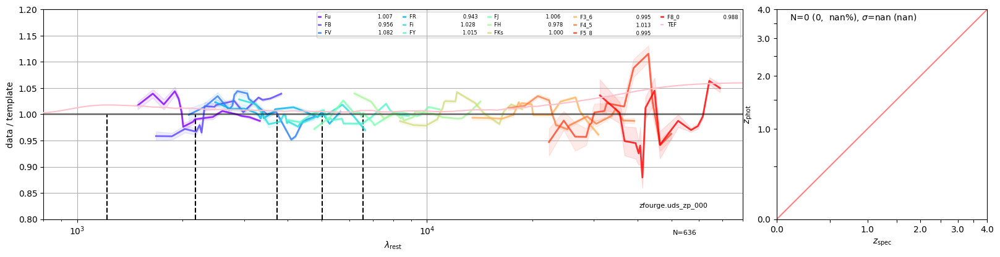

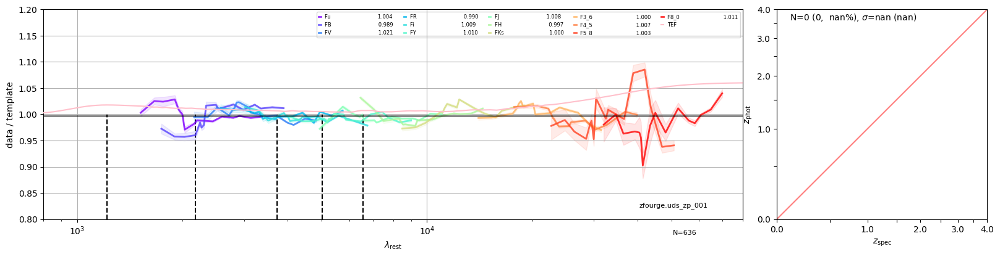

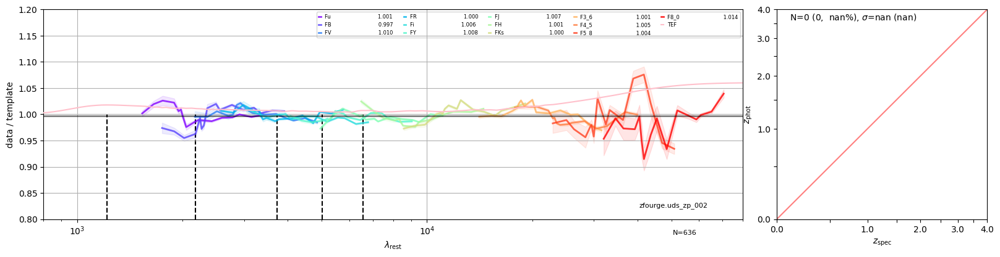

In [131]:
NITER = 3
NBIN = np.minimum(self.NOBJ//100, 180)

self.param.params['VERBOSITY'] = 1.
for iter in range(NITER):
    print('Iteration: ', iter)
    
    sn = self.fnu/self.efnu
    clip = (sn > 1).sum(axis=1) > 4 # Generally make this higher to ensure reasonable fits
    self.iterate_zp_templates(idx=self.idx[clip], update_templates=False, 
                              update_zeropoints=True, iter=iter, n_proc=8, 
                              save_templates=False, error_residuals=False, 
                              NBIN=NBIN, get_spatial_offset=False)

In [132]:
# Turn off error corrections derived above
self.set_sys_err(positive=True)

# Full catalog
sample = np.isfinite(self.ZSPEC)

# fit_parallel renamed to fit_catalog 14 May 2021
self.fit_catalog(self.idx[sample], n_proc=8)

Set sys_err = 0.03 (positive=True)


100%|█████████████████████████████████████████████████████████| 511/511 [00:06<00:00, 74.12it/s]


Compute best fits
fit_best: 0.1 s (n_proc=1,  NOBJ=636)
Fit 7.3 s (n_proc=8, NOBJ=636)


In [47]:
#set common grid for both p(z)
# common_z_grid = self.zgrid

In [133]:
np.max(common_z_grid)

11.935175

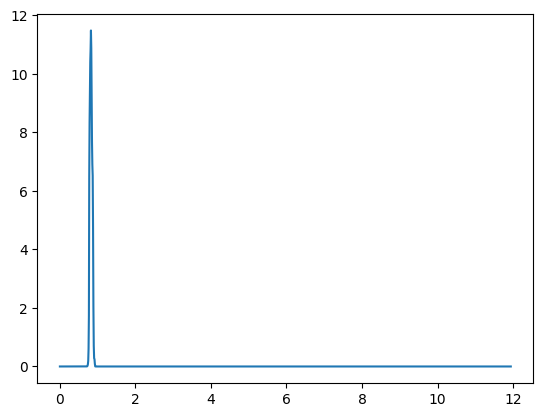

In [134]:
ind = 10

# self.full_logprior[ind,:]
plt.plot(self.zgrid,np.exp(self.lnp[ind,:]))

# best_z_val=common_z_grid[np.where(np.exp(self.lnp[ind,:])==max(np.exp(self.lnp[ind,:])))[0][0]]

# Now we find degenerate galaxies in EAZY


In [201]:
len(Dub_data['ID'])

1219

In [199]:
dddd = []
for i in range(len(OPTICAL_indices)):
    peaks, _ = find_peaks(np.exp(self.lnp[i,:]), height=0.5)
    
    if len(peaks) >= 2:
        dddd.append(i)
        
        
   

In [200]:
len(dddd)
# dddd



126

In [145]:
# list_of_degen

In [214]:
# degen_galaxies
# degen_galaxies

array([ 13,  16,  18,  19,  20,  21,  22,  27,  35,  39,  42,  43,  46,
        52,  54,  59,  61,  66,  67,  81,  89,  92, 107, 114, 133])

In [217]:
deg_optical_index

array([ 55,  66,  82,  83,  85,  91,  95, 107, 134, 147, 156, 158, 165,
       181, 192, 244, 254, 281, 282, 379, 415, 420, 482, 506, 619])

In [206]:
deg_optical_index = np.array(list_of_degen)[degen_galaxies]

# deg_optical_index

In [208]:
# deg_optical_index

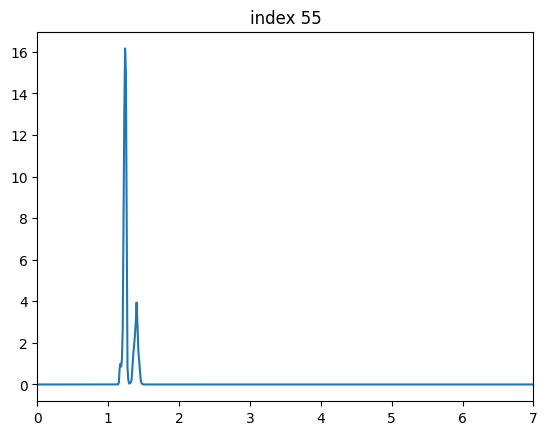

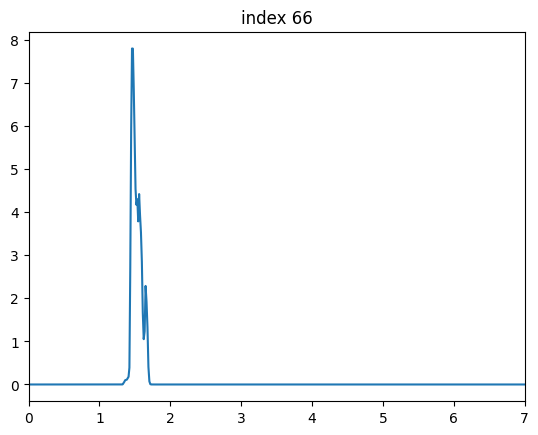

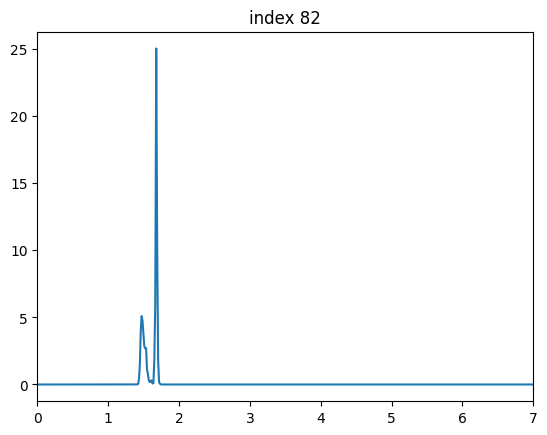

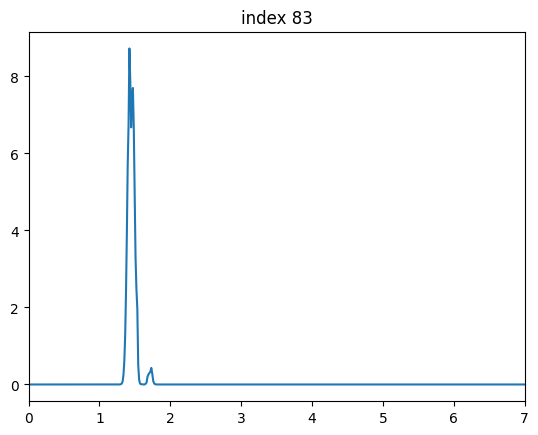

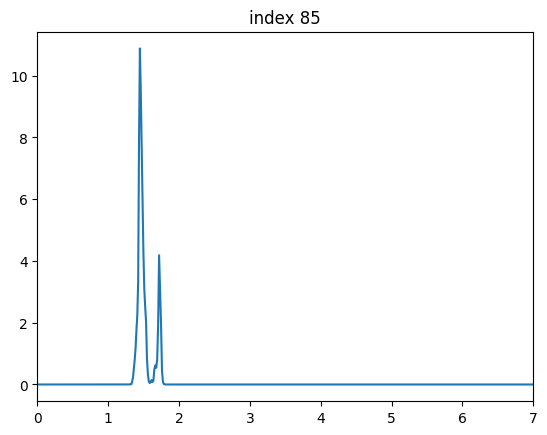

...

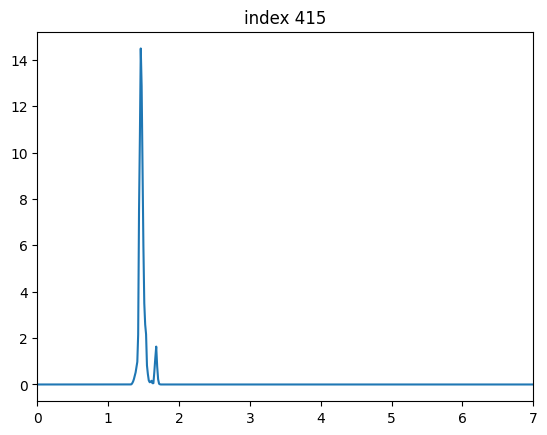

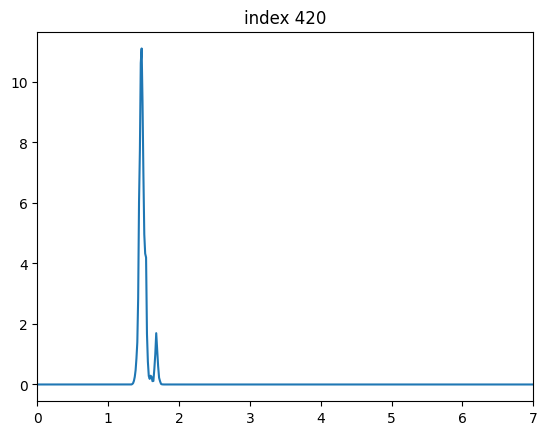

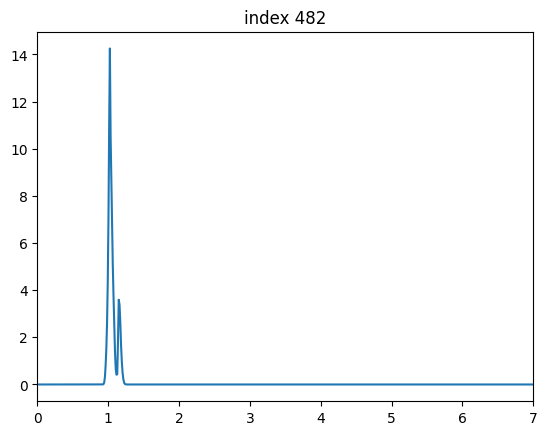

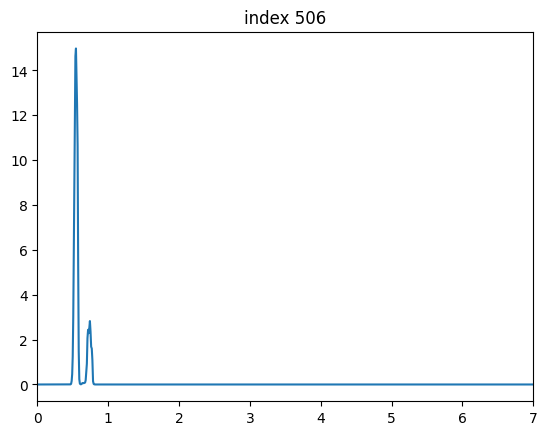

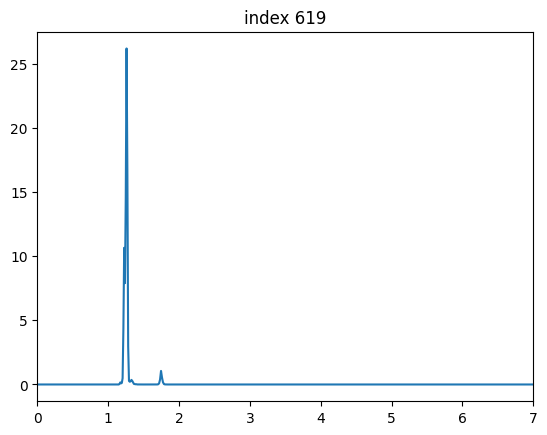

In [207]:
for i in range(len(deg_optical_index)):
    
    plt.figure()
    plt.plot(common_z_grid, np.exp(self.lnp[deg_optical_index[i],:]))
    plt.title(f"index {deg_optical_index[i]}")
    
    plt.xlim(0,7)
#     plt.legend()
    plt.show()
    
    

In [135]:
degen_galaxies = np.array([13,16,18,19,20,21,22,27,35,39,42,43,46,52,54,59,61,66,67,81,89,92,107,114,133])

In [125]:
# list_of_degen

# len(degen_galaxies)

In [142]:


# common_galaxies_ID = Dub_data['ID'][np.array([index for index, value in enumerate(Dub_data['ID']) if value in cosmos2015_data['Seq']])]


# index_for_FIR = np.where(Dub_data['ID']==common_galaxies_ID)



# FIT_photometry

In [60]:

c = scipy.constants.c
Beta=1.5
nu_scale=1e9
A_scale=1e-11
alpha_scale = 1e5
f = (scipy.constants.h)/(scipy.constants.k)*nu_scale
upper_bound_b = c/(8*1e-6)/nu_scale
lower_bound_c = c/(1000*1e-6)/nu_scale
amplitude_spread=0.5

wavelen_obs = np.array([250,350,500])*(10**-6)

freq_obs = (c/wavelen_obs)/nu_scale



In [181]:
Dub_data['F250'][365]

0.0

In [211]:
def get_z_and_T_for_one_galaxy(index_number):
    
    
    
    F250_Dublended = Dub_data['F250'][index_number]
    F350_Dublended = Dub_data['F350'][index_number]
    F500_Dublended = Dub_data['F500'][index_number]
    
    FIR_flux = np.array(np.abs([F250_Dublended,F350_Dublended,F500_Dublended]))

    FIR_flux_error = 0.1* FIR_flux
    
    
#     lt_params = [889.0588851152065, 2.5040970376568774]
    lt_params = [380, 2.6940970376568774]
#     lt_params = [23133.618537869013, 1.55067652]
    index_number = index_number
    def compute_lum_dist(z_input):
        """
        Return the luminosity distance in SI units given redshift
        """
        return Distance(z=z_input, cosmology=Planck15).si.value

    def lt(e,lt_params):
        #return (10**(np.polyval(best_fit_poly, e))) * 3.828e26 

        alpha=lt_params[0]
        gamma=lt_params[1]

        return (alpha*1e5) * e**gamma * 3.828e26 

    def modified_blackbody_distribution(nu, T, A):

        B_nu = (nu**3) / (np.exp(f*nu / T) - 1)

        S_nu = (A*A_scale)  * (nu**Beta) * B_nu  

        return S_nu

    def modified_blackbody_distribution_with_lt(nu, lt_params, T_em, z):

        func_to_integrate = lambda nu1: modified_blackbody_distribution(nu1, T = T_em, A=1)

        S=(1+z)**(-Beta-4)*integrate.quad(func_to_integrate, lower_bound_c, upper_bound_b)[0]*nu_scale*1e-3*1e-26

        A=lt(T_em,lt_params)/(4*np.pi*compute_lum_dist(z)**2*S) 

        return modified_blackbody_distribution(nu, T_em/(1+z), A)

    def residual(p):
        v = p.valuesdict()

        return (modified_blackbody_distribution_with_lt(freq_obs, lt_params, v['T0'], v['z0']) - FIR_flux) / FIR_flux_error

#     def residual_alpha_spread(p):
#         amplitude_mod=np.random.normal(loc=0.,scale=amplitude_spread)
#         alpha=lt_params[0]*10**amplitude_mod
#         gamma=lt_params[1]
#         lt_params_new=[alpha,gamma]

#         v = p.valuesdict()

#         return (modified_blackbody_distribution_with_lt(freq_obs, lt_params_new, v['T0'], v['z0']) - FIR_flux) / FIR_flux_error


# FIR_flux = np.array([2.85758994097217,14.859365820284927,751.623527810832])
# FIR_flux_error  = np.array([5.184917147278474,37.362730279252965,2499.097704080998])



    # z_test=1
    # T_test=30
    # T_obs_test=T_test/(1+z_test)
    # L_test=lt(T_test,lt_params)
    # fitted_func = lambda nu: modified_blackbody_distribution(nu, T = T_test, A=1)
    # A_test=L_test/((1+z_test)**(-Beta-4)*integrate.quad(fitted_func, lower_bound_c, upper_bound_b)[0]*nu_scale*1e-3*1e-26 * 4 * np.pi * compute_lum_dist(z_test)**2)
    # spire_fluxes = np.array([modified_blackbody_distribution(freq_obs[0],T_obs_test,A_test),modified_blackbody_distribution(freq_obs[1],T_obs_test,A_test),modified_blackbody_distribution(freq_obs[2],T_obs_test,A_test)])
    # spire_flux_errors = spire_fluxes/4
#############################################
#     plt.figure()
#     plt.plot(T_ref,L_IR_ref,linestyle='none',marker='o',label='Casey+2012')
# #     plt.plot(T,L_IR,linestyle='none',marker='o',label='My L-T')
# #     plt.plot(T[index_number],L_IR[index_number],linestyle='none',marker='o')
#     plt.plot(np.linspace(10, 50, 100),lt(np.linspace(10, 50, 100),lt_params)/3.828e26)
#     plt.plot(np.linspace(10, 50, 100),lt(np.linspace(10, 50, 100),[lt_params[0]*10**-amplitude_spread,lt_params[1]])/3.828e26)
#     plt.plot(np.linspace(10, 50, 100),lt(np.linspace(10, 50, 100),[lt_params[0]*10**amplitude_spread,lt_params[1]])/3.828e26)
#     plt.yscale('log')
#     plt.xscale('log')
#     plt.axis([5,100,1e8,1e14])
#     plt.xlabel('T')
#     plt.ylabel('L')
#     plt.legend(loc=2)
#############################################
    #Start MCMC

    MCMC_steps = 3000
    # Set initial fit parameters
    p0 = (20, 1)
    
    
    p = lmfit.Parameters()
    p['T0'] = lmfit.Parameter(name='T0', value=p0[0], min=5, max=60)
    p['z0'] = lmfit.Parameter(name='z0', value=p0[1], min=np.min(common_z_grid), max=np.max(common_z_grid))

    # Obtain initial fit using minimizers, use residual
    #not change residual here
    mi = lmfit.minimize(residual, params=p, method='ampgo')

    #### Plot best fit
#     plt.figure()
#     nuplot=10**np.linspace(np.log10(1e10),np.log10(1e13),500)/nu_scale
#     plt.plot(nuplot,modified_blackbody_distribution_with_lt(nuplot,lt_params,mi.params['T0'].value,mi.params['z0'].value))
    
# #     print(freq_obs.shape)
# #     print(spire_fluxes)
# #     print(spire_flux_errors.shape)
#     plt.errorbar(freq_obs,FIR_flux,FIR_flux_error)
    
#     plt.xscale('log')
#     plt.yscale('log')
    #################

    # Run MCMC chain using initial fit, use residual_alpha_spread
    
    try:
        
        res = lmfit.minimize(residual, method='emcee', burn=300, steps=MCMC_steps, thin=10,
                            params=mi.params, is_weighted=True, progress= False)
    except:
        
        res = -np.inf


    # Convert MCMC outputs to gaussian kde

    # Get MCMC outputs
    Ts = np.array(res.flatchain['T0'])
    zs = np.array(res.flatchain['z0'])

    # Define normalized pdf over fit params
    values = np.vstack([Ts, zs])
    kde_kernel = gaussian_kde(values)

    ######Plot MCMC result
    K = 511
    L = 511
    T_grid = np.linspace(5, 60, K)
    z_grid = common_z_grid
#     np.linspace(0.01, 5, L)
    p_T_z=np.zeros((K,L))
    for i in range(K):
        for j in range(L):
            p_T_z[i,j]=kde_kernel.pdf(np.array([T_grid[i], z_grid[j]]))[0]
#     plt.figure()
#     plt.imshow(p_T_z,origin='lower')

    p_T=np.array([simps(p_T_z[i,:], z_grid) for i in range(L)])
    p_z=np.array([simps(p_T_z[:,i], T_grid) for i in range(K)])
    
    best_z_val=z_grid[np.where(np.array(p_z)==max(p_z))[0][0]]
    best_T_val=T_grid[np.where(np.array(p_T)==max(p_T))[0][0]]
    
    
    
    
    
    #Define confidence interval
    p=0.68

    #Smooth histogram with Gaussian kernel
    p_z_smooth=gaussian_filter1d(p_z,1.5)


    #Caculate probabilities per bin
    p_z_bin=p_z_smooth/np.sum(p_z_smooth)


    #Sort probabilities
    p_z_bin_sorted,x_z_sorted=zip(*sorted(zip(p_z_bin, z_grid),reverse=True))

     

    #Add probabilities until confidence interval is reached
    idx=0
    PZ=p_z_bin_sorted[idx]
    

    while PZ < p:
        idx+=1
        
        PZ+=p_z_bin_sorted[idx]

    #Find min and max x value in probabilities subset
    x_z_min=np.min(x_z_sorted[:idx+1])
    x_z_max=np.max(x_z_sorted[:idx+1])

    #Find best value (either max likelihood or mean)
    # best_val=z_grid[np.where(np.array(p_z_smooth)==max(p_z_smooth))[0][0]]


    #Find uncertainty ranges
    sigma_z_minus=best_z_val-x_z_min
    sigma_z_plus=x_z_max-best_z_val
    


    plt.figure()
    
    
#     plt.plot(z_grid,p_z/np.max(p_z), label = 'p(z)')
    
#     plt.plot(z_grid,p_z_smooth/np.max(p_z_smooth), label = 'Smoothed p(z)')
    
#     plt.axvline(x=z[index_number], color='red', linestyle='--', label = 'simulated z' )
    
    
#     plt.xlabel('z')
#     plt.legend()
    
#     Lum = np.log10(L_IR_ref[index_number])
    
#     lum = f"L =  {Lum}."
#     Spire_fl = f"The spire fluxes are: {FIR_flux}."
#     T_predict = f"T_predicted: {best_T_val} k | T_Casey : {T_ref[index_number]} k "
    
    
#     plt.text(0, -0.3, lum, fontsize=12, color='black')
#     plt.text(0, -0.4, FI, fontsize=12, color='black')
#     plt.text(0, -0.5, T_predict, fontsize=12, color='black')
    
#     plt.text(0, -0.6, "-----------------------------------", fontsize=12, color='black')
    
    
    
    
    
    
#     print('spire flux = ', spire_fluxes)
    
#     print ('Luminosity = ', Lum )
    
#     print('T_predicted = ', best_T_val, '| T_simulated = ', T_ref[index_number])
    
#     print('-------------------------------------------')
    
    

    return np.array([best_z_val,sigma_z_plus,sigma_z_minus,best_T_val,p_z_smooth/np.sum(p_z_smooth)])





In [216]:
# get_z_and_T_for_one_galaxy(FIR_indices[deg_optical_index[12]])



The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [321.44975671 325.03235813]


array([0.7245227, 1.2496036, 0.42115647, 19.774509803921568,
       array([5.86234284e-004, 5.96386525e-004, 6.13583549e-004, 6.34317749e-004,
              6.56579296e-004, 6.79686679e-004, 7.03504423e-004, 7.28025868e-004,
              7.53262965e-004, 7.79229363e-004, 8.05938611e-004, 8.33404135e-004,
              8.61639215e-004, 8.90656967e-004, 9.20470318e-004, 9.51091978e-004,
              9.82534410e-004, 1.01480980e-003, 1.04793004e-003, 1.08190670e-003,
              1.11675096e-003, 1.15247363e-003, 1.18908510e-003, 1.22659527e-003,
              1.26501359e-003, 1.30434895e-003, 1.34460965e-003, 1.38580341e-003,
              1.42793727e-003, 1.47101759e-003, 1.51504998e-003, 1.56003930e-003,
              1.60598953e-003, 1.65290378e-003, 1.70078421e-003, 1.74963203e-003,
              1.79944736e-003, 1.85022925e-003, 1.90197560e-003, 1.95468304e-003,
              2.00834696e-003, 2.06296136e-003, 2.11851885e-003, 2.17501055e-003,
              2.23242603e-003, 2.2907

<Figure size 640x480 with 0 Axes>

In [218]:
deg_optical_index

array([ 55,  66,  82,  83,  85,  91,  95, 107, 134, 147, 156, 158, 165,
       181, 192, 244, 254, 281, 282, 379, 415, 420, 482, 506, 619])

# Combining FIR with OPTICAL

In [235]:
FIR_indices[deg_optical_index]

array([ 55,  67,  86,  87,  89,  97, 101, 113, 143, 157, 167, 169, 176,
       192, 204, 260, 270, 298, 299, 406, 445, 450, 517, 543, 663])

In [285]:
deg_optical_index

# OPTICAL_indices

array([ 55,  66,  82,  83,  85,  91,  95, 107, 134, 147, 156, 158, 165,
       181, 192, 244, 254, 281, 282, 379, 415, 420, 482, 506, 619])

In [368]:
np.where(Dub_data['ID'][FIR_indices] == common_galaxies_ID[2])

FIR_indices[np.where(Dub_data['ID'][FIR_indices] == common_galaxies_ID[2])]

array([4])

In [183]:
# common_galaxies_ID[342]


In [188]:
array_of_ones = np.ones(511)

# array_of_ones

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [212]:
# a single function that caluclates p(z) optical and FIR (normalzit it ) and create joint PDF
import numpy as np
from scipy.interpolate import interp1d

def get_broadband_photometry(galaxy_index):

    
    FIR_INDEX = np.where(Dub_data['ID'][FIR_indices] == common_galaxies_ID[galaxy_index])[0][0]

    OP_INDEX = np.where(cosmos2015_data['Seq'][OPTICAL_indices] == common_galaxies_ID [galaxy_index])[0][0]
    
    
    
    z_photo_dub = Dub_data['zphot'][FIR_indices[FIR_INDEX]]
    z_spec_dub = Dub_data['zspec'][FIR_indices[FIR_INDEX]]
    
    # Generate example data for two PDFs
    # p1_z = np.exp(self.lnp[ind,:])
    
    try:
        
        p_FIR = get_z_and_T_for_one_galaxy(FIR_indices[FIR_INDEX])[4]
    
    except:
        
        p_FIR = np.ones(len(common_z_grid))
    
    
    
    p_FIR /= np.sum(p_FIR)
    
    
    
    p_optical = np.exp(self.lnp[OP_INDEX,:])
    p_optical /= np.sum(p_optical)
    
    
    z_EAZY = common_z_grid[np.where(np.array(p_optical)==max(p_optical))[0][0]]


    # Normalize the combined PDF
    
    try:
        combined_pdf = (p_FIR * p_optical)/(np.sum(p_FIR * p_optical))
        
        z_photo = common_z_grid[np.where(np.array(combined_pdf)==max(combined_pdf))[0][0]]
        
    except:
        
        
        combined_pdf = p_optical
        
        z_photo = z_EAZY




    plt.plot(common_z_grid, combined_pdf, label='Combined PDF')
    plt.plot(common_z_grid, p_optical, label='Optical')
    plt.plot(common_z_grid, p_FIR, label='FIR')

    plt.axvline(x=z_spec_dub, color='red', linestyle='--', label = 'Cosmos2018 zspec' )



    # z_cosmos_optical[ind]

    # plt.plot(common_grid, combined_pdf, label='Combined PDF')


    # plt.axvline(x=z_galaxy683_cosmos, color='red', linestyle='--', label = 'simulated z' )
    
    plt.xlim(0,7)
    
    plt.xlabel('z_grid')
    plt.ylabel('Probability Density')
    plt.title('Combined Probability Density Function')

    plt.legend()
    plt.grid(True)
    plt.show()
    
    
    return np.array([z_photo,z_spec_dub,z_EAZY,z_photo_dub])

    
    

In [339]:
# FIR_index

np.where(common_galaxies_ID == cosmos2015_data['Seq'][OPTICAL_indices[deg_optical_index[10]]])

(array([193]),)

The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [256.86456917 254.48863491]


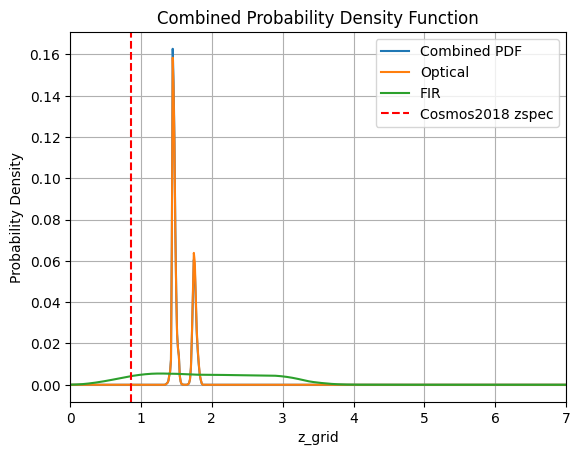

511


In [374]:
a = get_broadband_photometry(193)

In [ ]:
a = get_broadband_photometry(0)

In [390]:
z_photometry = []
z_spec = []
z_EAZY = []


0
1


In [55]:
z_photometry = []
z_spec = []
z_EAZY = []
z_photo_dub = []


In [444]:

for i in range(200):
    
    i = i + 50
    
    print('_____________ Galaxy ID : ', i )   
    
    get_z = get_broadband_photometry(i)
    
    z_photometry.append(get_z[0])
    z_spec.append(get_z[1])
    z_EAZY.append(get_z[2])
    z_photo_dub.append(get_z[3])



    

    

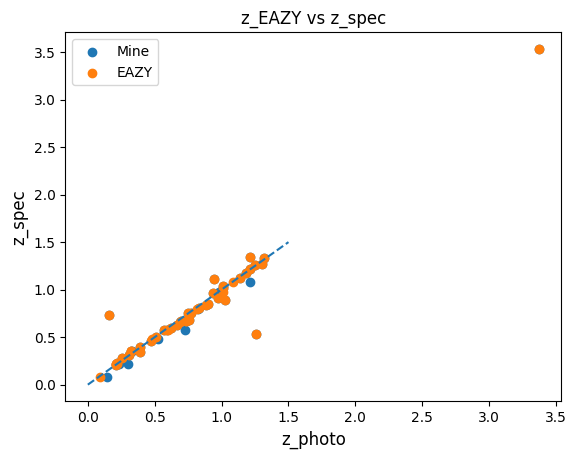

In [418]:

plt.title('z_photo vs z_spec')
plt.scatter(z_photometry,z_spec, label = 'Mine')

plt.title('z_EAZY vs z_spec')
plt.scatter(z_EAZY,z_spec, label = 'EAZY')

plt.plot([0,1.5],[0,1.5], linestyle = 'dashed')
plt.xlabel('z_photo', fontsize = 12)
plt.ylabel('z_spec', fontsize = 12)

plt.legend()

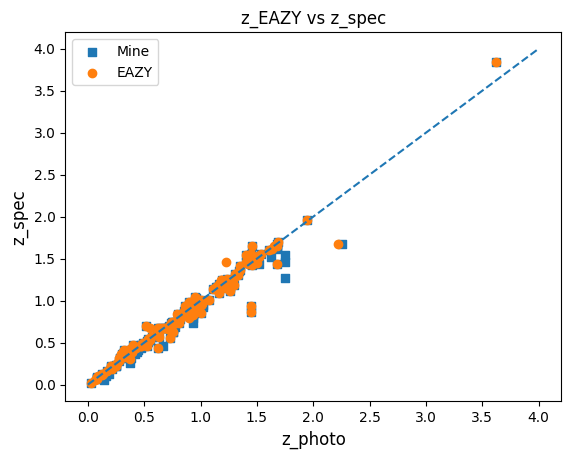

In [426]:

plt.title('z_photo vs z_spec')
plt.scatter(z_photometry,z_spec, label = 'Mine', marker='s')

plt.title('z_EAZY vs z_spec')
plt.scatter(z_EAZY,z_spec, label = 'EAZY')

plt.plot([0,4],[0,4], linestyle = 'dashed')
plt.xlabel('z_photo', fontsize = 12)
plt.ylabel('z_spec', fontsize = 12)

plt.legend()

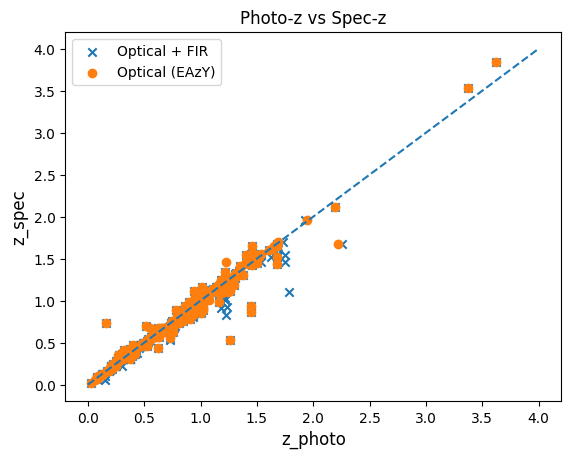

In [225]:

plt.title('Photo-z vs Spec-z')
plt.scatter(z_photometry,z_spec, label = 'Optical + FIR', marker='x')

plt.scatter(z_EAZY,z_spec, label = 'Optical (EAzY)')

plt.plot([0,4],[0,4], linestyle = 'dashed')
plt.xlabel('z_photo', fontsize = 12)
plt.ylabel('z_spec', fontsize = 12)

plt.legend()
plt.show()

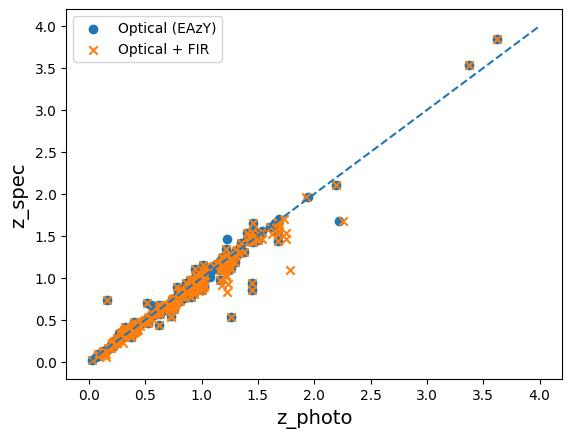

In [231]:


# plt.title('Photo-z vs Spec-z')


plt.scatter(z_EAZY,z_spec, label = 'Optical (EAzY)')

plt.scatter(z_photometry,z_spec, label = 'Optical + FIR', marker='x')

plt.plot([0,4],[0,4], linestyle = 'dashed')
plt.xlabel('z_photo', fontsize = 14)
plt.ylabel('z_spec', fontsize = 14)

plt.legend()
plt.show()

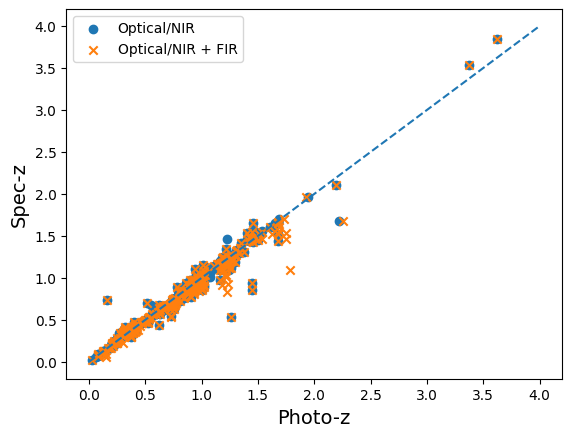

In [236]:


# plt.title('Photo-z vs Spec-z')


plt.scatter(z_EAZY,z_spec, label = 'Optical/NIR')

plt.scatter(z_photometry,z_spec, label = 'Optical/NIR + FIR', marker='x')

plt.plot([0,4],[0,4], linestyle = 'dashed')
plt.xlabel('Photo-z', fontsize = 14)
plt.ylabel('Spec-z', fontsize = 14)

plt.legend()
plt.show()

NameError: name 'plt' is not defined

_____________ Galaxy ID :  0
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [340.833687   342.23606406]


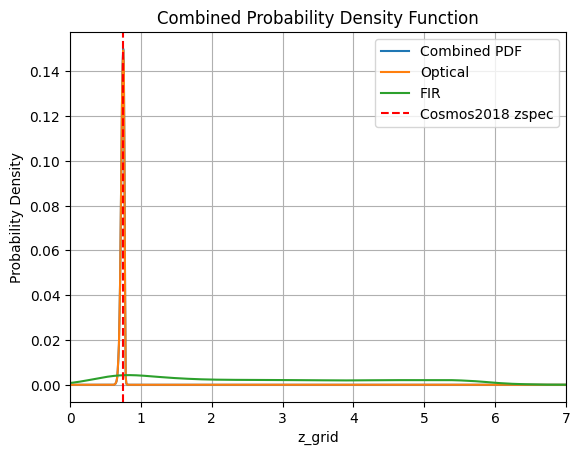

_____________ Galaxy ID :  1
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [284.98644811 287.96111231]


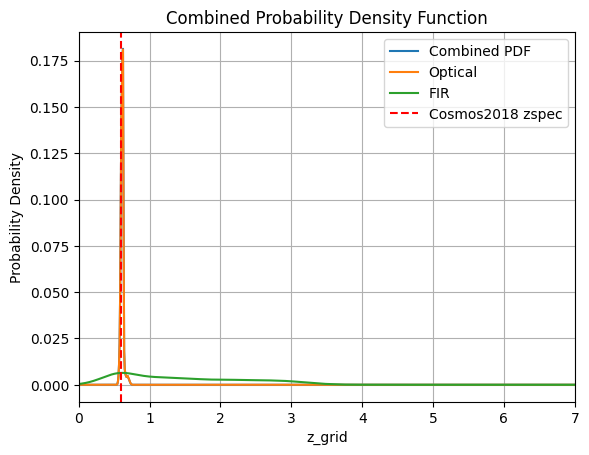

_____________ Galaxy ID :  2
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [202.92550409 207.47325808]


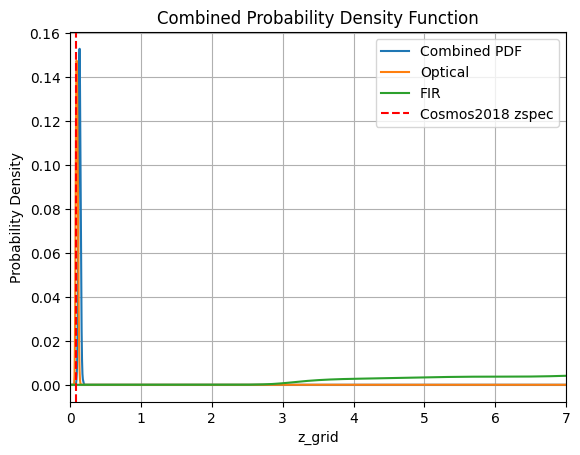

_____________ Galaxy ID :  3
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [349.33424206 364.45552901]


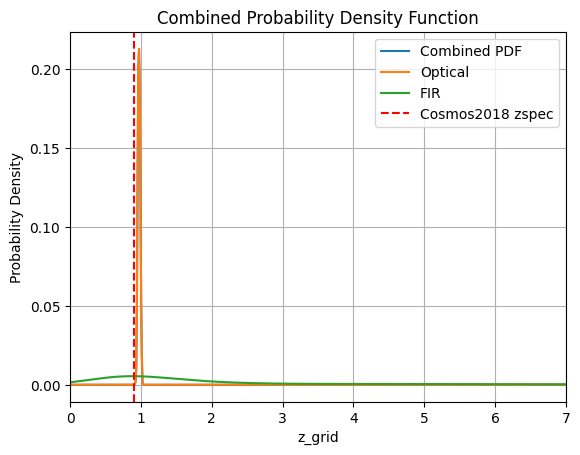

_____________ Galaxy ID :  4
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [255.88721872 221.72396911]


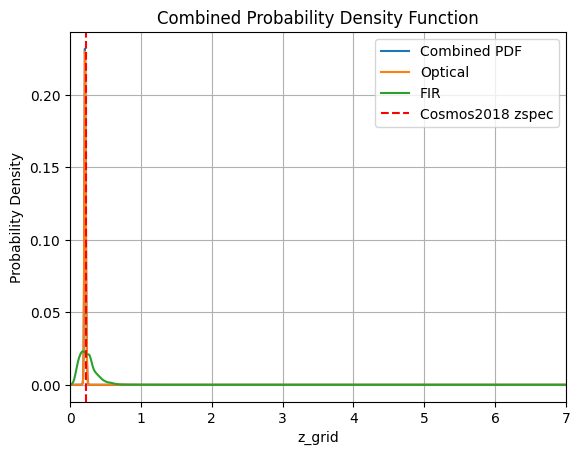

_____________ Galaxy ID :  5
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [301.3298872  296.17746886]


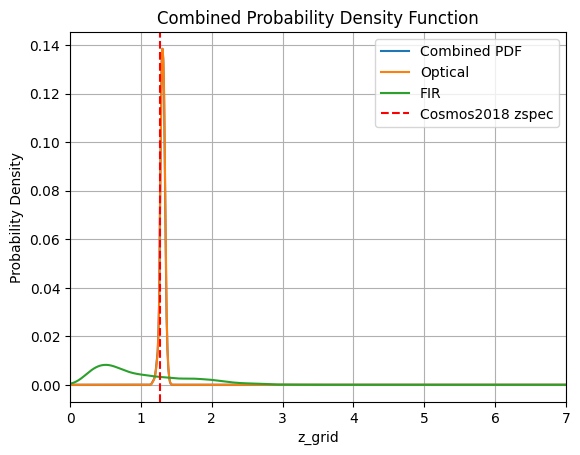

_____________ Galaxy ID :  6
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [287.20552827 281.44492863]


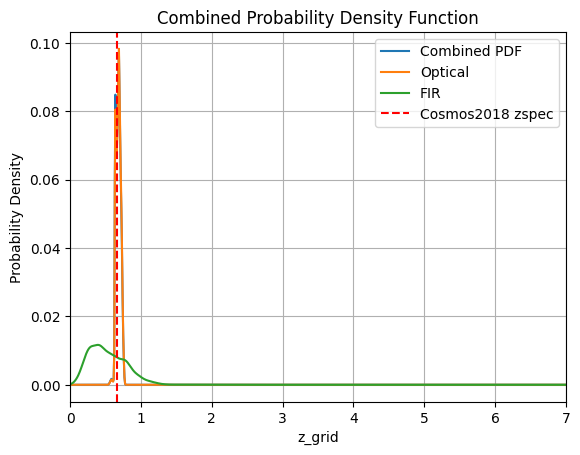

_____________ Galaxy ID :  7
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [249.70990671 238.98589485]


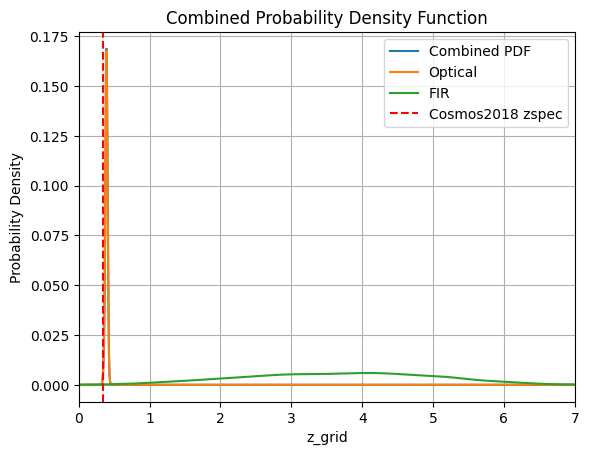

_____________ Galaxy ID :  8
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [227.23421486 227.75342637]


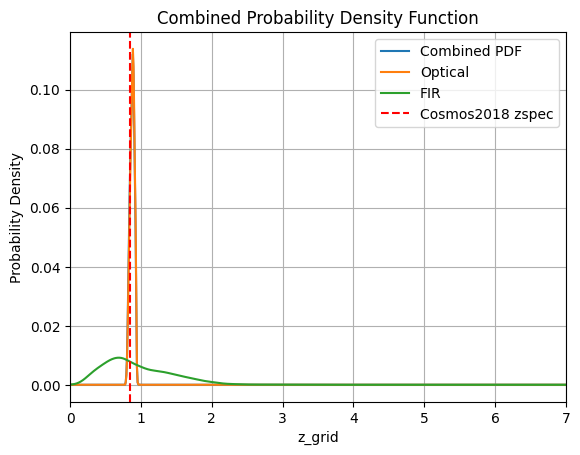

_____________ Galaxy ID :  9
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [304.67242311 306.75129556]


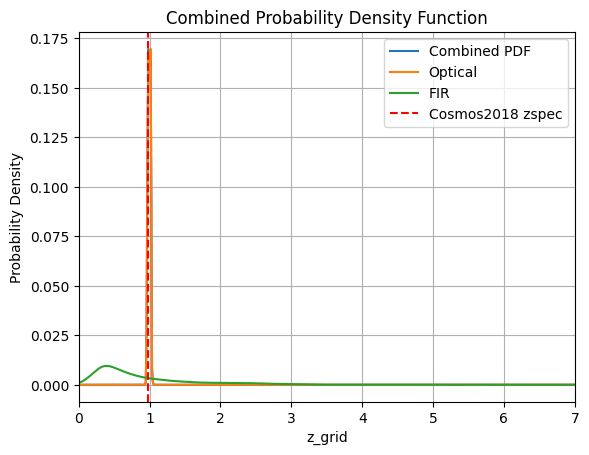

_____________ Galaxy ID :  10
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [242.70708969 242.58774401]


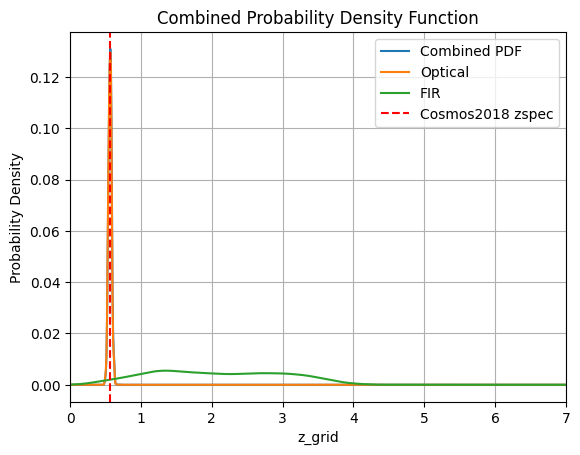

_____________ Galaxy ID :  11
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [306.88658276 304.06188333]


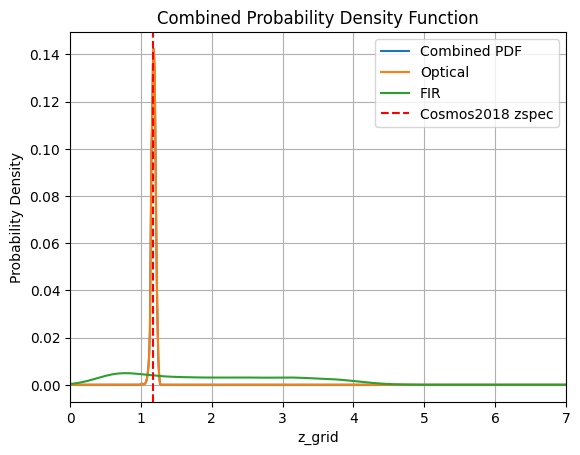

_____________ Galaxy ID :  12
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [212.33625469 209.58237997]


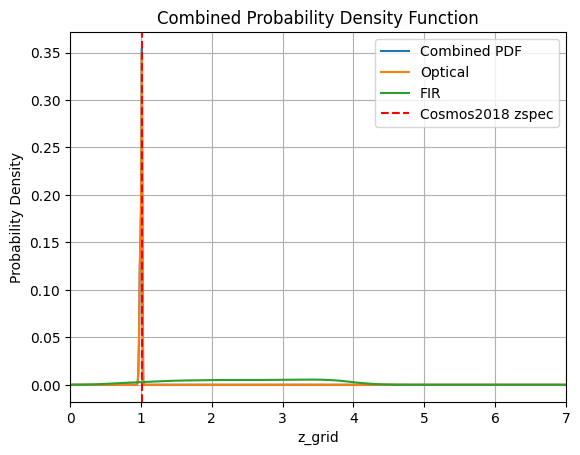

_____________ Galaxy ID :  13
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [222.39125907 217.51255818]


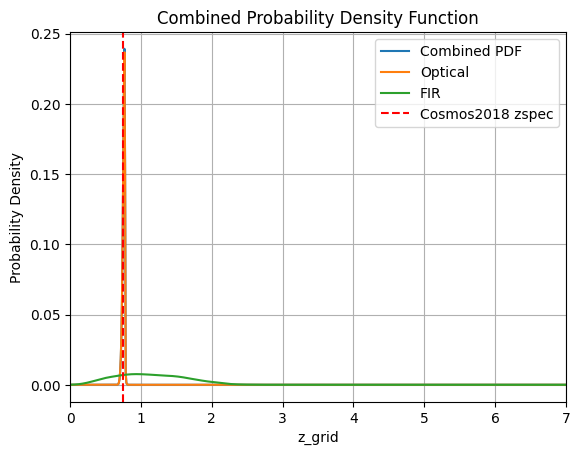

_____________ Galaxy ID :  14
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [251.45771544 249.3772071 ]


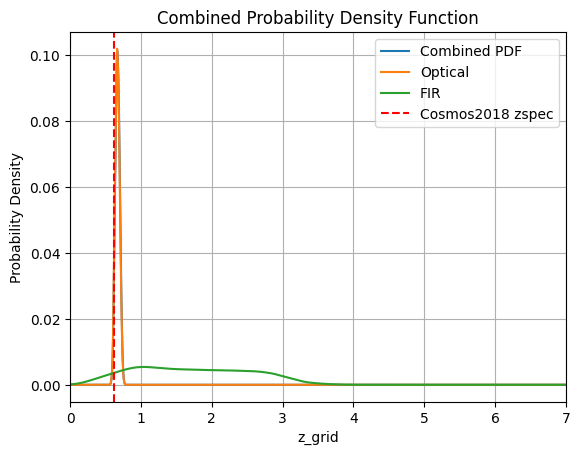

_____________ Galaxy ID :  15
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.43249648 316.61994867]


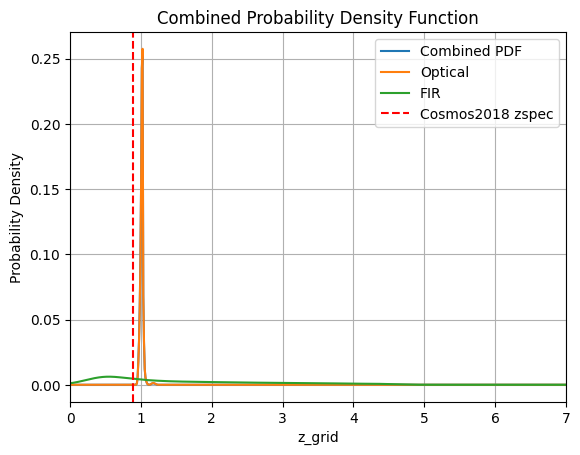

_____________ Galaxy ID :  16
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [247.40098092 245.09156087]


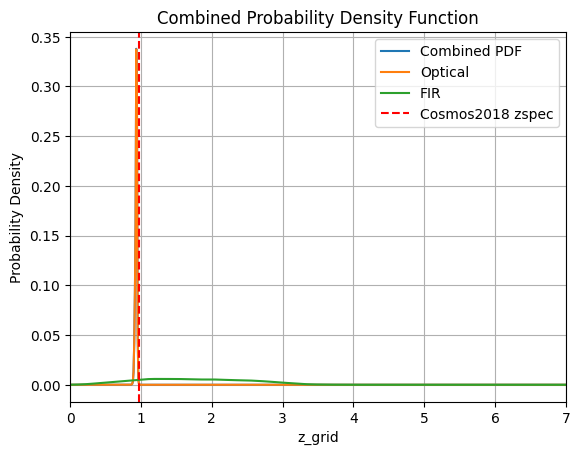

_____________ Galaxy ID :  17
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [226.4955163  224.47597954]


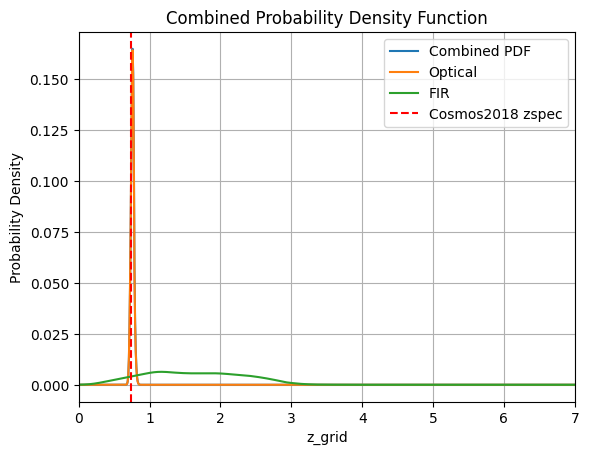

_____________ Galaxy ID :  18
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [197.65481232 198.29391349]


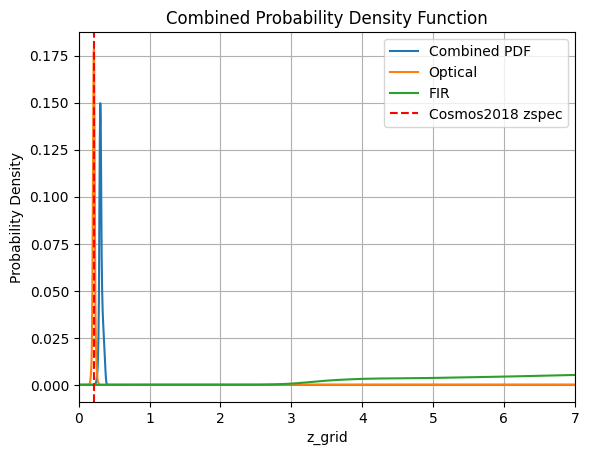

_____________ Galaxy ID :  19
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [333.09833807 335.15130635]


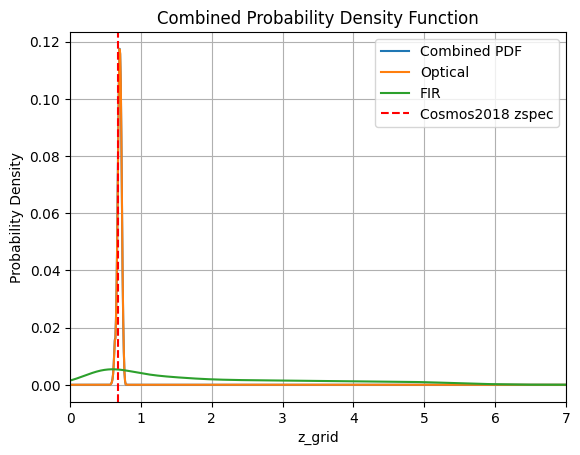

_____________ Galaxy ID :  20
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [321.06511318 324.92952525]


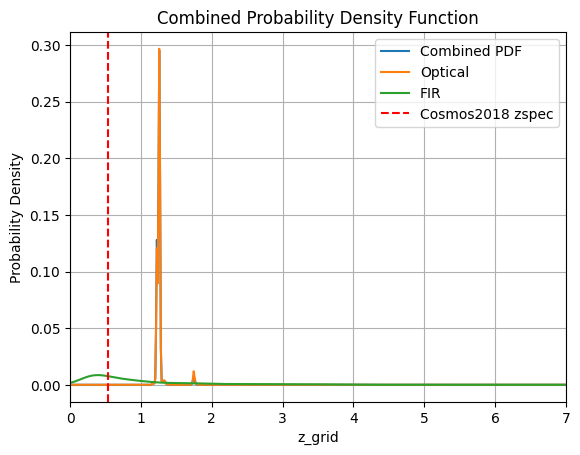

_____________ Galaxy ID :  21
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [310.14275457 310.90272456]


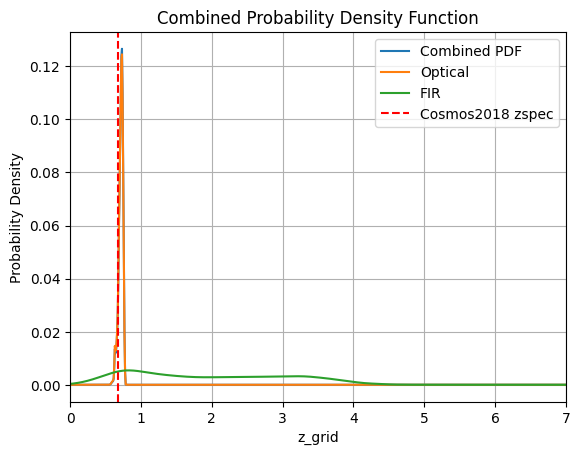

_____________ Galaxy ID :  22
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [276.73939727 273.05087594]


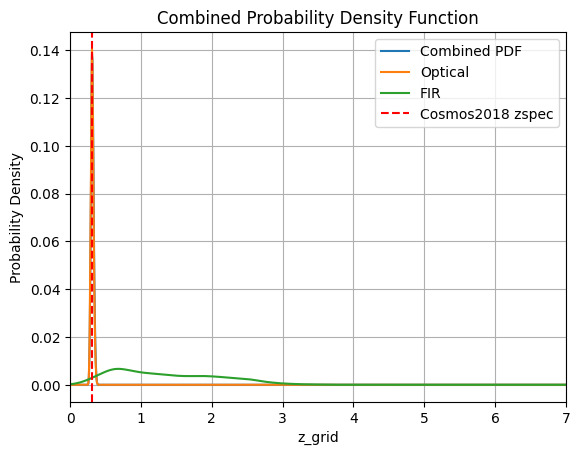

_____________ Galaxy ID :  23
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [176.575887   176.76717795]


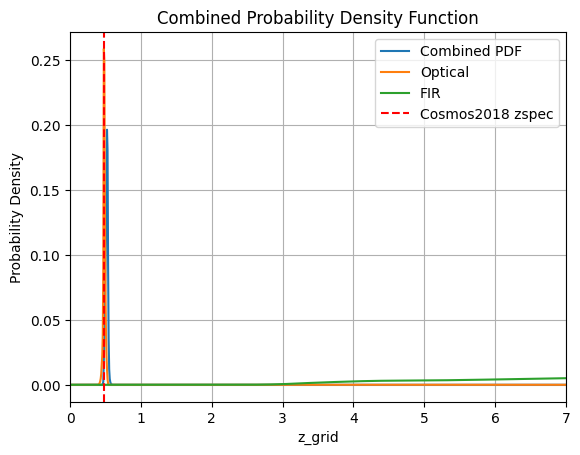

_____________ Galaxy ID :  24
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [266.93497077 191.59308881]


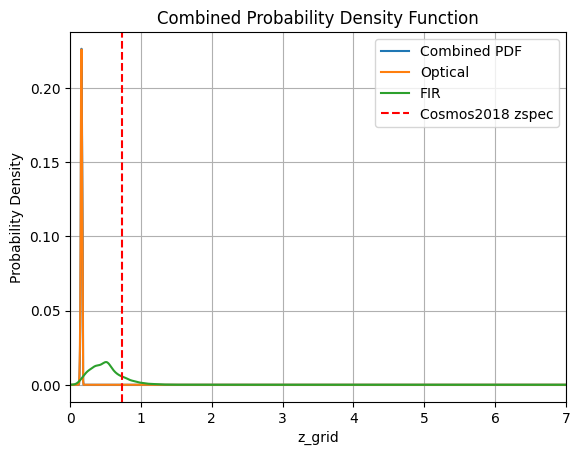

_____________ Galaxy ID :  25
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [280.36587425 286.12683826]


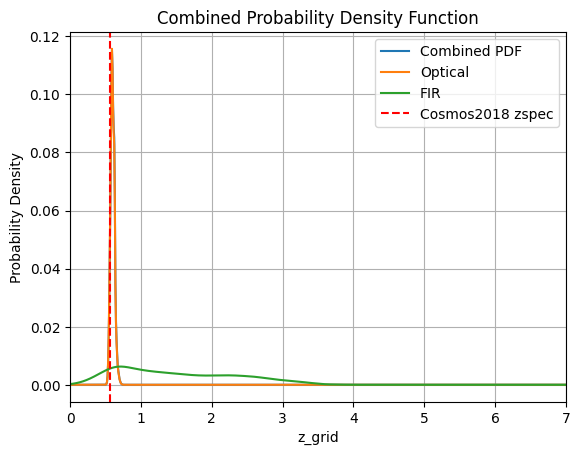

_____________ Galaxy ID :  26
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [254.05892361 223.84604574]


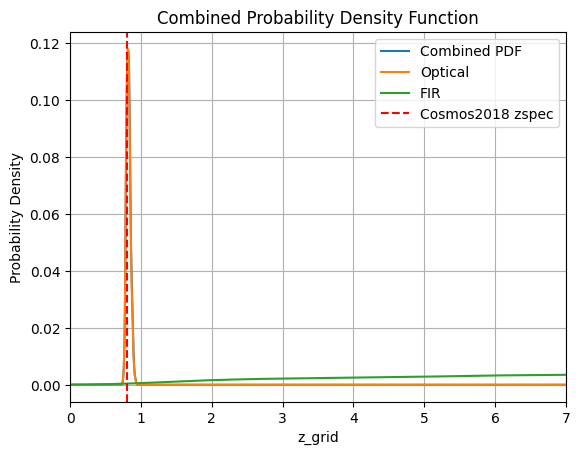

_____________ Galaxy ID :  27
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [352.39166241 352.83566208]


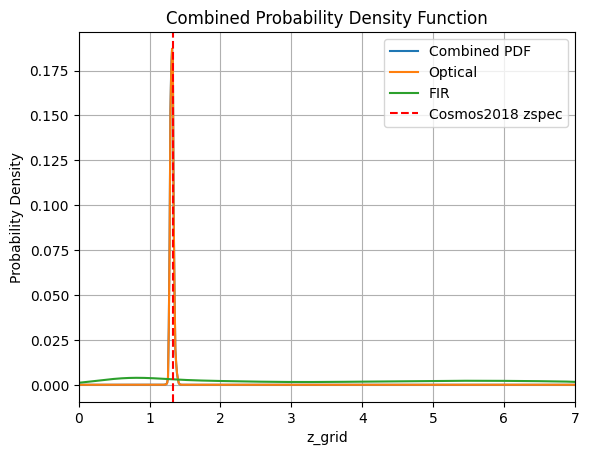

_____________ Galaxy ID :  28
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [307.34854519 308.58116027]


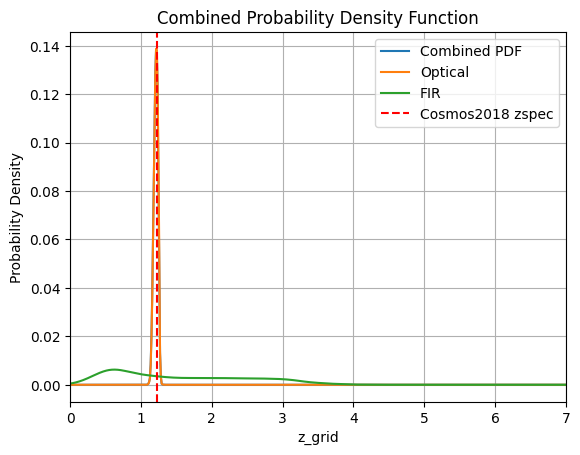

_____________ Galaxy ID :  29
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [208.85705908 219.68246575]


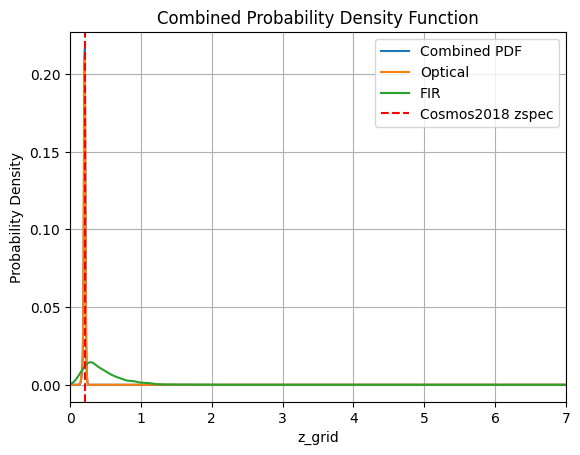

_____________ Galaxy ID :  30
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [205.66645563 205.93503927]


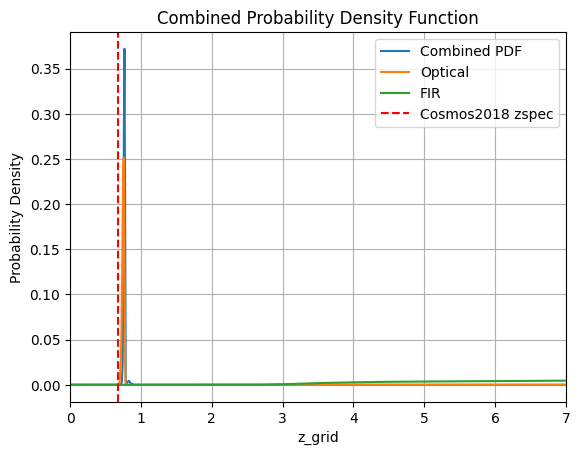

_____________ Galaxy ID :  31
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [259.8782039  252.52939263]


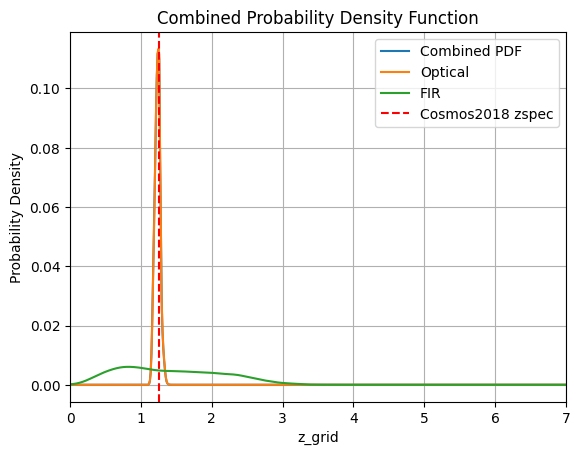

_____________ Galaxy ID :  32
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [292.37081906 290.00099661]


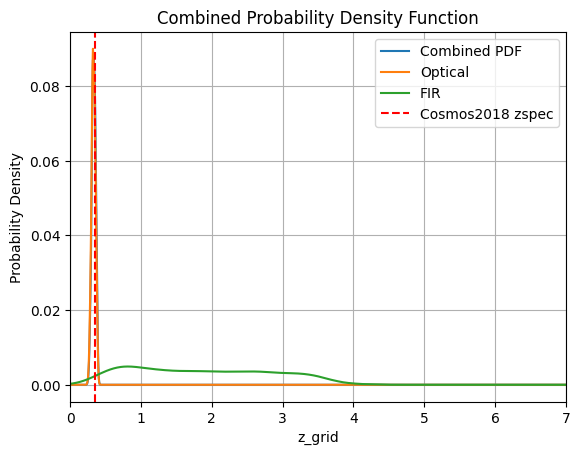

_____________ Galaxy ID :  33
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [340.1508656  338.34271453]


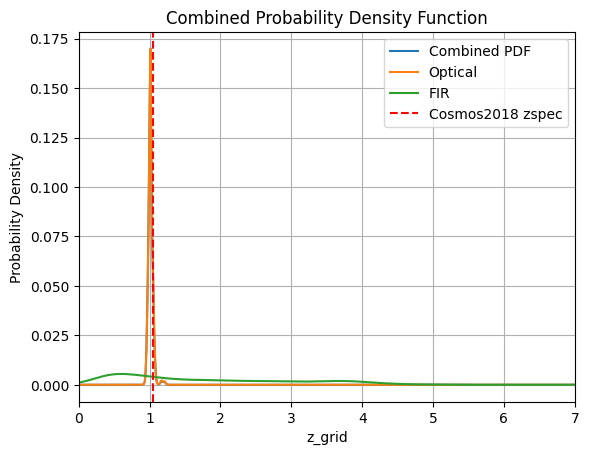

_____________ Galaxy ID :  34
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [337.19690799 334.67199173]


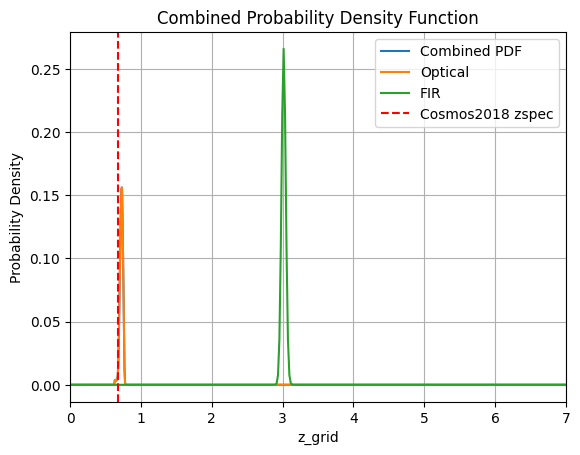

_____________ Galaxy ID :  35
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [206.73919893 206.8320421 ]


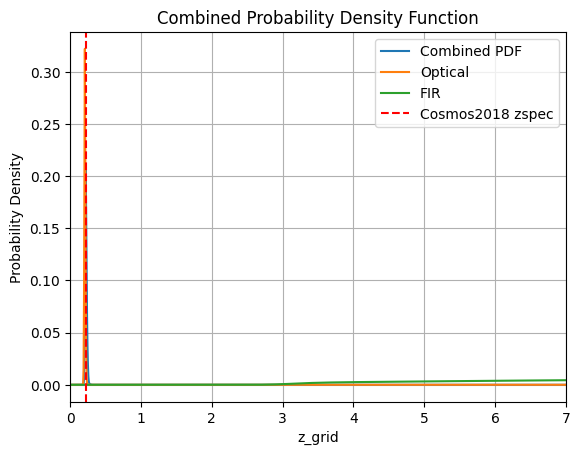

_____________ Galaxy ID :  36
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [321.10511348 319.81365859]


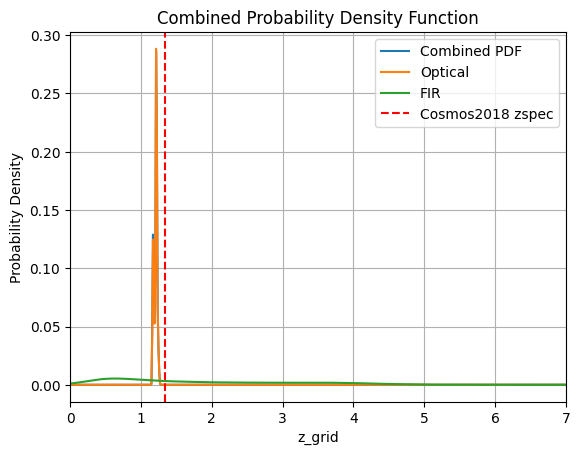

_____________ Galaxy ID :  37
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [234.86431048 231.86759527]


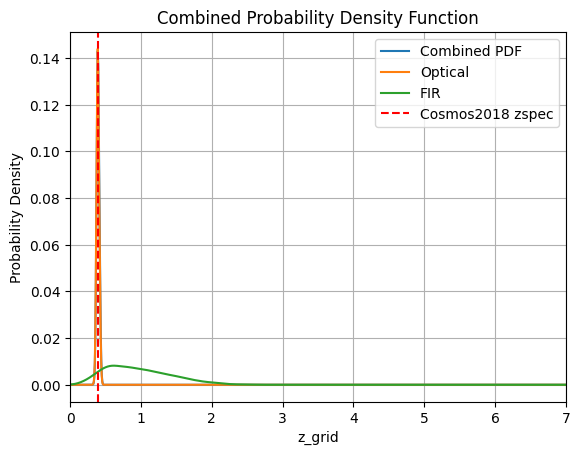

_____________ Galaxy ID :  38
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [212.33751767 214.29551867]


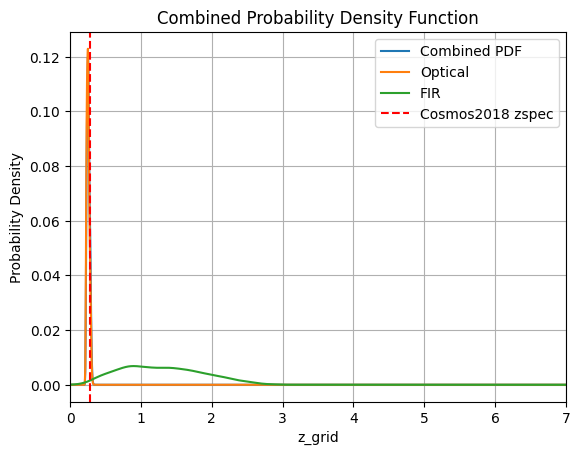

_____________ Galaxy ID :  39
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [314.88642792 318.58034048]


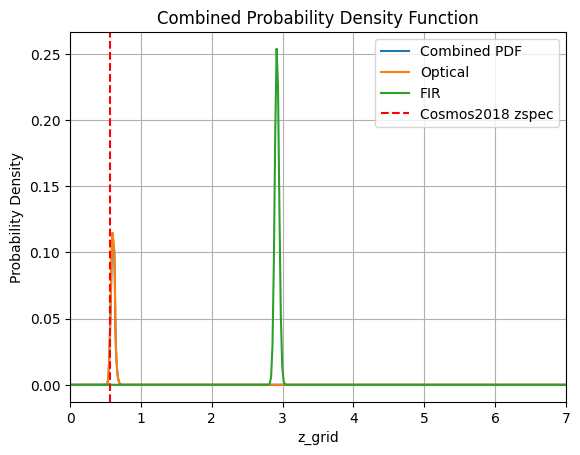

_____________ Galaxy ID :  40
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [284.63682263 239.38529302]


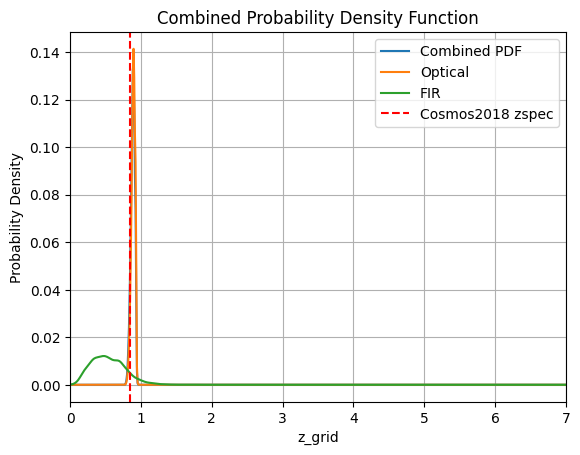

_____________ Galaxy ID :  41
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [220.44329418 201.37846657]


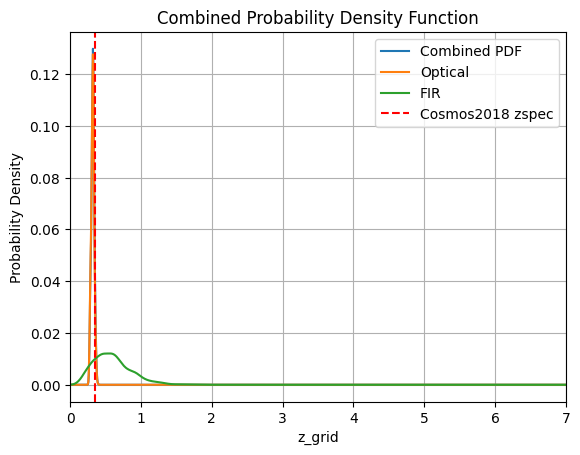

_____________ Galaxy ID :  42
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [345.19771532 348.22395564]


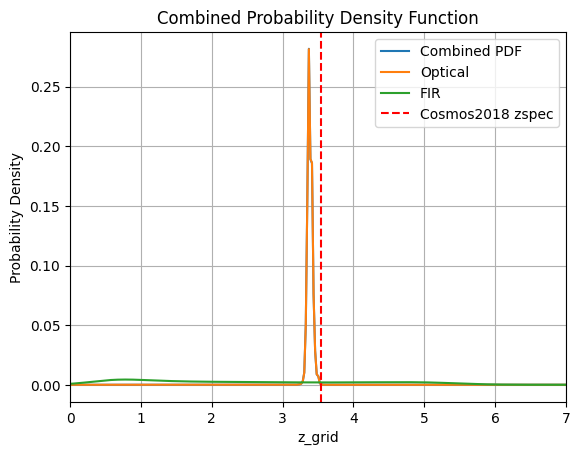

_____________ Galaxy ID :  43
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [236.55487812 244.81664563]


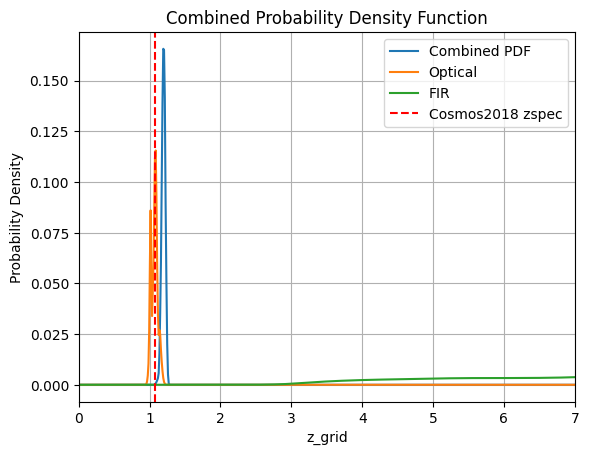

_____________ Galaxy ID :  44
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [278.70126678 279.13760442]


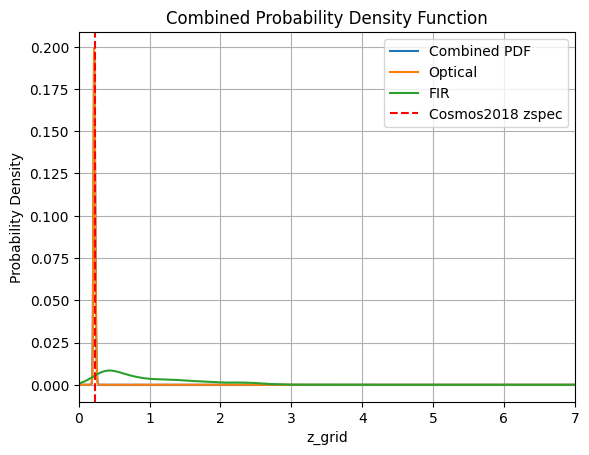

_____________ Galaxy ID :  45
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [243.08630923 243.77846239]


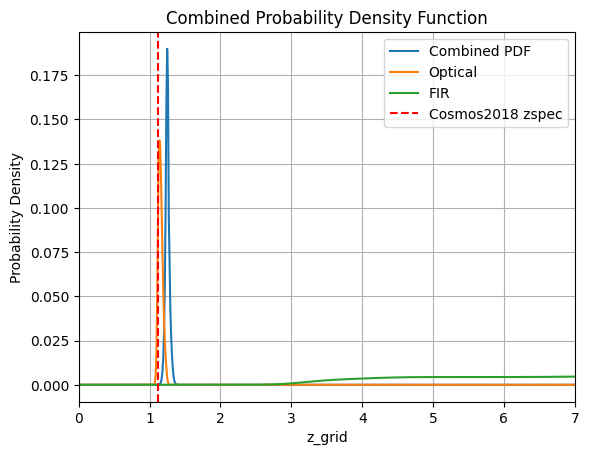

_____________ Galaxy ID :  46
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [315.08337339 313.7577342 ]


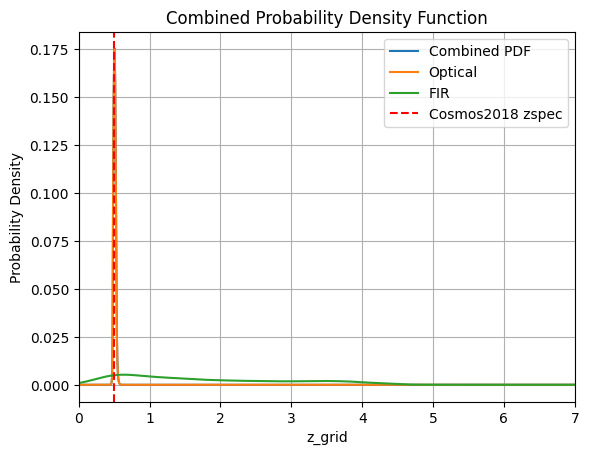

_____________ Galaxy ID :  47
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [208.41869017 209.97193871]


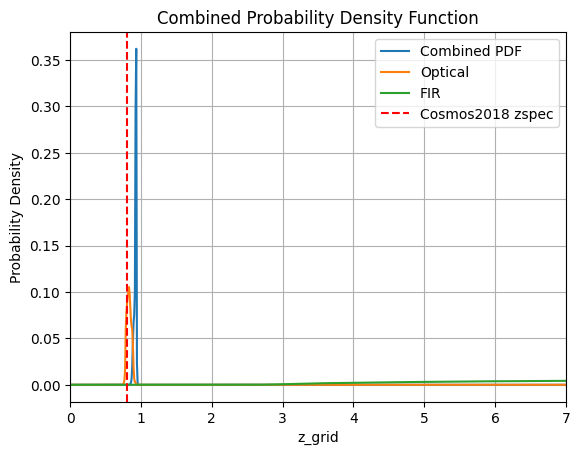

_____________ Galaxy ID :  48


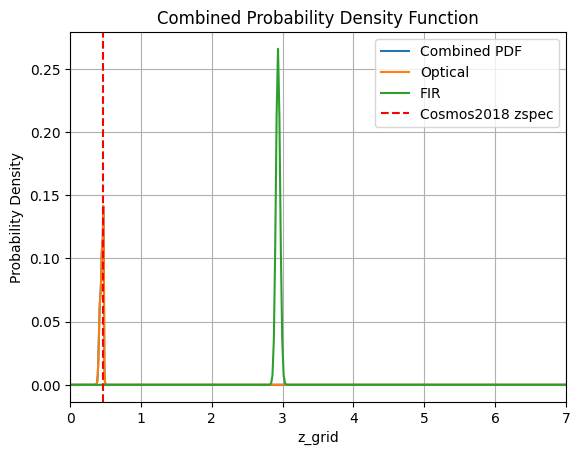

_____________ Galaxy ID :  49
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.53403683 324.5229808 ]


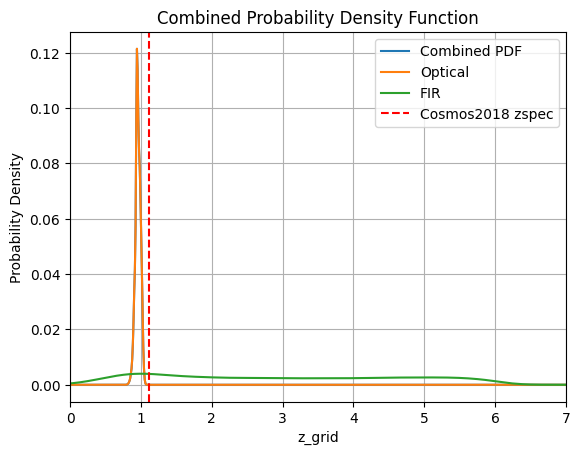

_____________ Galaxy ID :  50
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [331.29094378 320.87657433]


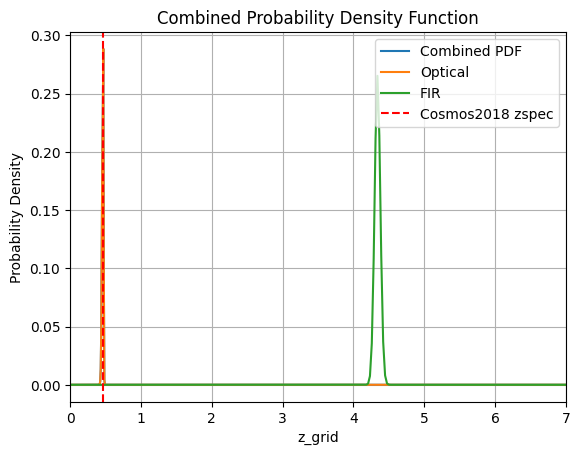

_____________ Galaxy ID :  51
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [309.62207854 309.77850748]


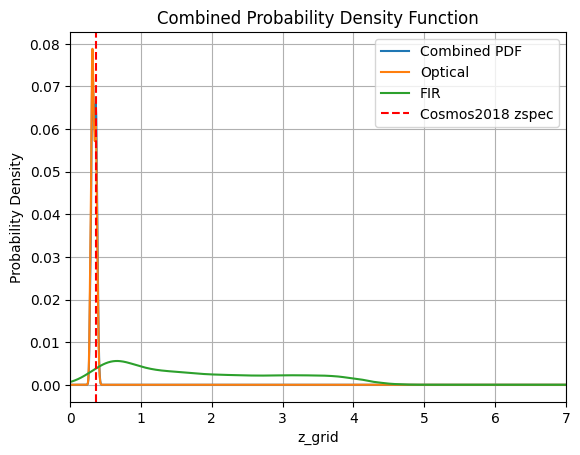

_____________ Galaxy ID :  52
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [191.30618943 187.08587398]


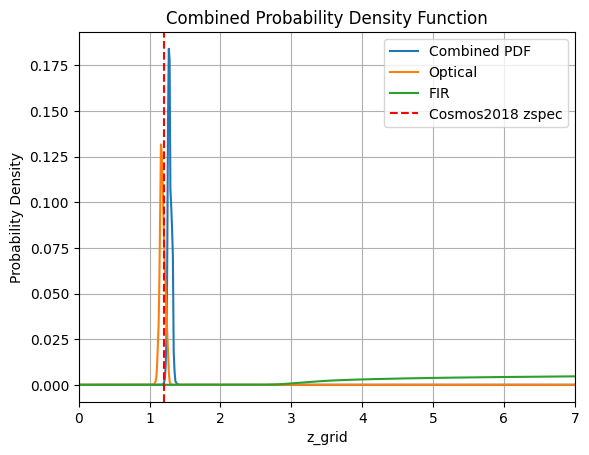

_____________ Galaxy ID :  53
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [343.5426277  345.41716608]


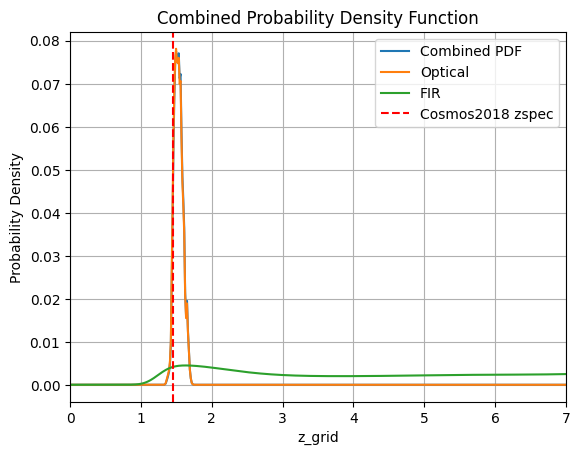

_____________ Galaxy ID :  54
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [273.43421068 277.54257785]


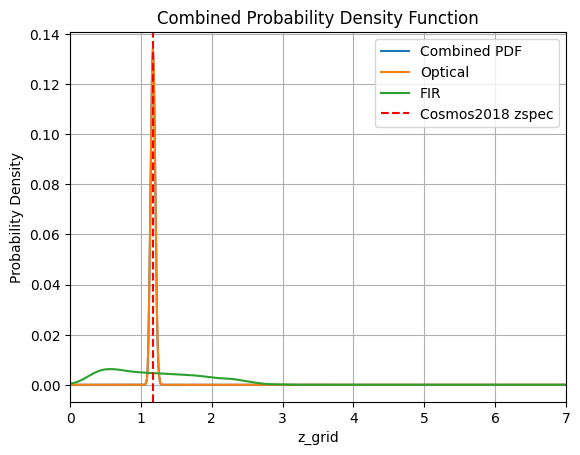

_____________ Galaxy ID :  55
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [301.3909766 296.5732642]


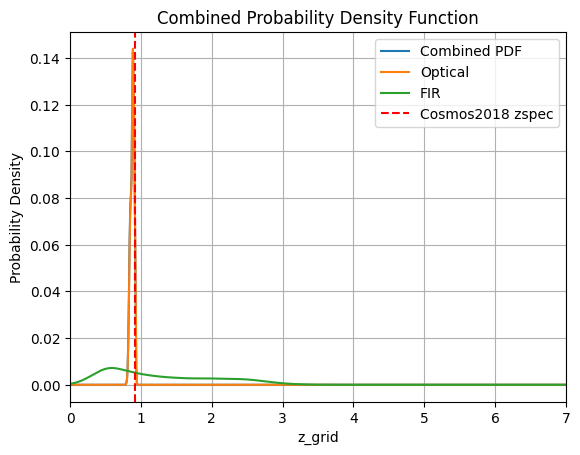

_____________ Galaxy ID :  56
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [299.09227847 295.56560561]


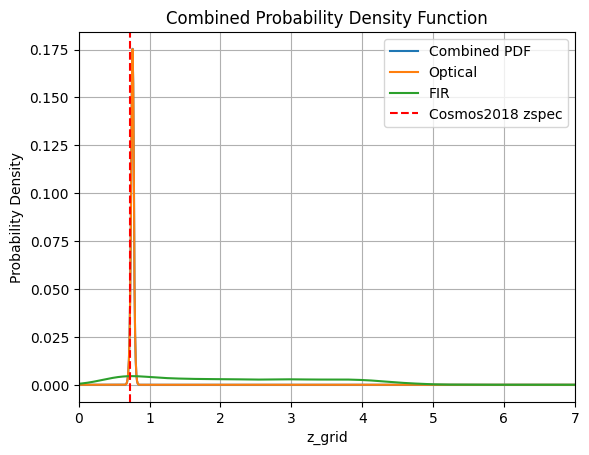

_____________ Galaxy ID :  57
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [178.16148411 181.0750923 ]


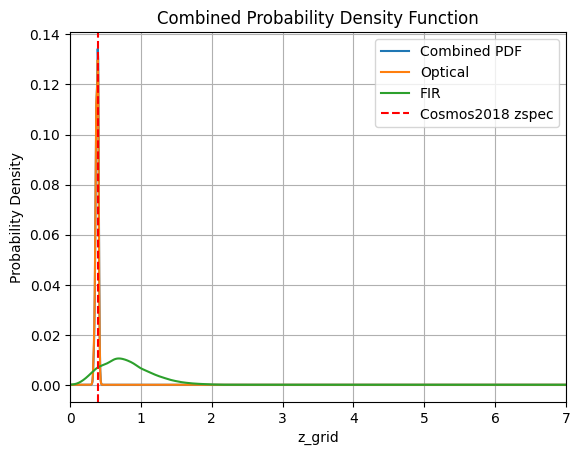

_____________ Galaxy ID :  58
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [346.81514419 347.55383821]


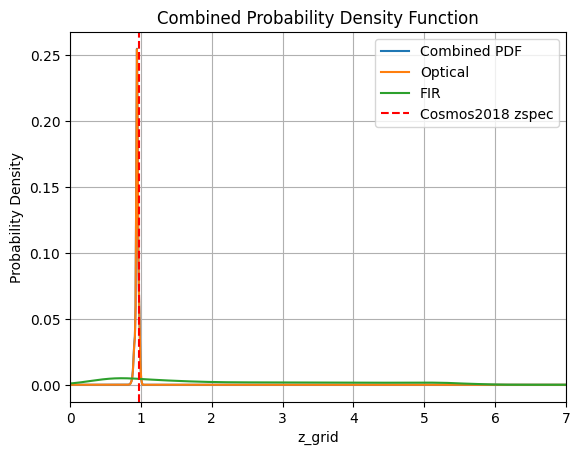

_____________ Galaxy ID :  59
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [269.87797536 267.43896276]


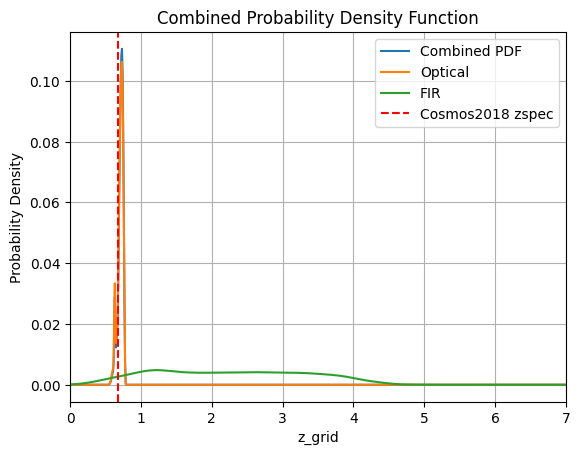

_____________ Galaxy ID :  60
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [255.42054273 245.9559141 ]


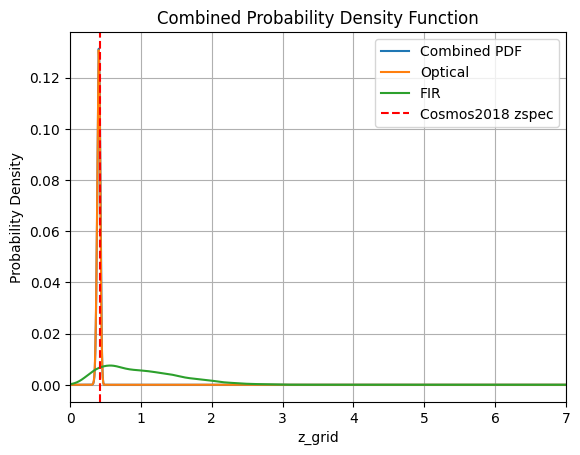

_____________ Galaxy ID :  61
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [300.62772881 304.36768721]


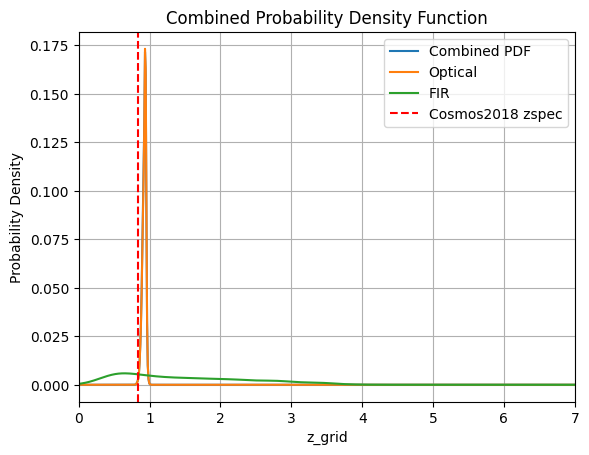

_____________ Galaxy ID :  62
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [308.35794279 308.50878789]


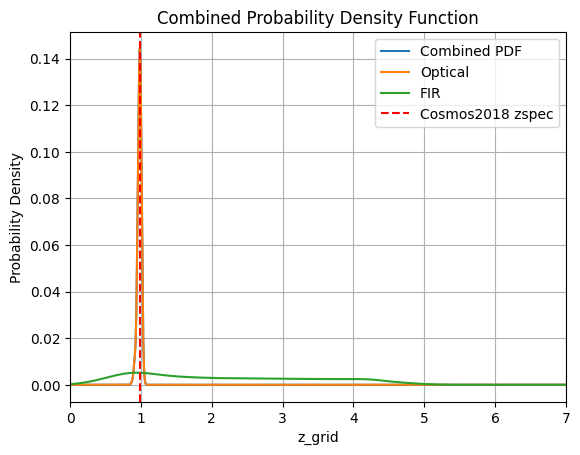

_____________ Galaxy ID :  63
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [328.74946763 331.08975679]


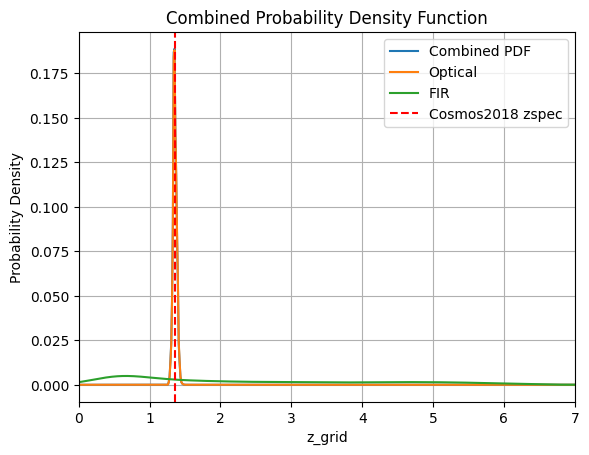

_____________ Galaxy ID :  64
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [274.80495705 276.15388   ]


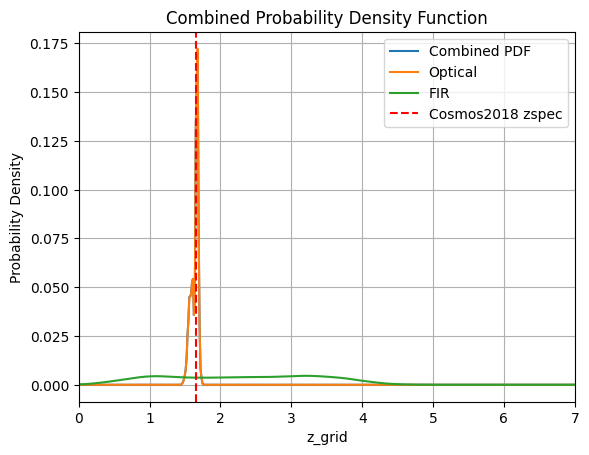

_____________ Galaxy ID :  65
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [307.68811699 320.33409702]


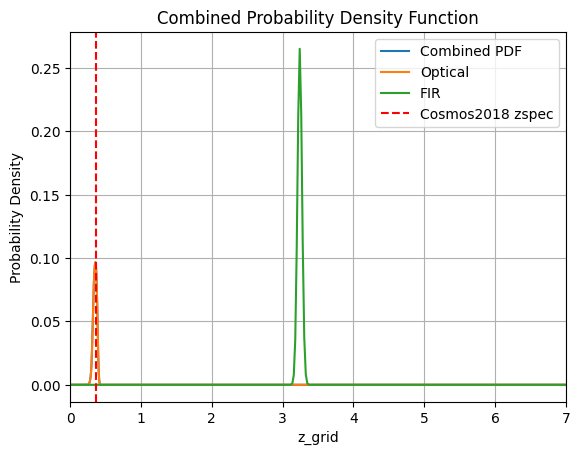

_____________ Galaxy ID :  66
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [275.18726536 227.41120458]


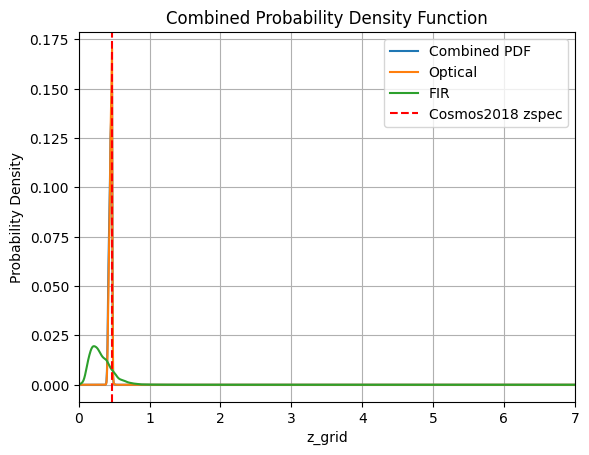

_____________ Galaxy ID :  67
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [223.82989392 216.85818827]


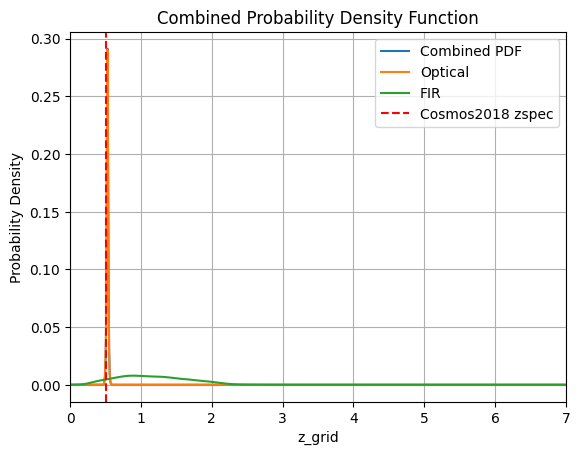

_____________ Galaxy ID :  68
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [314.04778166 315.28285532]


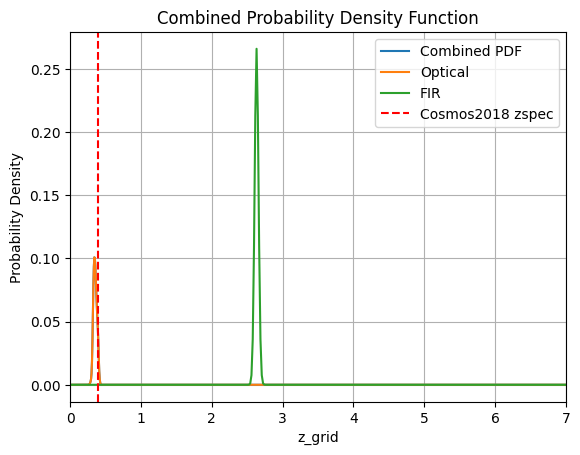

_____________ Galaxy ID :  69
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [294.13307473 293.50124413]


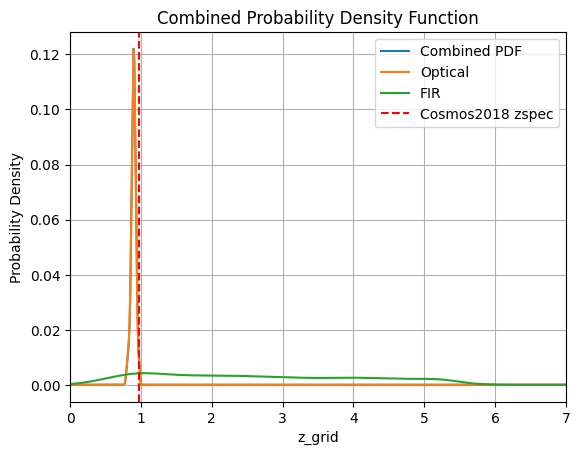

_____________ Galaxy ID :  70
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [201.23246452 204.77839516]


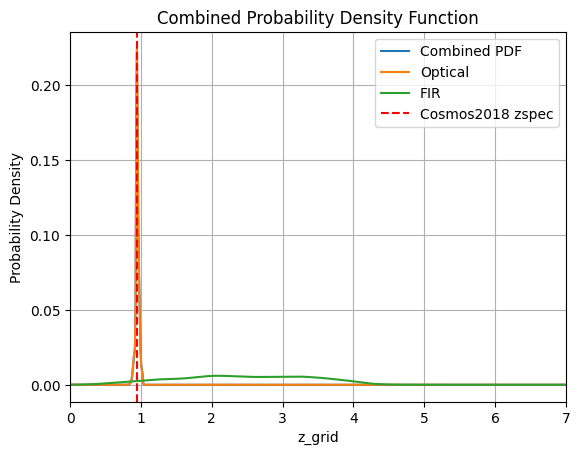

_____________ Galaxy ID :  71
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [200.10900766 196.5849046 ]


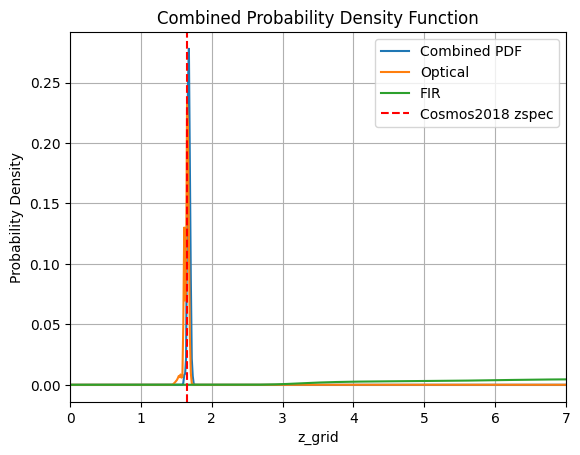

_____________ Galaxy ID :  72
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [327.7276006  327.12228926]


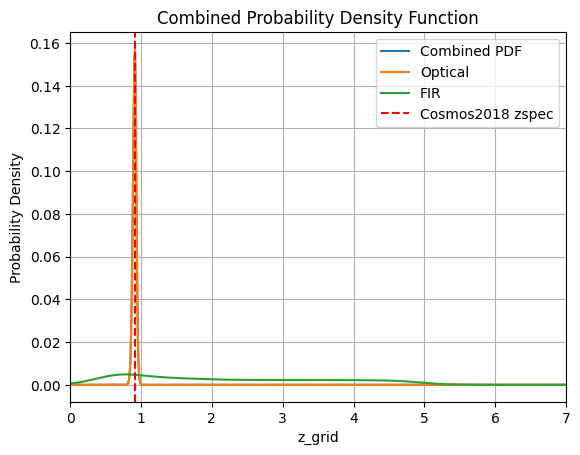

_____________ Galaxy ID :  73
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [223.60632528 218.09413252]


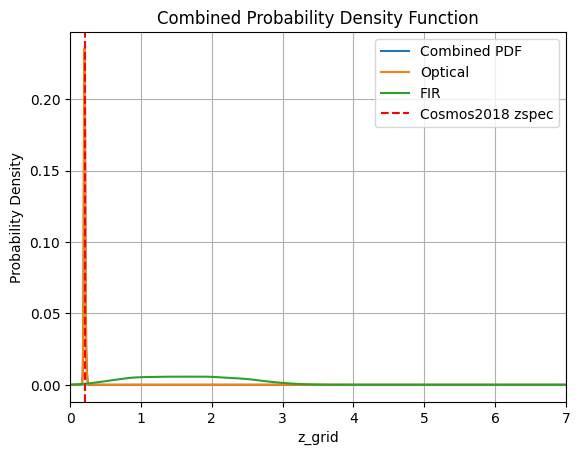

_____________ Galaxy ID :  74
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [262.32121113 260.54583112]


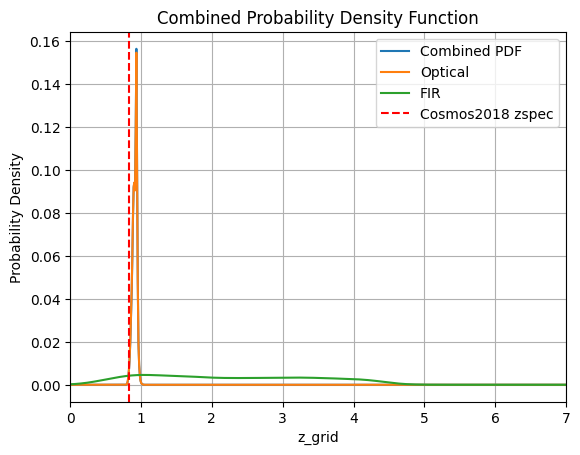

_____________ Galaxy ID :  75
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [226.13411667 219.56902195]


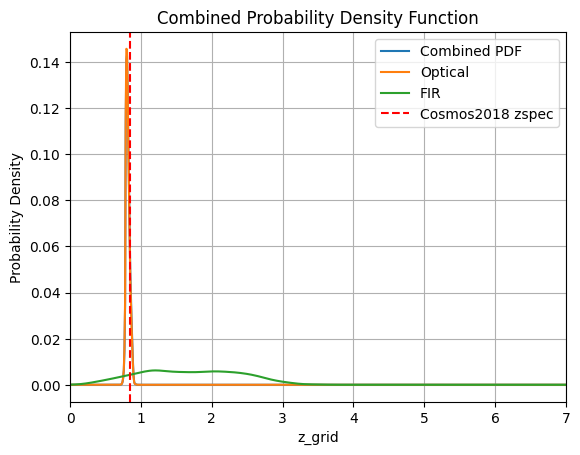

_____________ Galaxy ID :  76
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [280.6262097  285.76677861]


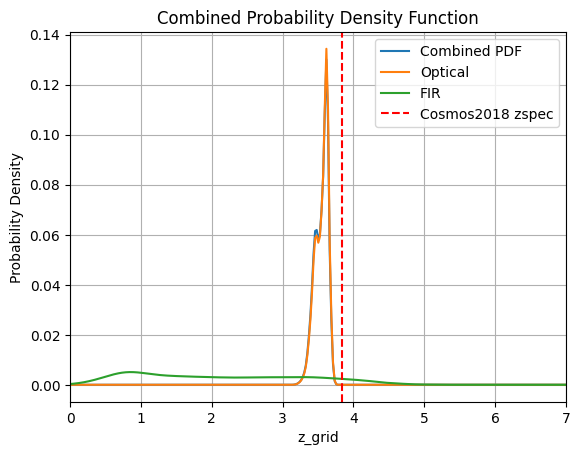

_____________ Galaxy ID :  77
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [300.54633313 297.80189858]


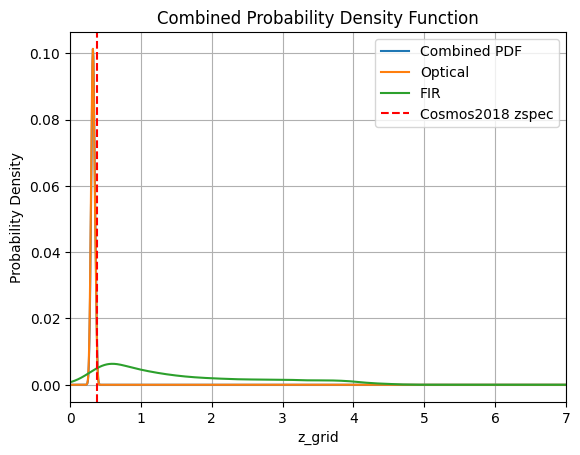

_____________ Galaxy ID :  78
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [304.88957817 306.74200652]


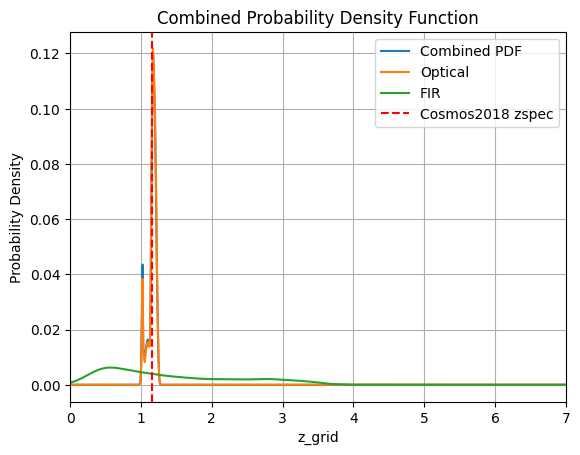

_____________ Galaxy ID :  79
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [259.97797344 255.58708821]


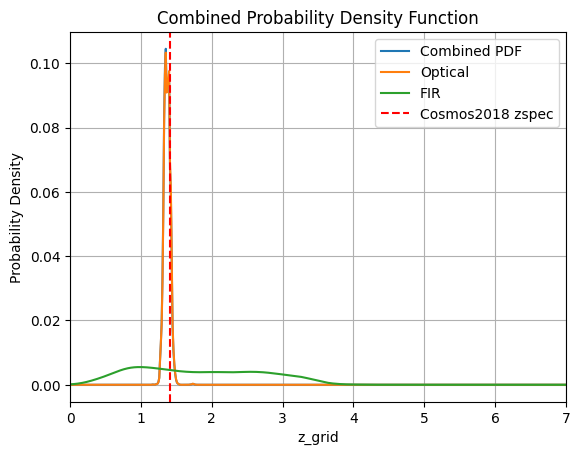

_____________ Galaxy ID :  80
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [216.91131252 204.8739254 ]


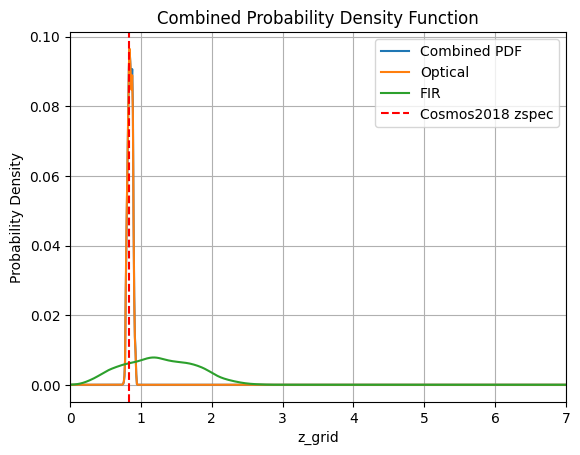

_____________ Galaxy ID :  81
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [254.76822321 217.48701406]


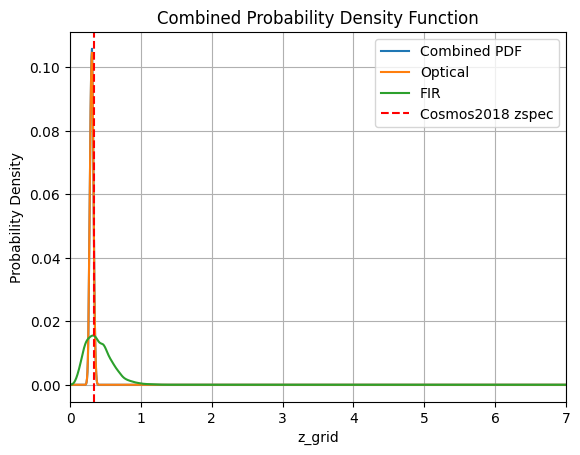

_____________ Galaxy ID :  82
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [263.8018774  261.71632465]


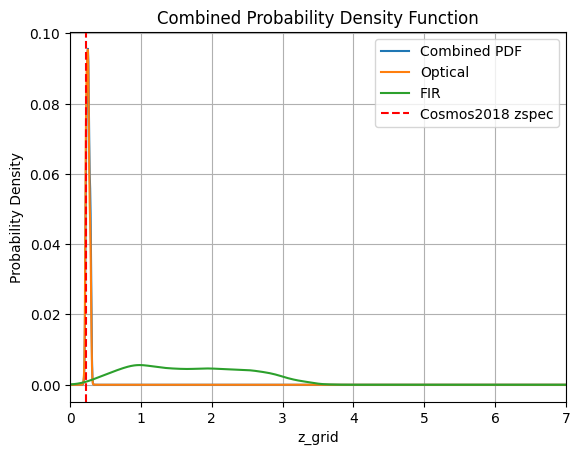

_____________ Galaxy ID :  83
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [300.34864903 297.62631893]


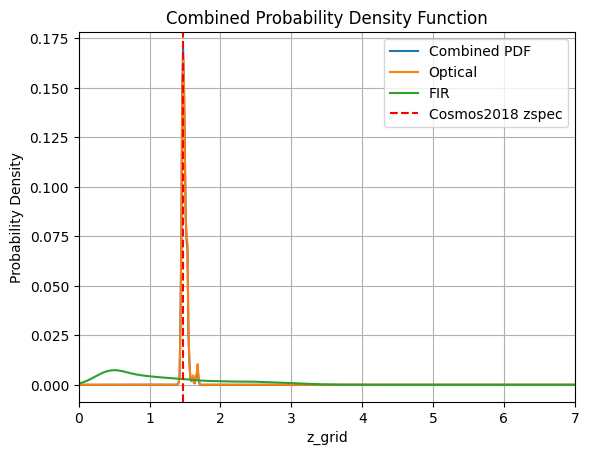

_____________ Galaxy ID :  84
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [281.68562855 283.58462732]


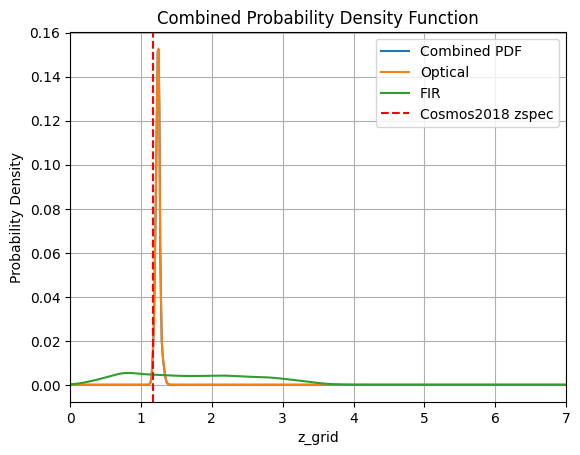

_____________ Galaxy ID :  85
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [302.74626865 301.34779745]


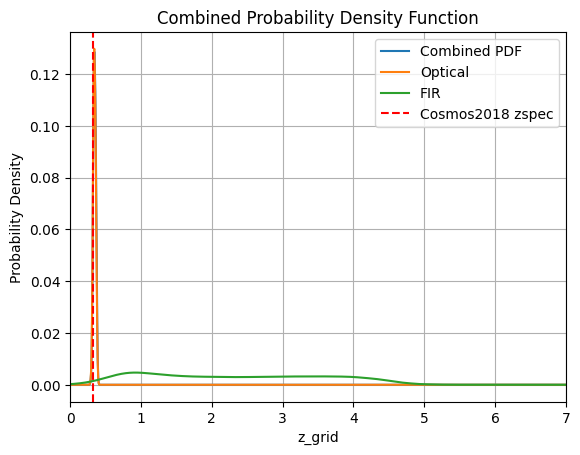

_____________ Galaxy ID :  86
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [192.36248233 188.66869339]


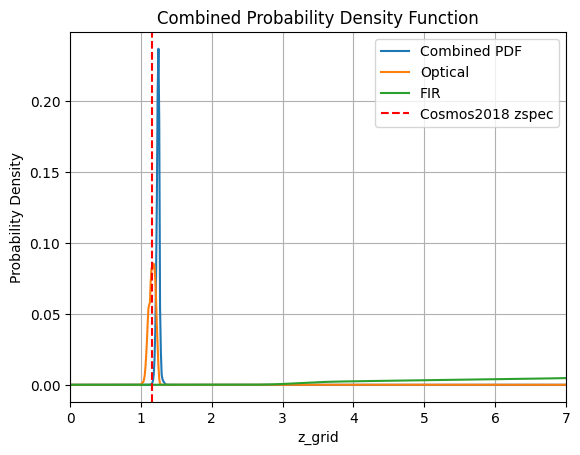

_____________ Galaxy ID :  87
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [258.37858189 249.66055542]


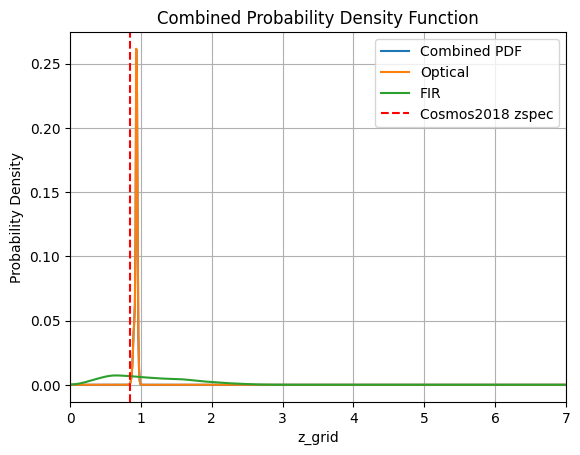

_____________ Galaxy ID :  88
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [222.19622096 215.19328442]


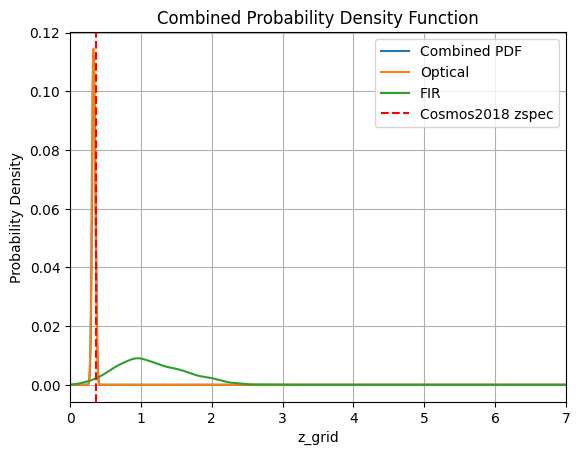

_____________ Galaxy ID :  89
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [276.1809539  274.45370542]


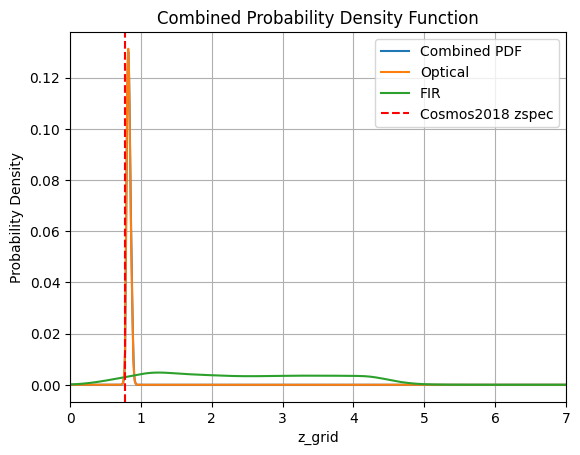

_____________ Galaxy ID :  90
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [228.97981672 218.80895799]


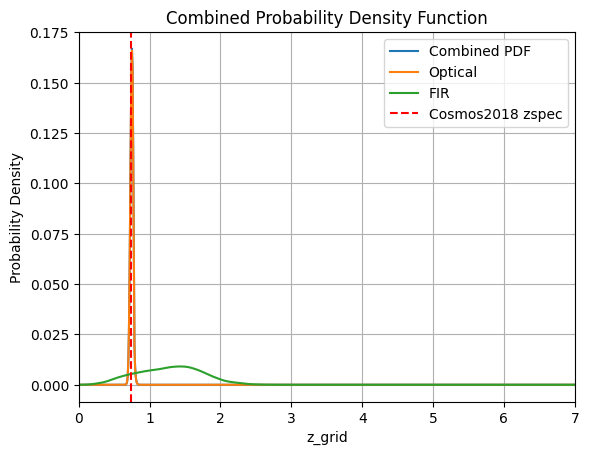

_____________ Galaxy ID :  91
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [206.65642779 203.99520484]


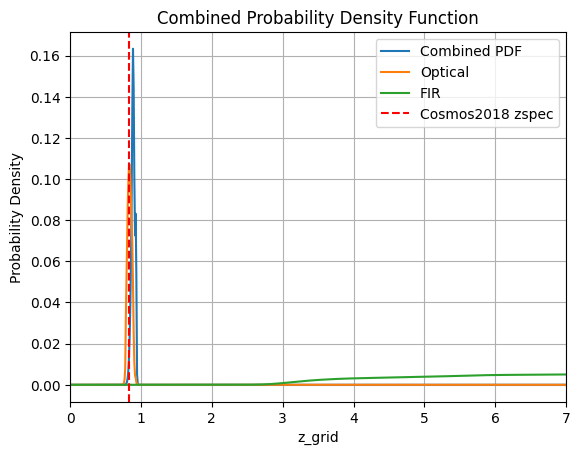

_____________ Galaxy ID :  92
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [218.56505345 214.33014237]


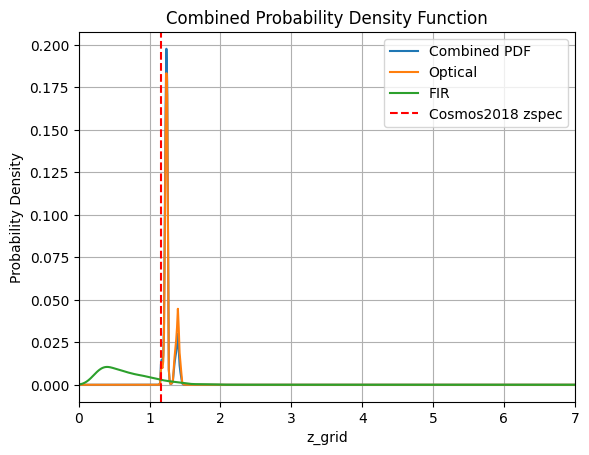

_____________ Galaxy ID :  93
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [325.56552112 323.75650653]


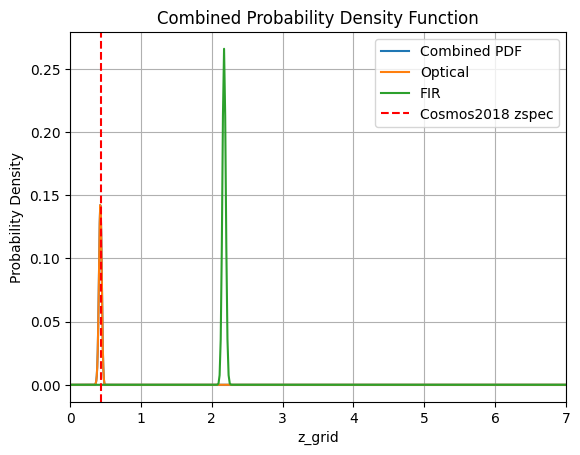

_____________ Galaxy ID :  94
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [181.76710303 180.67901513]


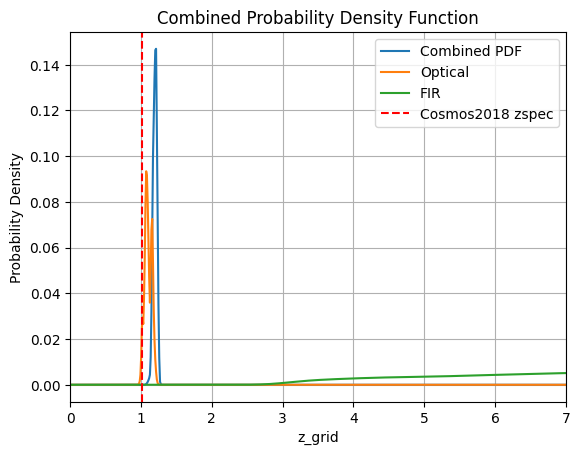

_____________ Galaxy ID :  95
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [334.29104208 336.35944574]


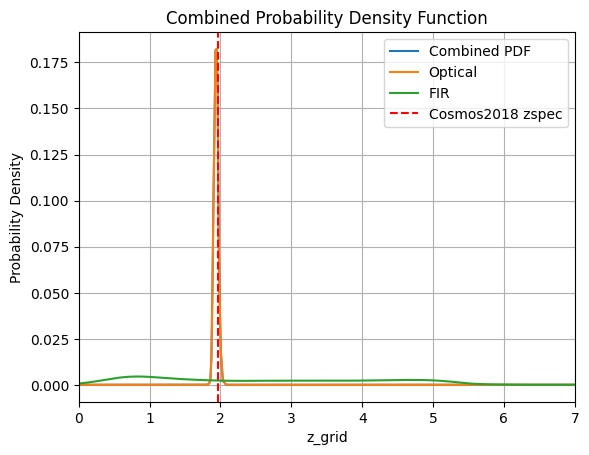

_____________ Galaxy ID :  96
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [207.07424148 207.23629177]


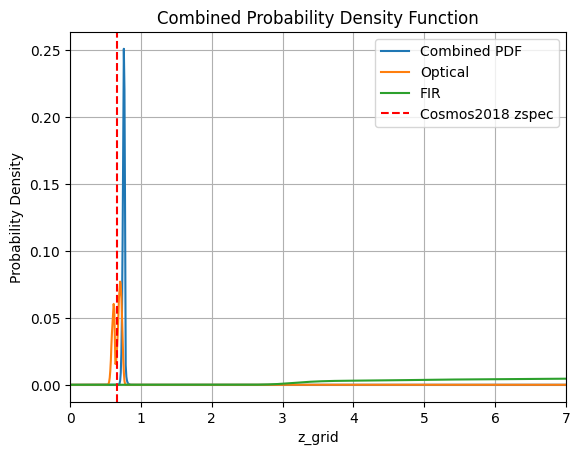

_____________ Galaxy ID :  97
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [322.59638445 322.18542628]


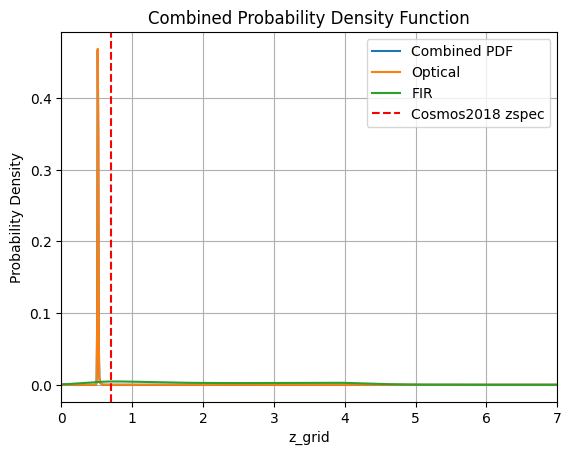

_____________ Galaxy ID :  98
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [300.70322293 295.84237448]


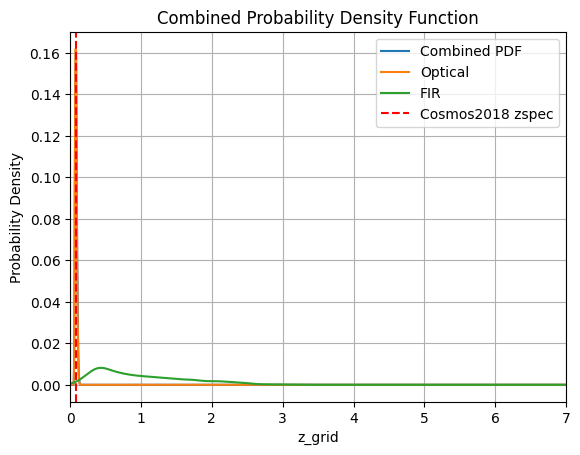

_____________ Galaxy ID :  99
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [264.56624807 249.25854089]


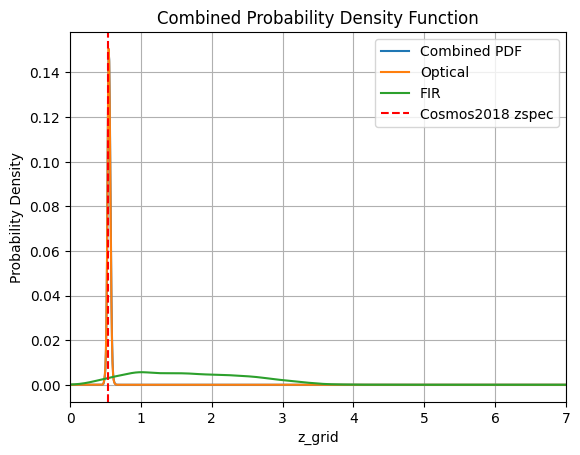

_____________ Galaxy ID :  100
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [305.31567543 304.90268434]


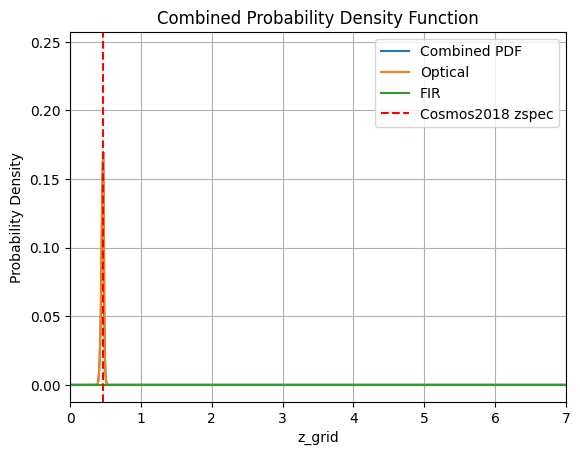

_____________ Galaxy ID :  101
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [353.61352193 371.80096497]


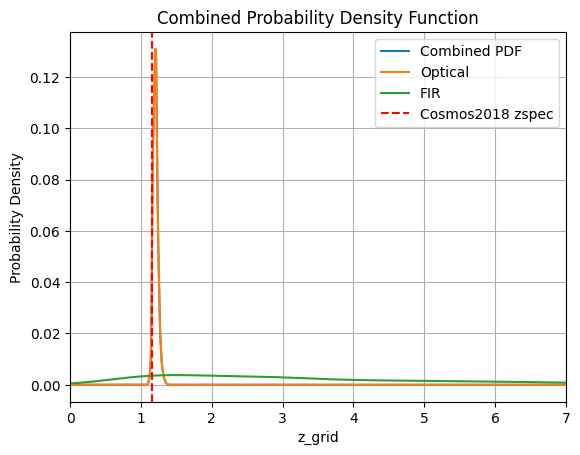

_____________ Galaxy ID :  102
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [297.98885792 296.01605988]


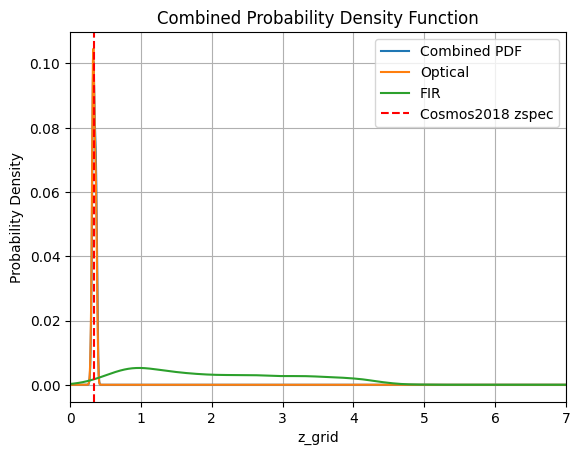

_____________ Galaxy ID :  103
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [310.00022606 310.76683322]


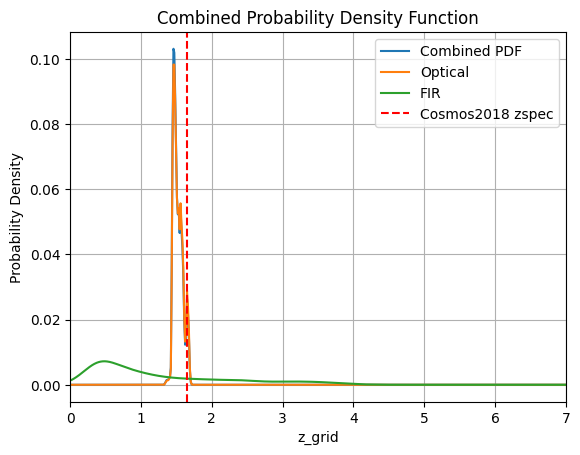

_____________ Galaxy ID :  104
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [244.76910011 248.61197852]


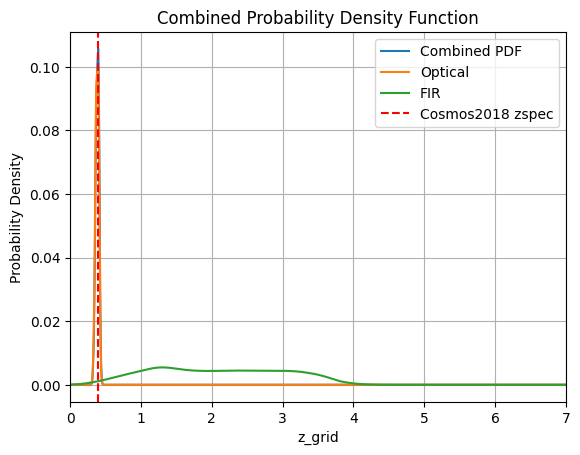

_____________ Galaxy ID :  105
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [294.08352011 295.5569257 ]


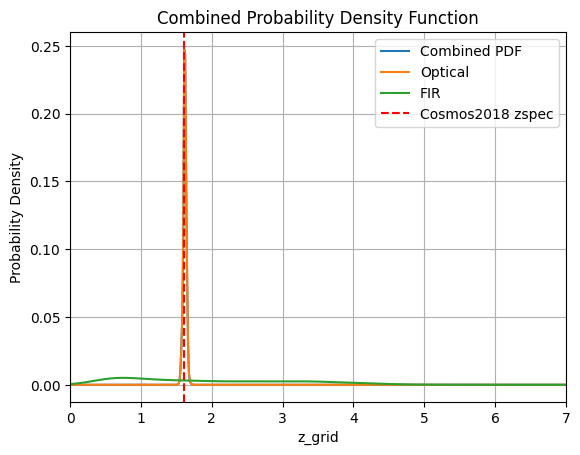

_____________ Galaxy ID :  106
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [284.94901316 335.58236272]


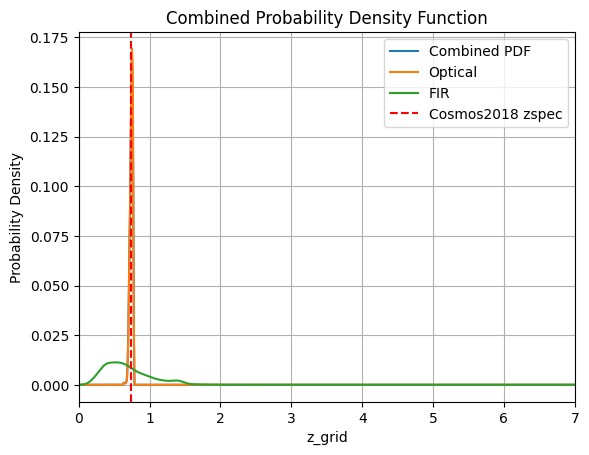

_____________ Galaxy ID :  107
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [299.6460242  302.59798629]


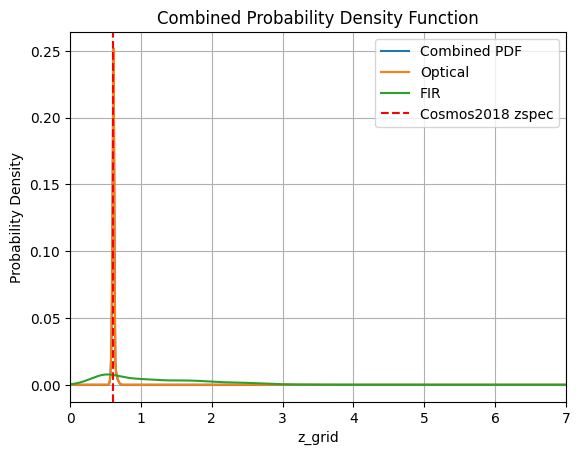

_____________ Galaxy ID :  108
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [215.96195694 208.80550613]


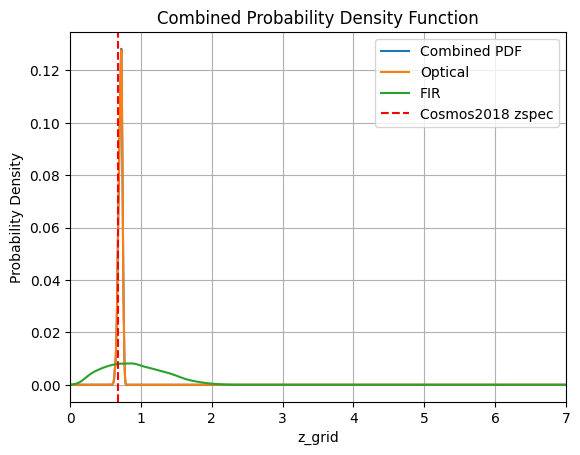

_____________ Galaxy ID :  109
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [252.84484754 248.12039093]


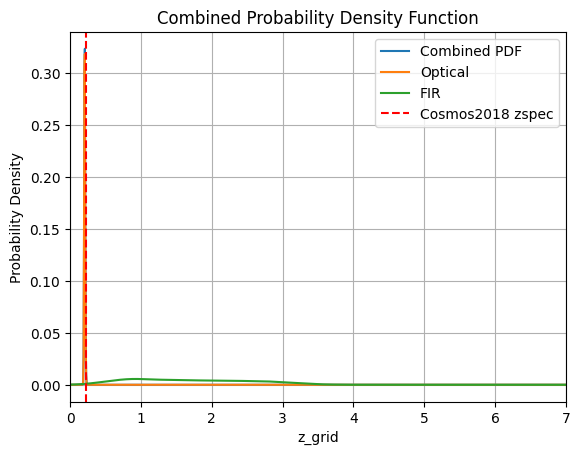

_____________ Galaxy ID :  110
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [328.99898439 319.44702803]


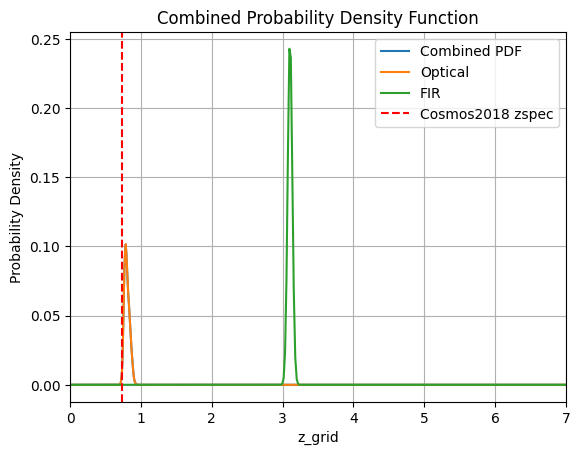

_____________ Galaxy ID :  111
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [308.08349521 311.16216258]


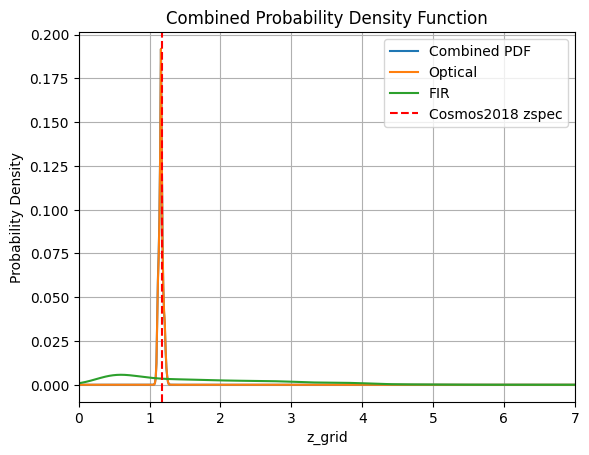

_____________ Galaxy ID :  112
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [175.05232465 174.27839159]


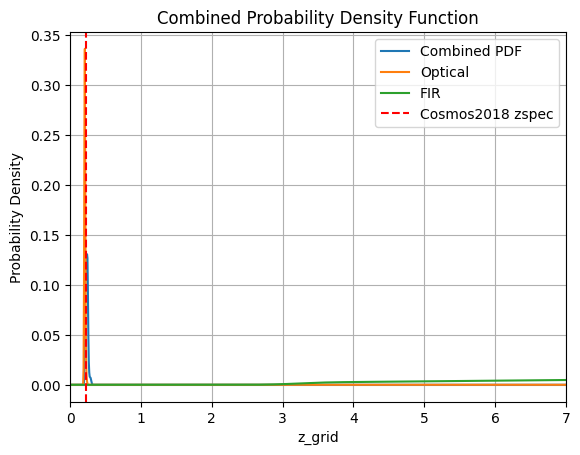

_____________ Galaxy ID :  113
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [280.1854933  277.54133346]


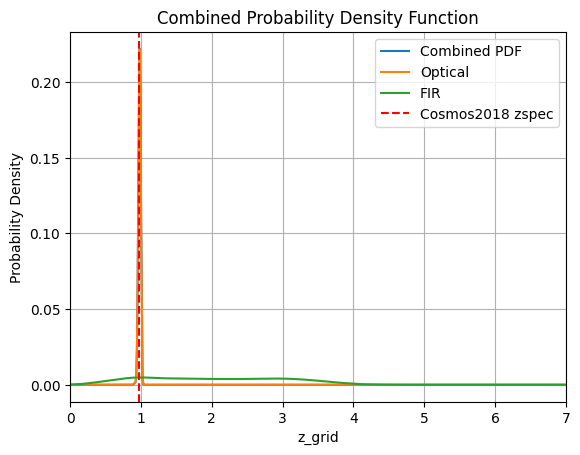

_____________ Galaxy ID :  114
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [334.08287417 317.68821764]


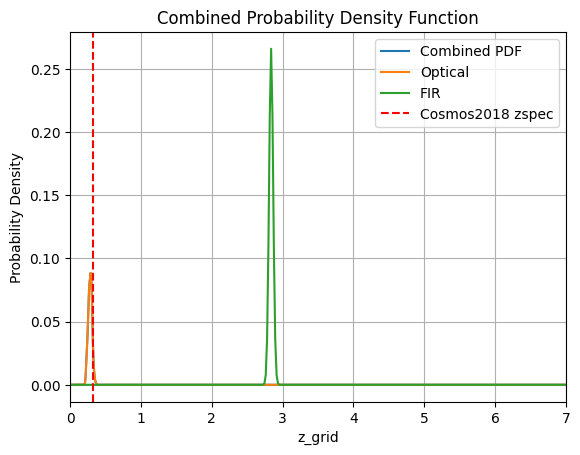

_____________ Galaxy ID :  115
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [226.11846001 221.55108457]


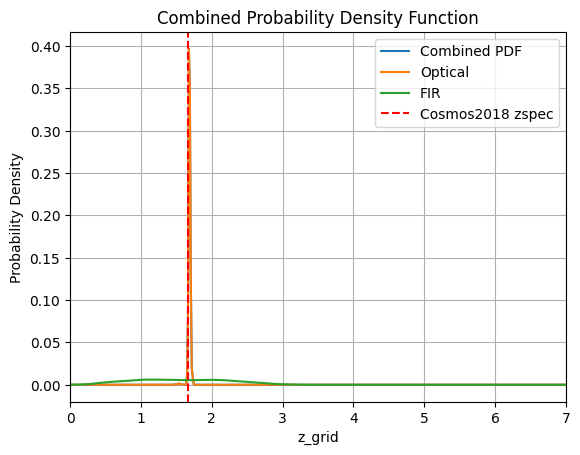

_____________ Galaxy ID :  116
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [257.10230141 244.89603142]


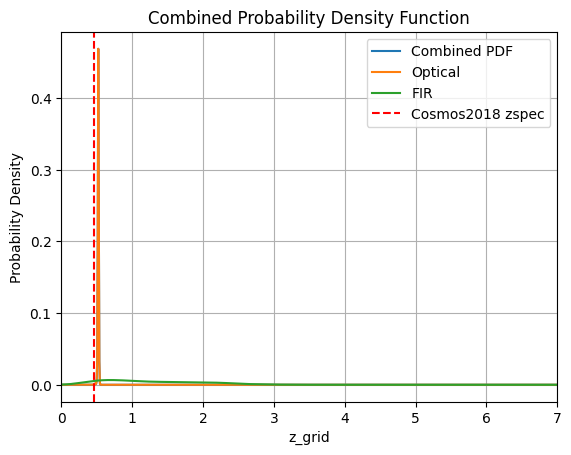

_____________ Galaxy ID :  117
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [239.02663156 224.44768306]


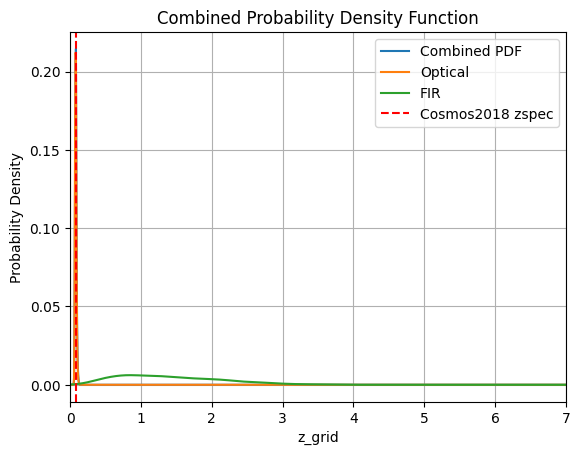

_____________ Galaxy ID :  118
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [212.60494938 194.74249117]


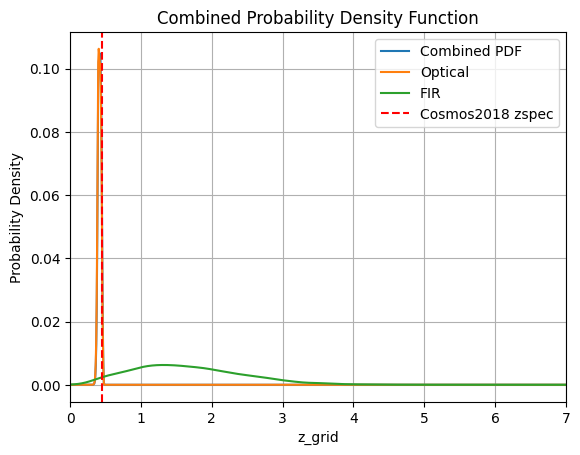

_____________ Galaxy ID :  119
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [350.93664257 356.10890335]


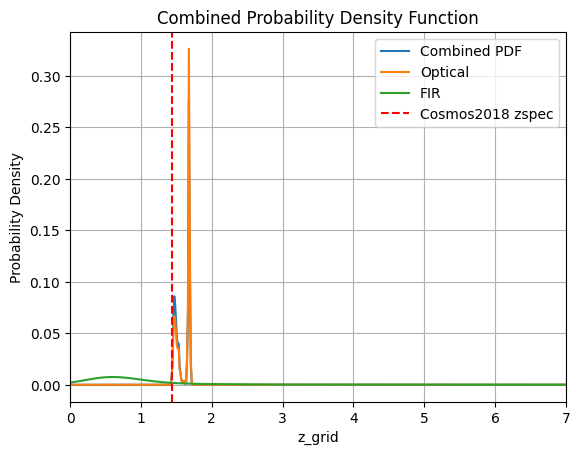

_____________ Galaxy ID :  120
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [205.11065022 205.74863926]


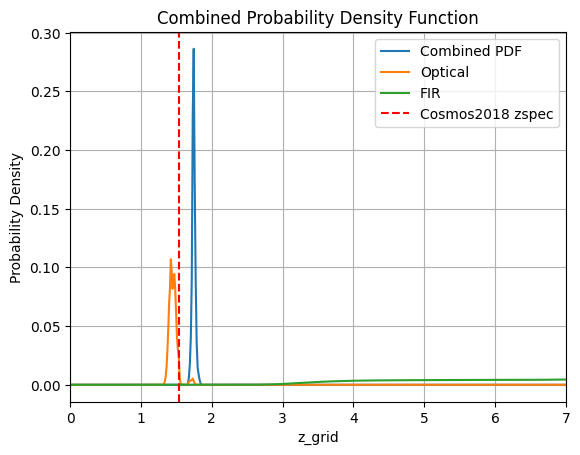

_____________ Galaxy ID :  121
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [313.79809816 320.70258394]


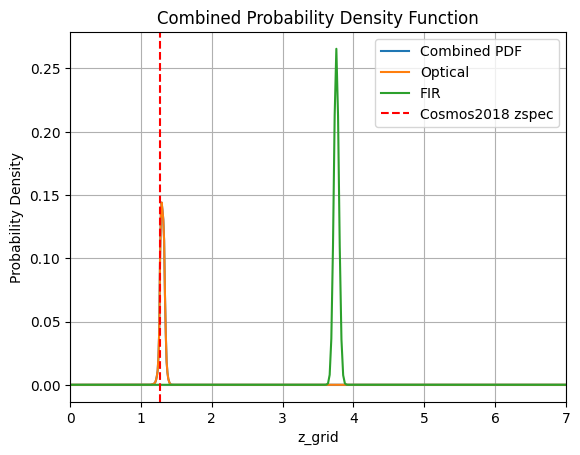

_____________ Galaxy ID :  122
The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [         nan 327.49175882]


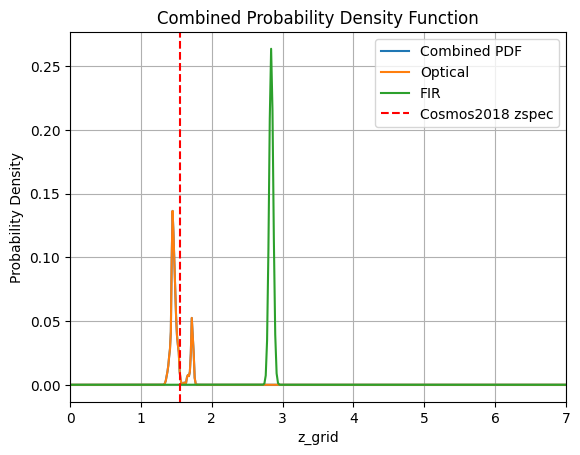

_____________ Galaxy ID :  123
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [244.84022766 243.32053534]


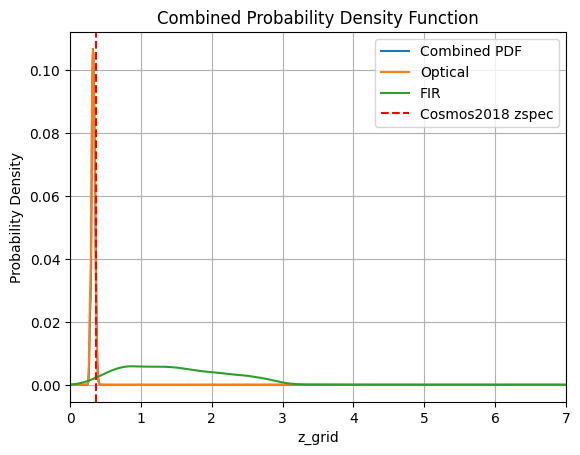

_____________ Galaxy ID :  124
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [198.88197081 199.35680857]


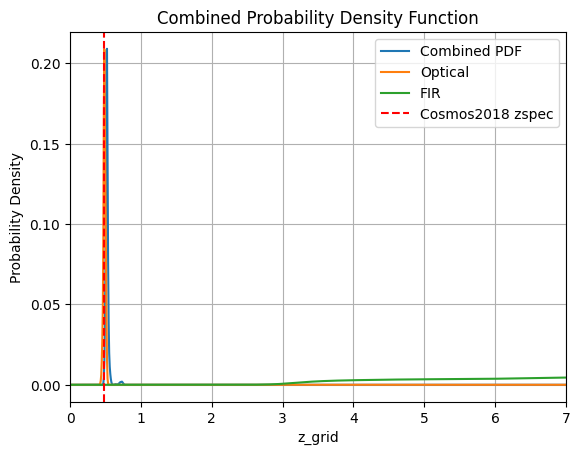

_____________ Galaxy ID :  125
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [330.29328882 327.22902837]


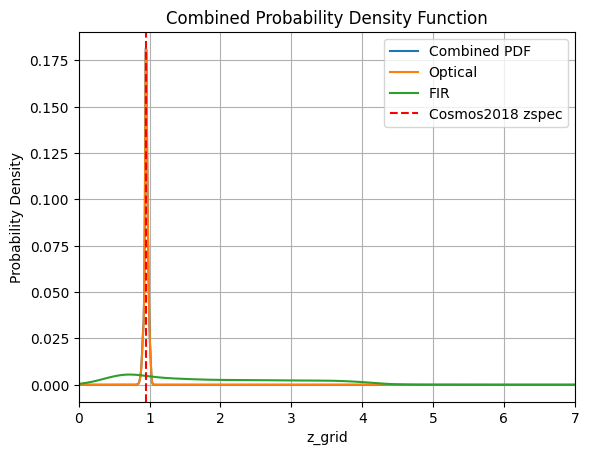

_____________ Galaxy ID :  126
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [213.52411132 209.20149543]


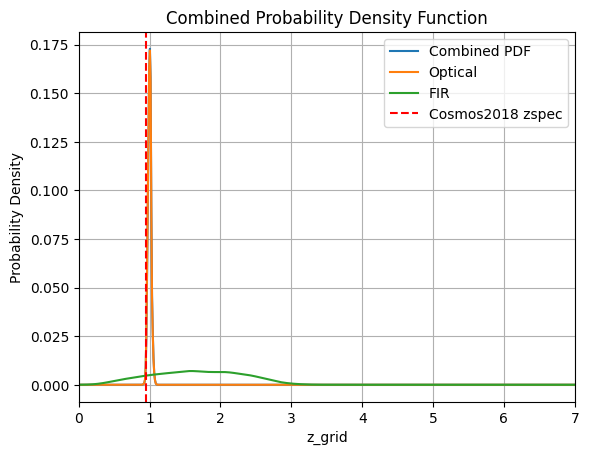

_____________ Galaxy ID :  127
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [215.96095849 206.16321273]


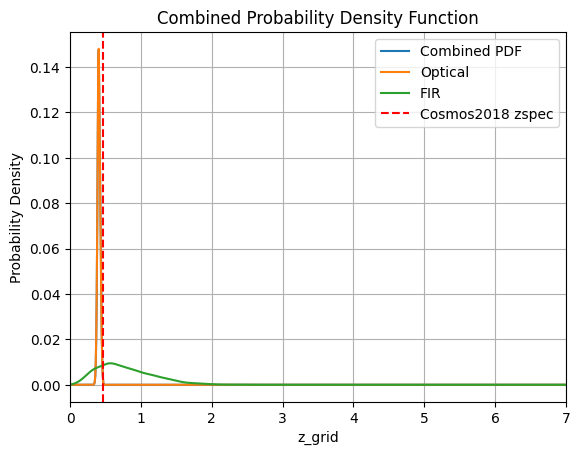

_____________ Galaxy ID :  128
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [260.74876482 259.16566001]


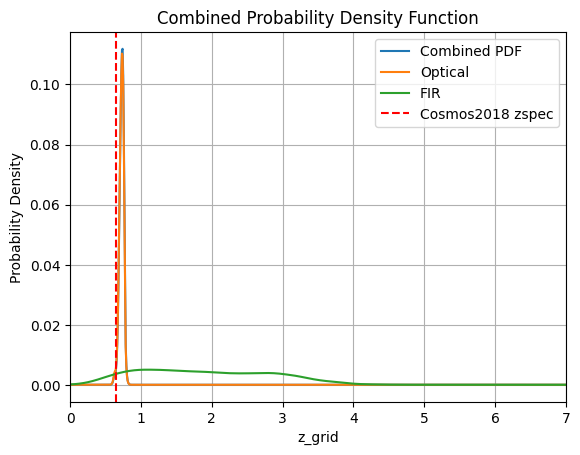

_____________ Galaxy ID :  129
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [252.97012415 243.92719993]


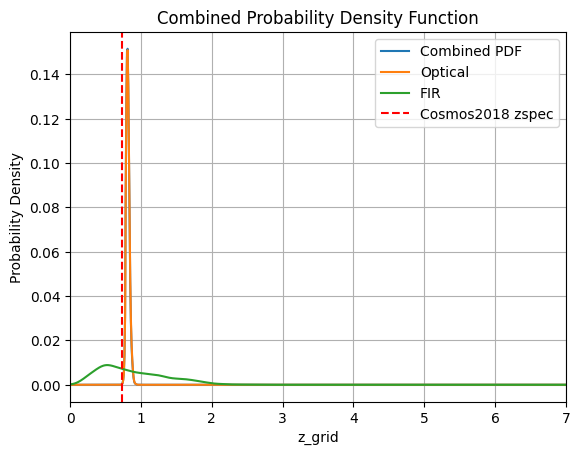

_____________ Galaxy ID :  130
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [251.29695814 252.25560797]


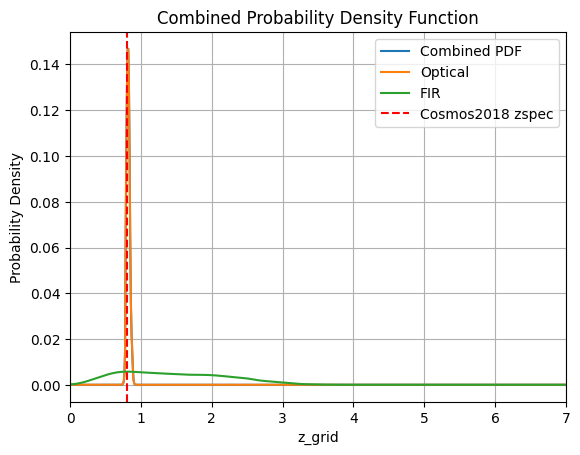

_____________ Galaxy ID :  131
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [240.73154094 232.18375181]


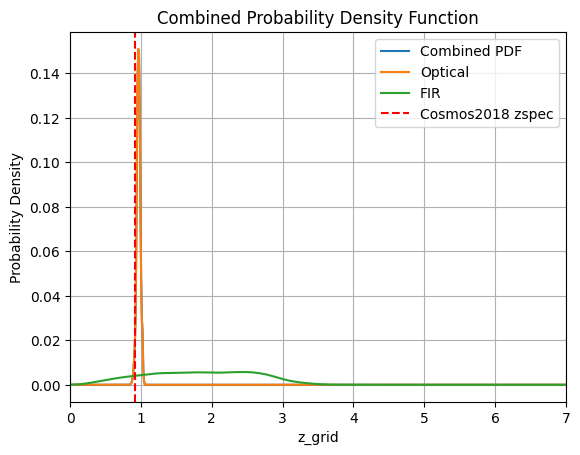

_____________ Galaxy ID :  132
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [226.88457071 222.32791312]


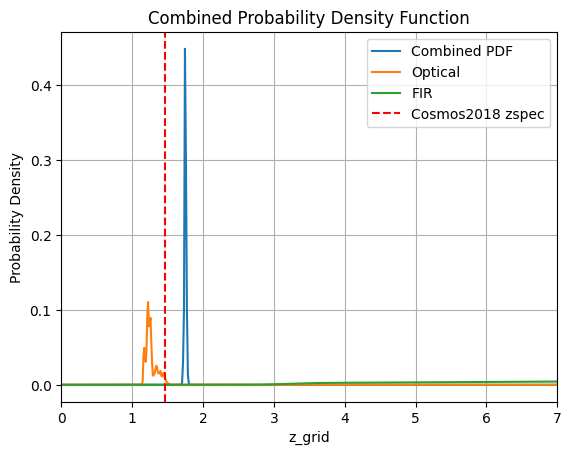

_____________ Galaxy ID :  133
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [260.18484824 261.70871042]


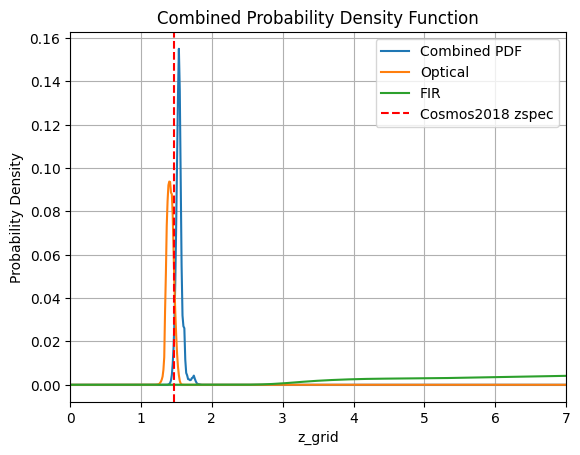

_____________ Galaxy ID :  134
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [241.78109296 233.83277397]


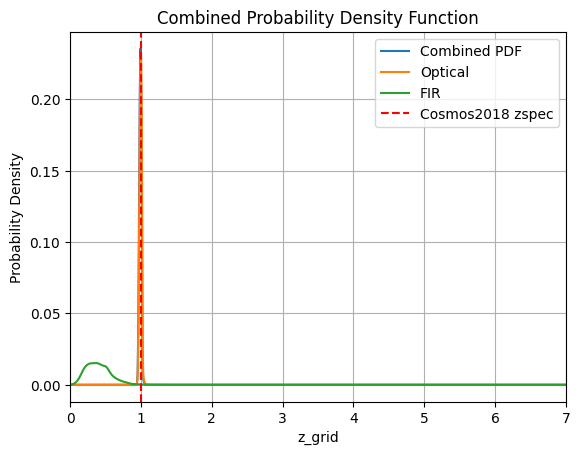

_____________ Galaxy ID :  135
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [211.93506567 226.3353915 ]


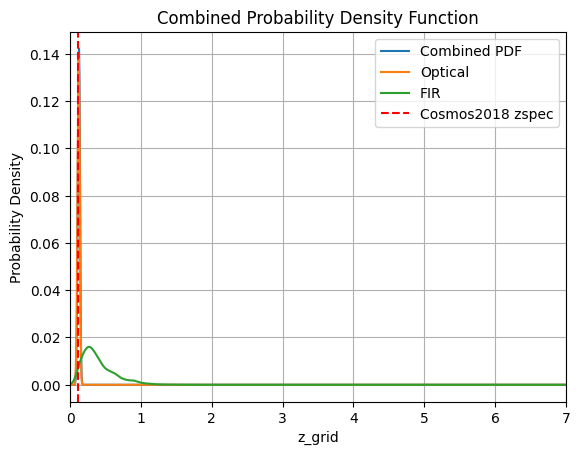

_____________ Galaxy ID :  136
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [311.38721679 314.00468503]


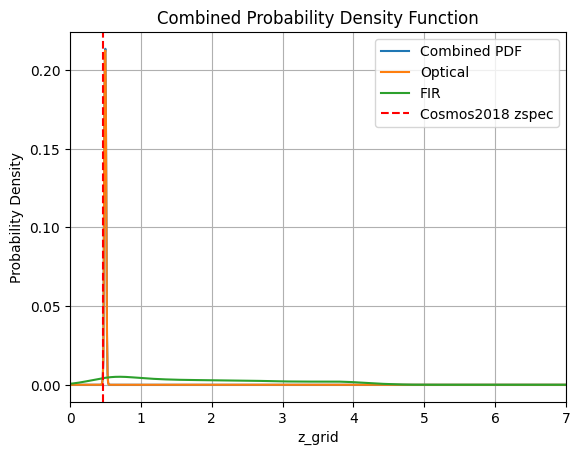

_____________ Galaxy ID :  137
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [202.20604493 206.66071432]


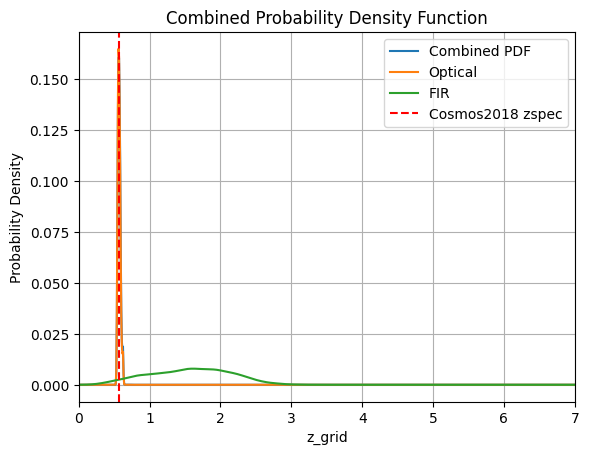

_____________ Galaxy ID :  138
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [323.34110238 323.36037885]


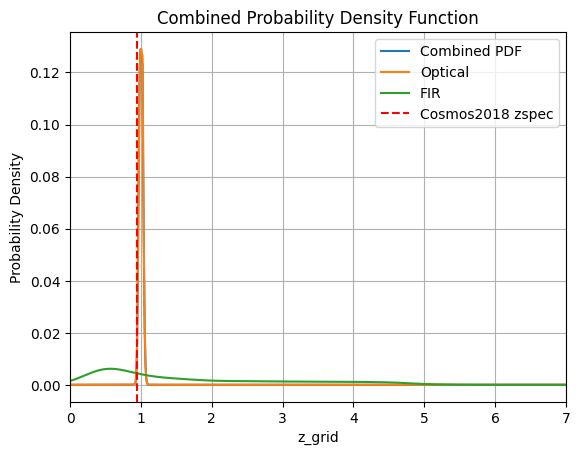

_____________ Galaxy ID :  139
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [298.08586175 320.03387775]


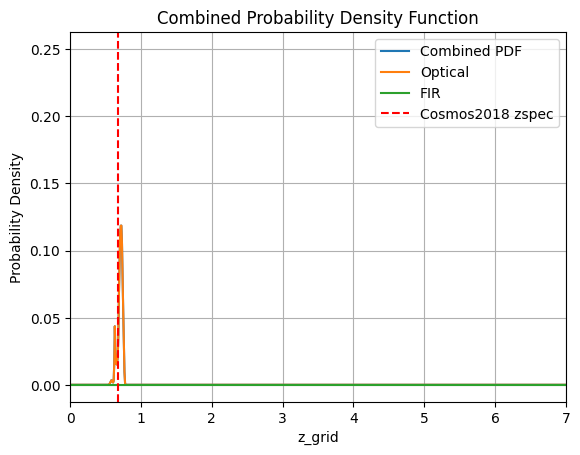

_____________ Galaxy ID :  140
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [220.39412547 211.48560544]


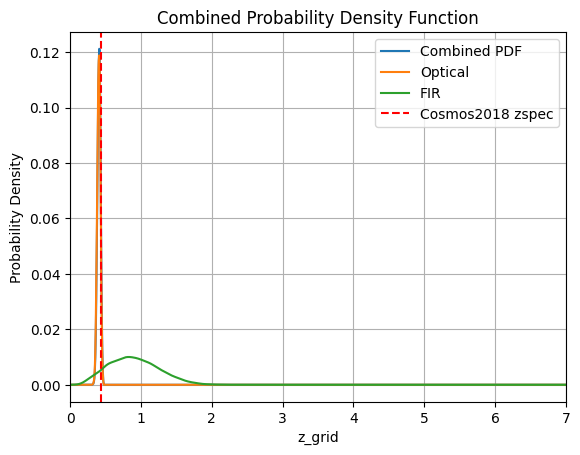

_____________ Galaxy ID :  141
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [210.0337558  199.84556052]


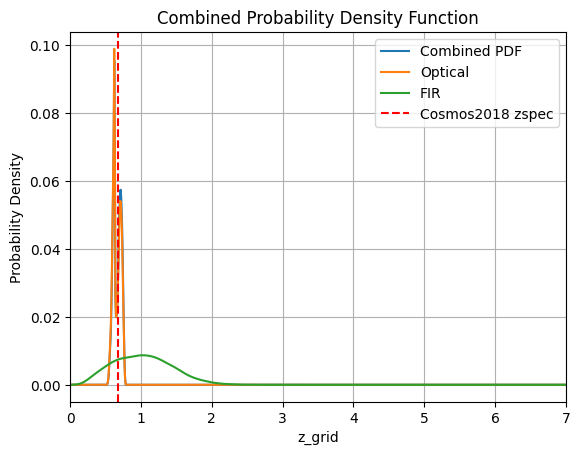

_____________ Galaxy ID :  142
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [293.74351329 291.9880949 ]


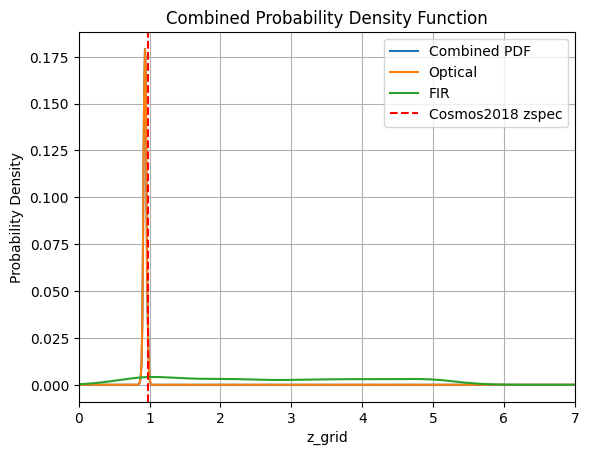

_____________ Galaxy ID :  143
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [238.41610699 233.75780143]


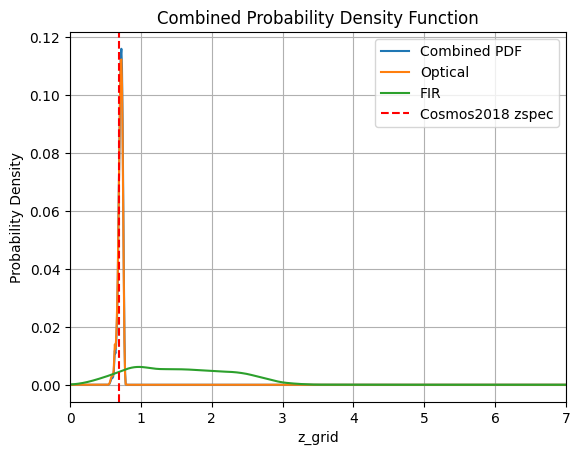

_____________ Galaxy ID :  144
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [290.77227071 292.49954419]


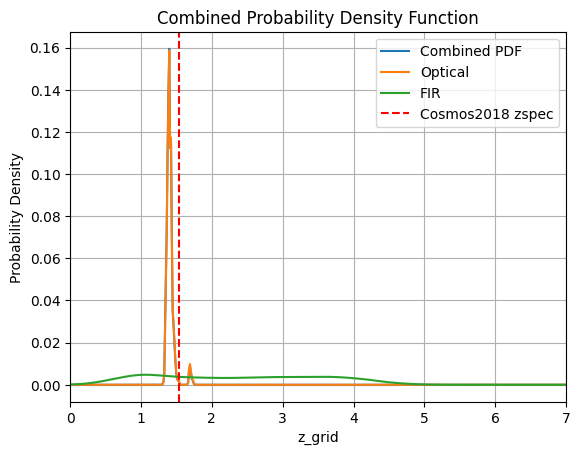

_____________ Galaxy ID :  145
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [336.92355308 335.15690783]


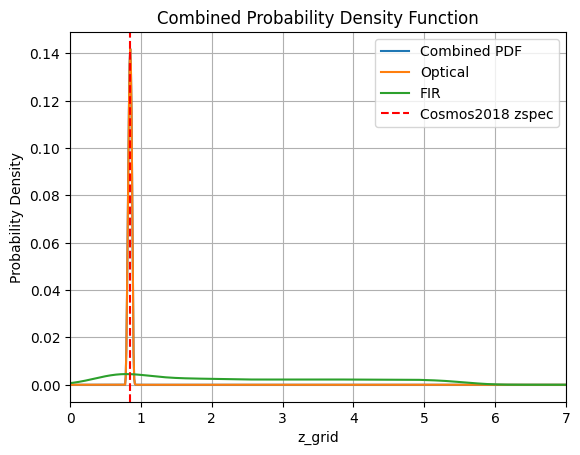

_____________ Galaxy ID :  146
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [329.35555044 332.10521465]


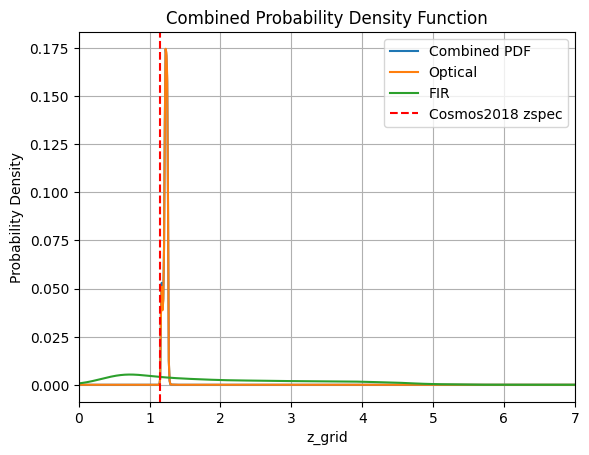

_____________ Galaxy ID :  147
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [217.14720276 214.17942676]


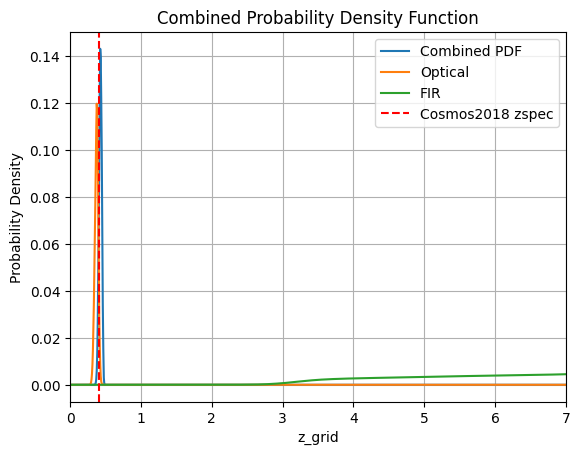

_____________ Galaxy ID :  148
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [325.3592008  319.57254373]


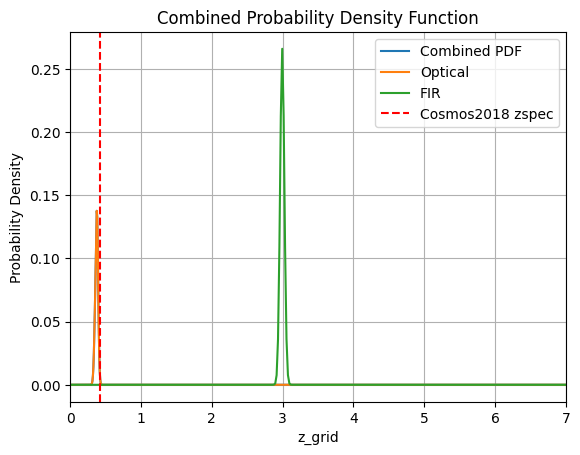

_____________ Galaxy ID :  149
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [295.3480114 294.2442665]


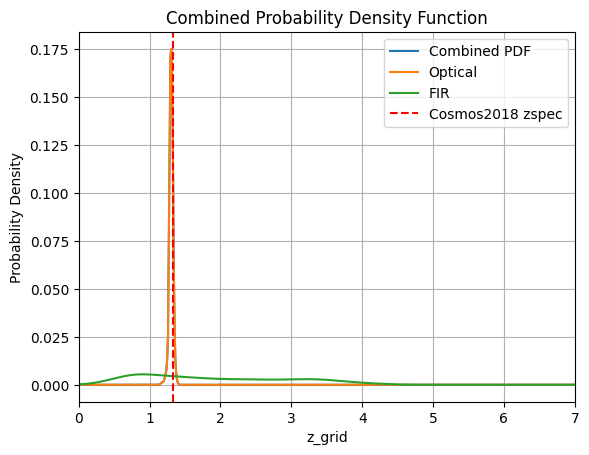

_____________ Galaxy ID :  150
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [221.23493721 191.29489736]


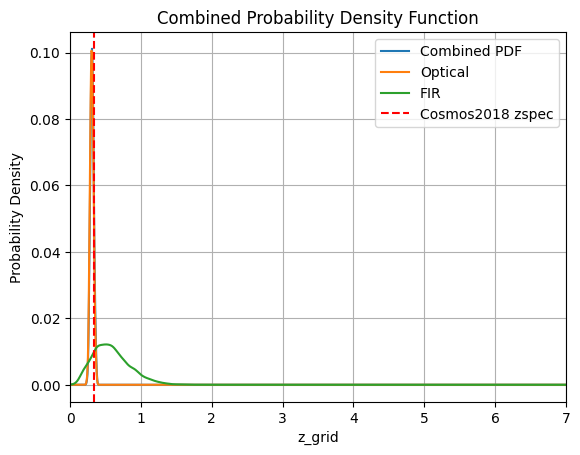

_____________ Galaxy ID :  151
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [242.38323911 245.65665518]


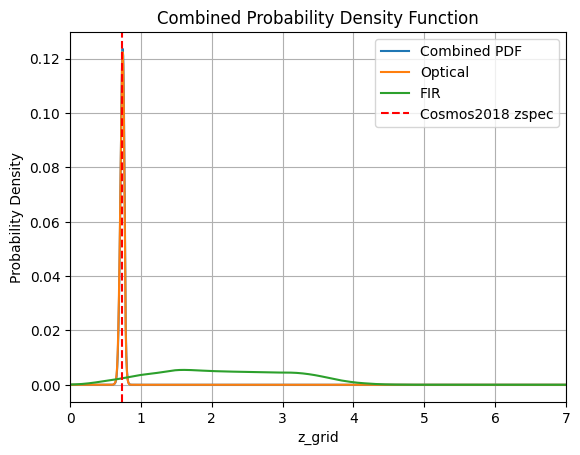

_____________ Galaxy ID :  152
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [307.07374873 312.53732222]


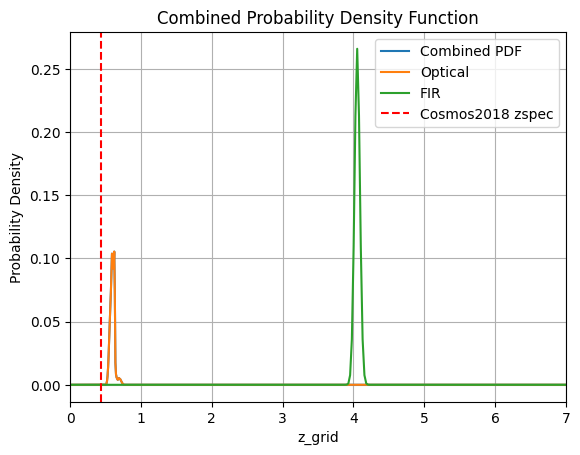

_____________ Galaxy ID :  153
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [246.03869187 240.738809  ]


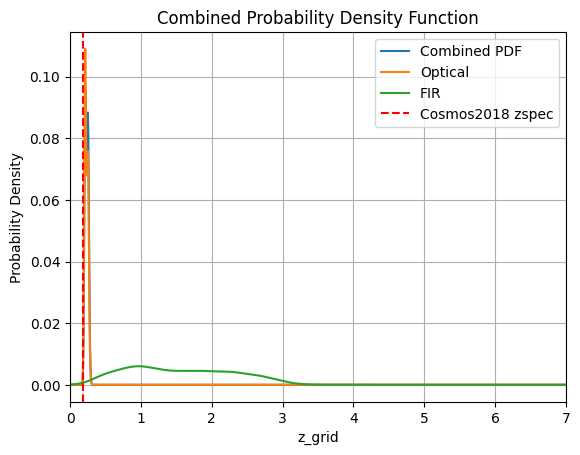

_____________ Galaxy ID :  154
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [246.60897365 247.86623607]


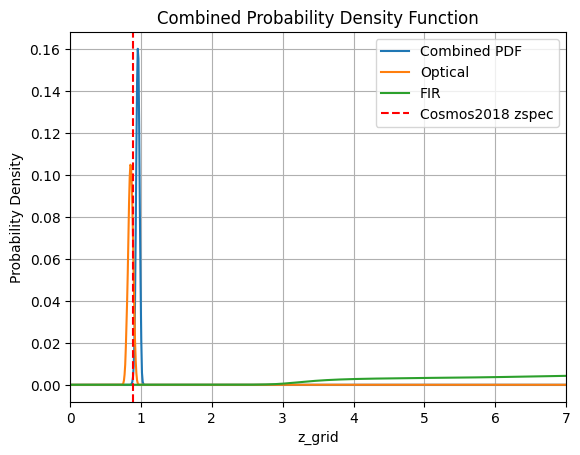

_____________ Galaxy ID :  155
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [212.91808278 205.09959135]


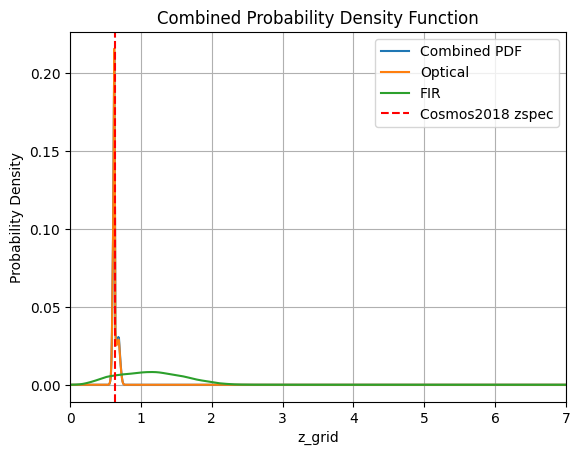

_____________ Galaxy ID :  156
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [249.32272017 336.34941195]


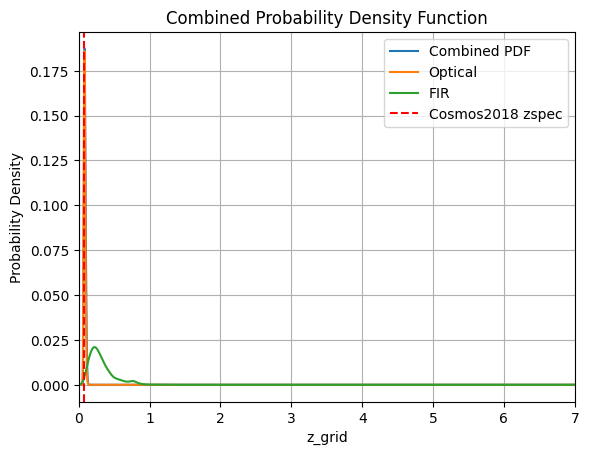

_____________ Galaxy ID :  157
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [335.34661119 334.9181914 ]


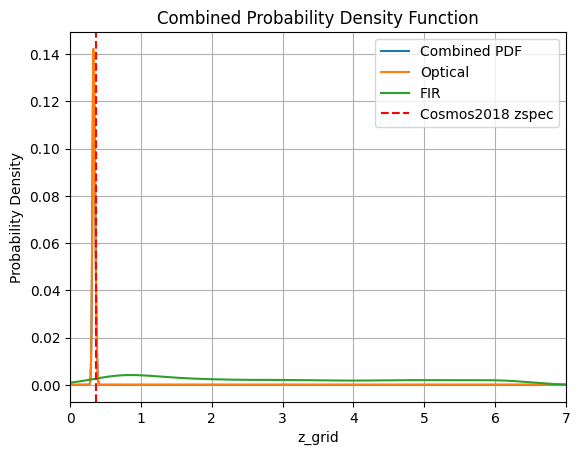

_____________ Galaxy ID :  158
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [287.16696329 286.03413898]


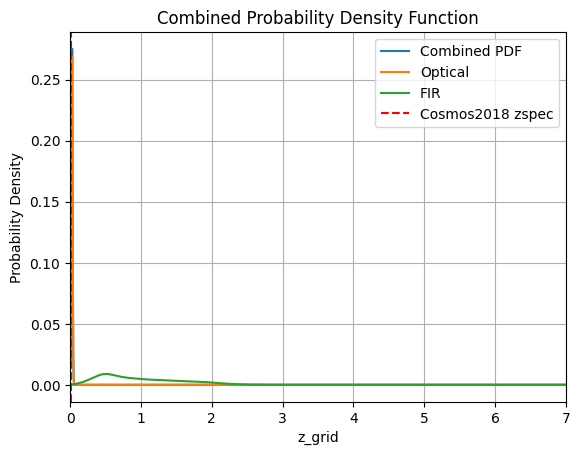

_____________ Galaxy ID :  159
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [290.14407959 286.97503044]


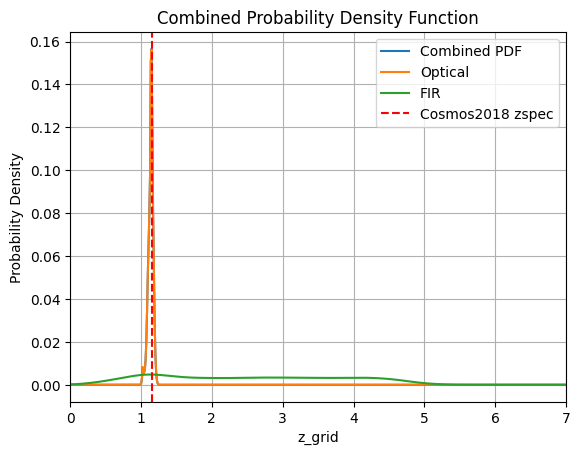

_____________ Galaxy ID :  160
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [264.93918578 273.4838795 ]


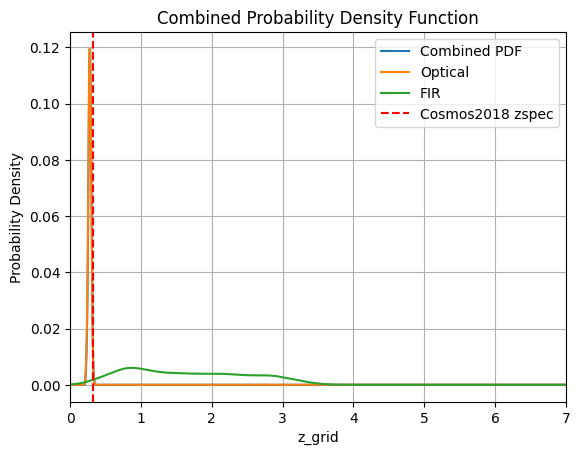

_____________ Galaxy ID :  161
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.34494532 327.40742217]


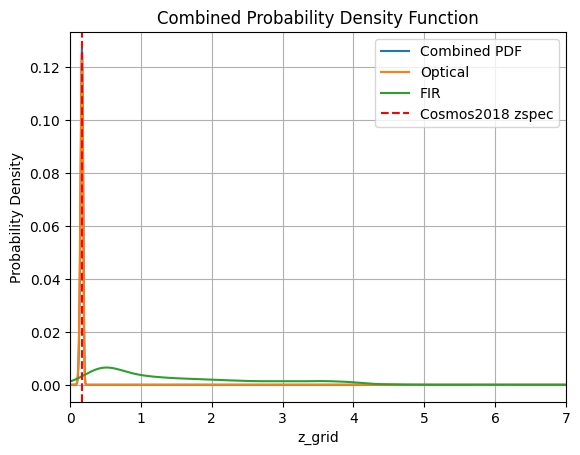

_____________ Galaxy ID :  162
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [368.19242971 377.32198819]


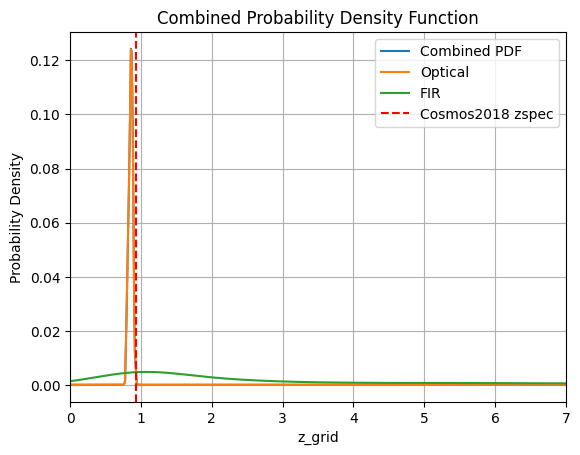

_____________ Galaxy ID :  163
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [319.65242287 319.92926336]


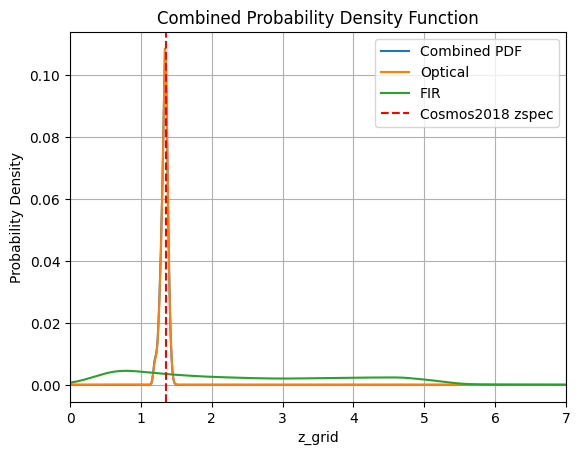

_____________ Galaxy ID :  164
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [306.23684886 309.41161105]


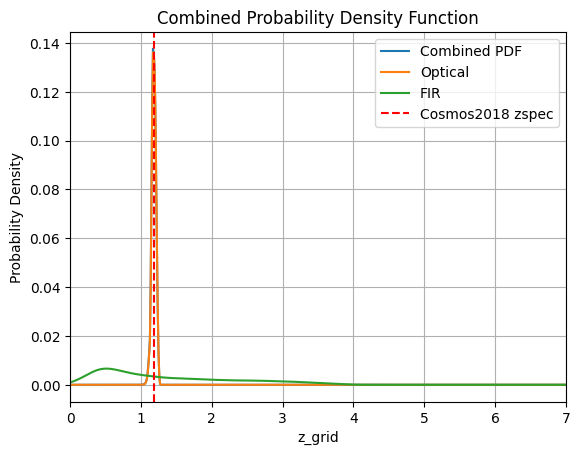

_____________ Galaxy ID :  165
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [293.02211507 292.5399791 ]


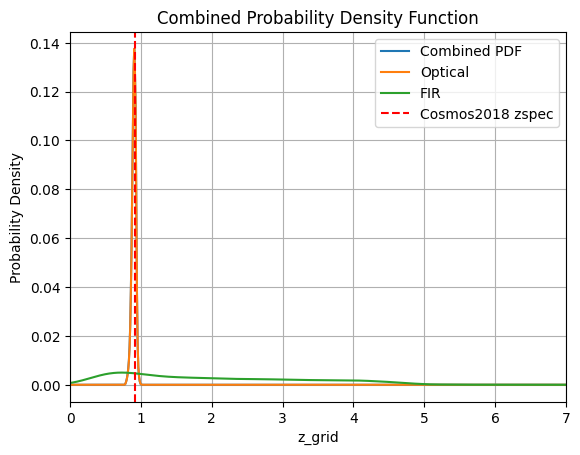

_____________ Galaxy ID :  166
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [249.84669735 248.89045932]


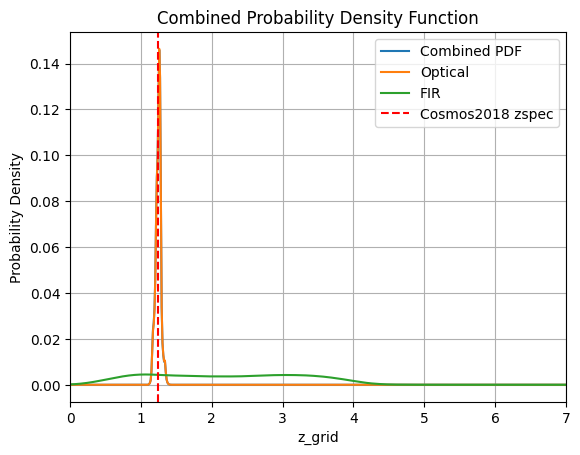

_____________ Galaxy ID :  167
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [363.73082151 363.5179588 ]


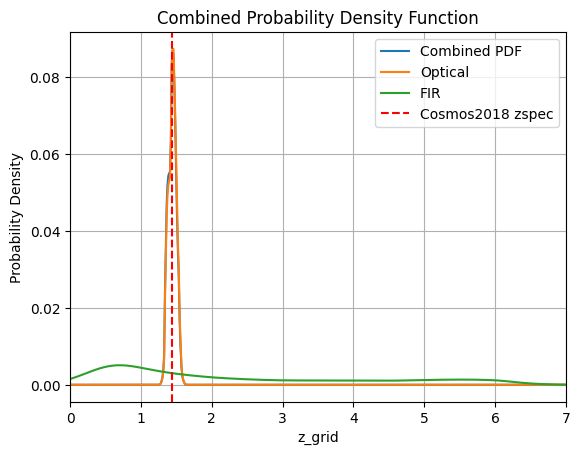

_____________ Galaxy ID :  168
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [299.526407  301.7119861]


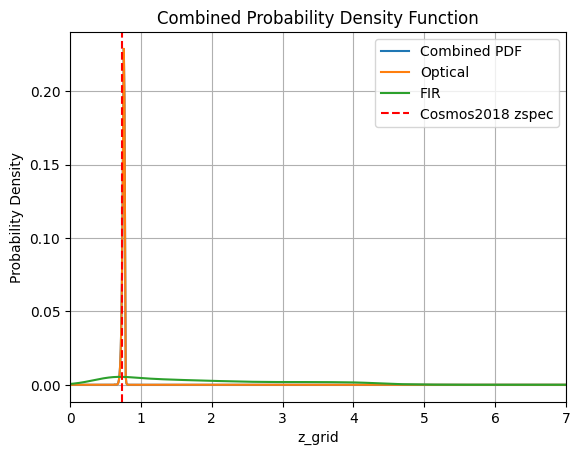

_____________ Galaxy ID :  169
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [320.98143025 321.75894414]


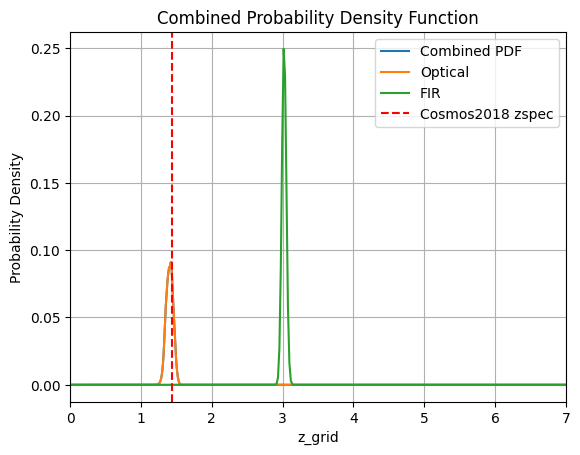

_____________ Galaxy ID :  170
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [328.14489425 318.10891751]


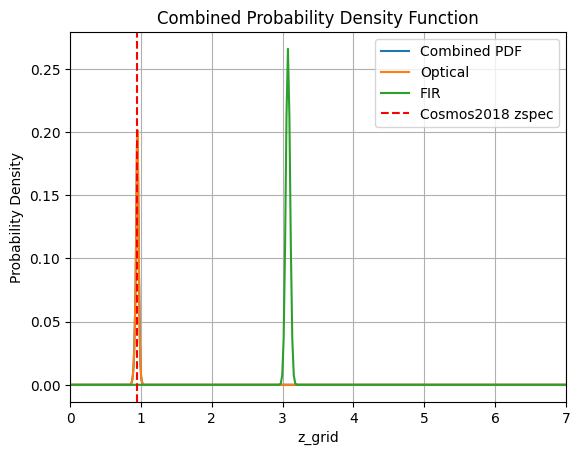

_____________ Galaxy ID :  171
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [313.01556162 314.68247969]


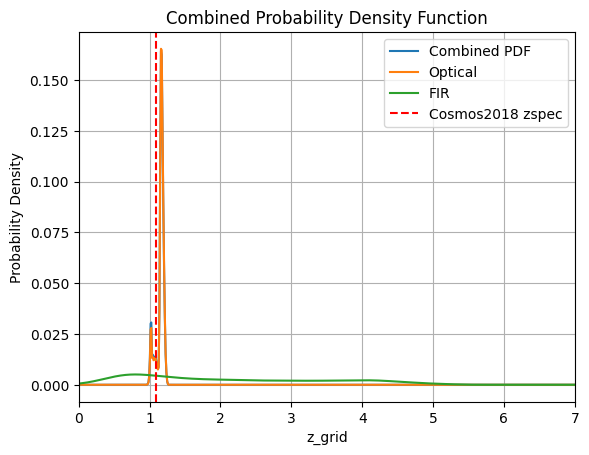

_____________ Galaxy ID :  172
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [260.35661819 257.35779156]


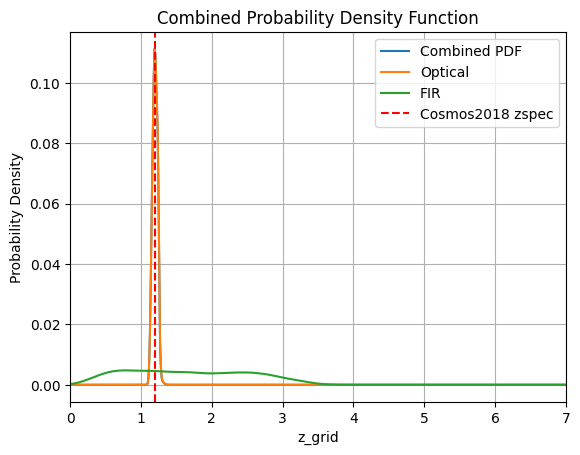

_____________ Galaxy ID :  173
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [208.09229484 195.26374101]


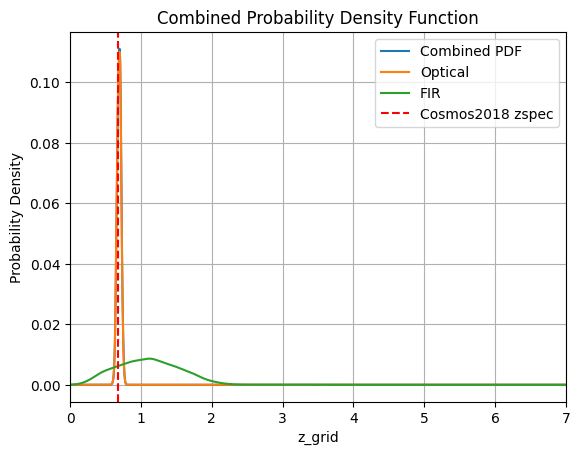

_____________ Galaxy ID :  174
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [246.59779834 245.05447439]


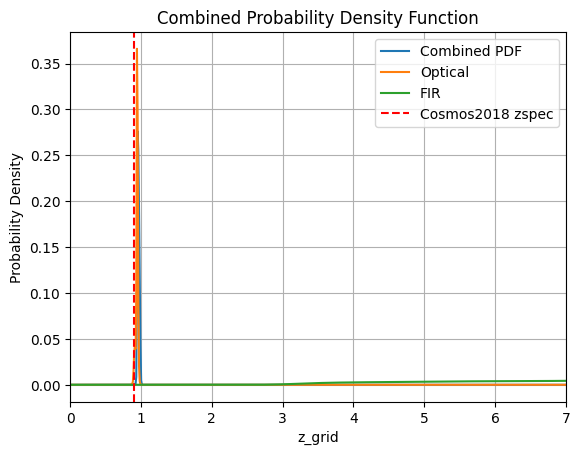

_____________ Galaxy ID :  175
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [175.29668727 171.08018958]


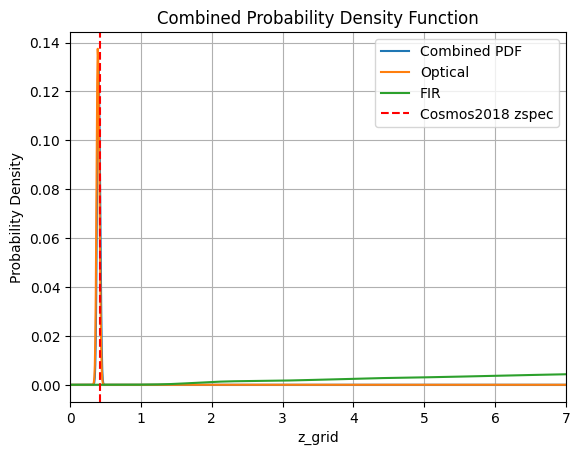

_____________ Galaxy ID :  176
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [206.76247037 203.2095802 ]


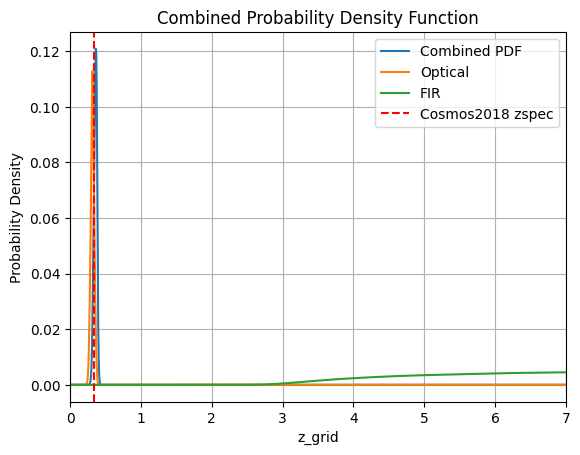

_____________ Galaxy ID :  177
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [245.03287323 225.98143956]


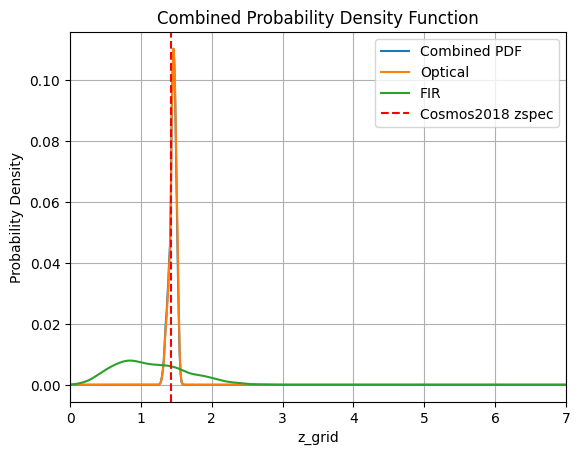

_____________ Galaxy ID :  178
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [187.00030333 187.49020012]


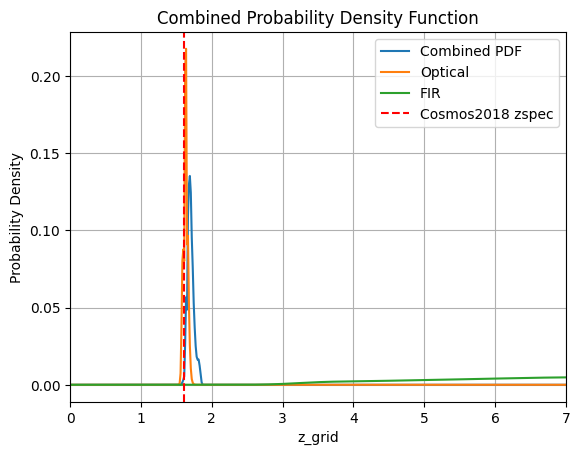

_____________ Galaxy ID :  179
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [315.39030795 313.380055  ]


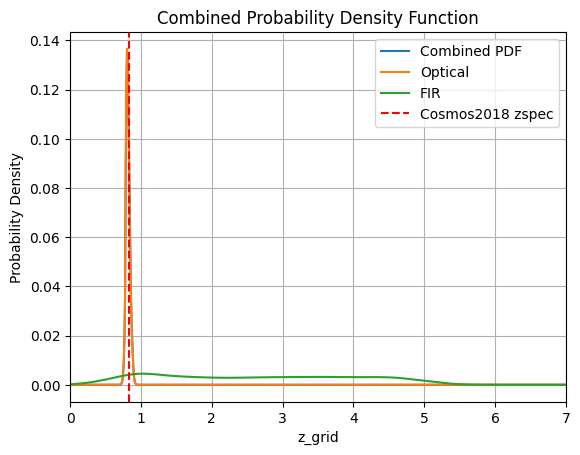

_____________ Galaxy ID :  180
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [309.95680462 311.84035704]


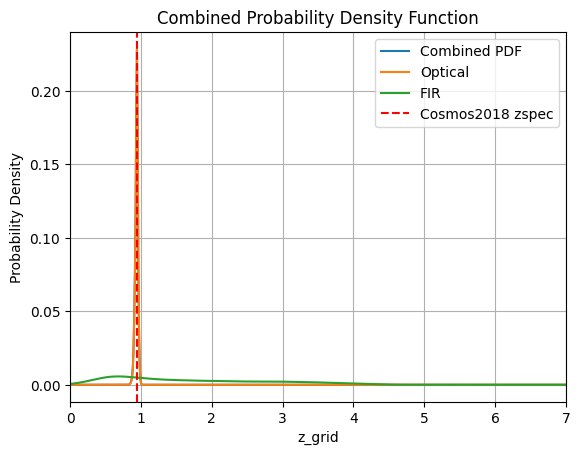

_____________ Galaxy ID :  181
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [316.69150877 316.33416201]


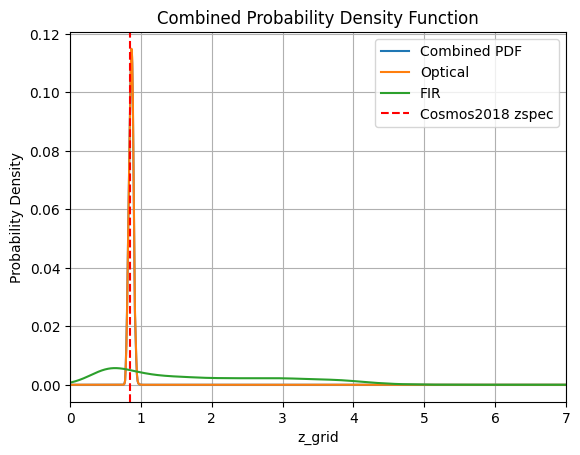

_____________ Galaxy ID :  182
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [257.42259455 254.0464011 ]


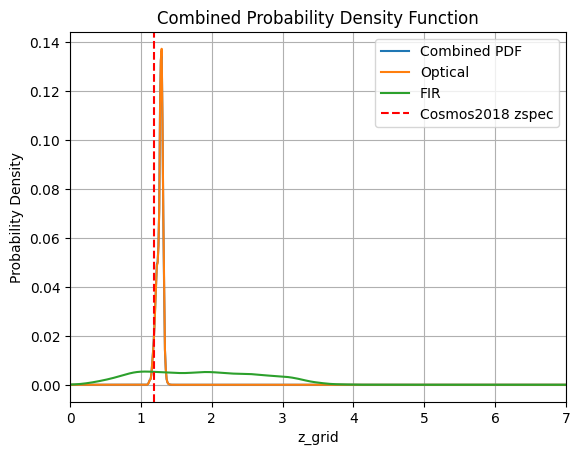

_____________ Galaxy ID :  183
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [205.32511796 205.80912637]


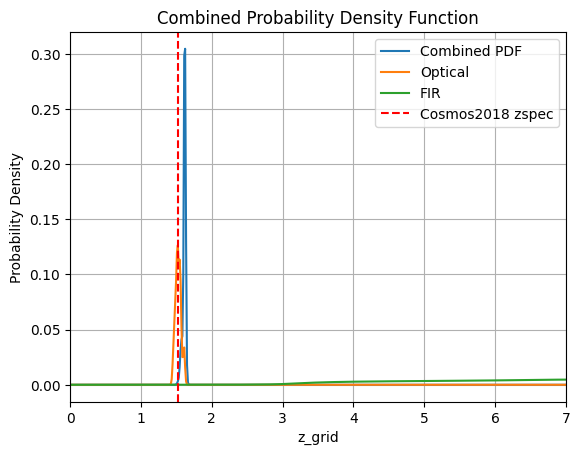

_____________ Galaxy ID :  184
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.39139478 322.60575392]


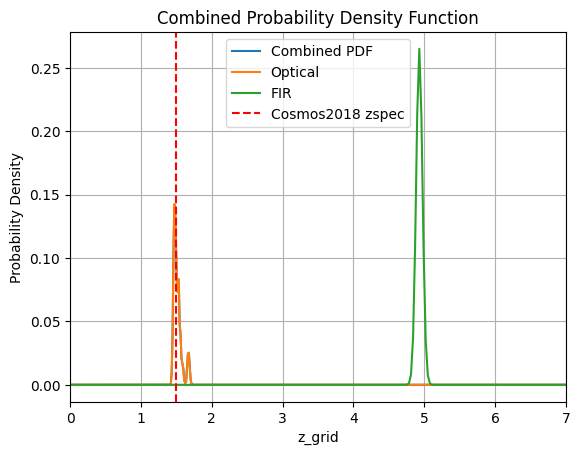

_____________ Galaxy ID :  185
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.24064653 321.77936858]


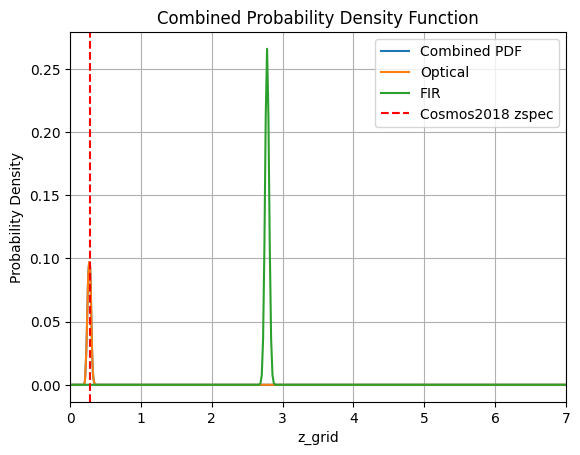

_____________ Galaxy ID :  186
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [258.39112825 257.09543709]


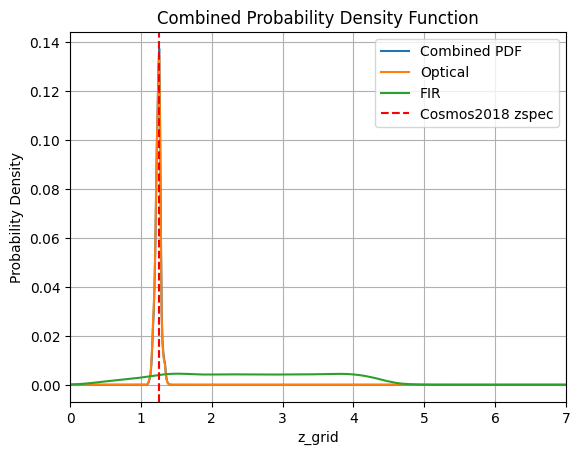

_____________ Galaxy ID :  187
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [248.17239396 244.20455935]


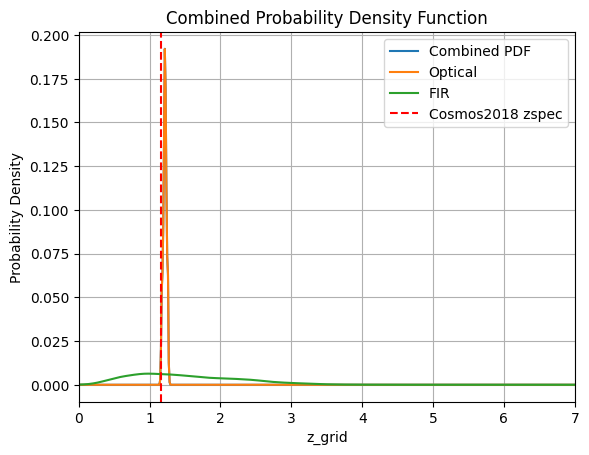

_____________ Galaxy ID :  188
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [190.18440441 193.63756251]


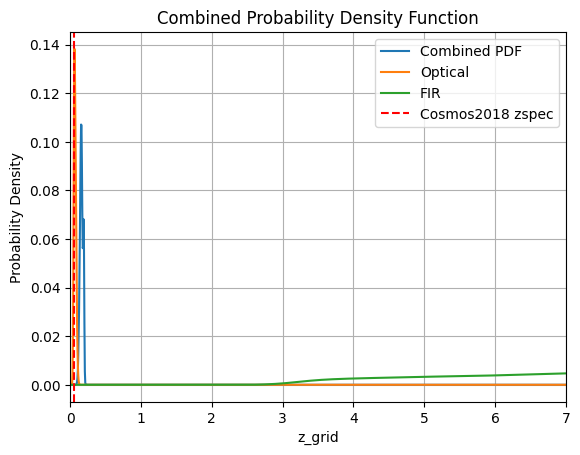

_____________ Galaxy ID :  189
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [302.37439797 303.65395187]


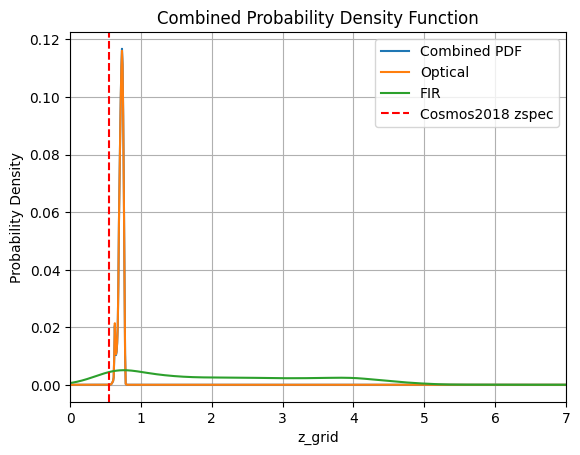

_____________ Galaxy ID :  190
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [309.77587385 312.98439777]


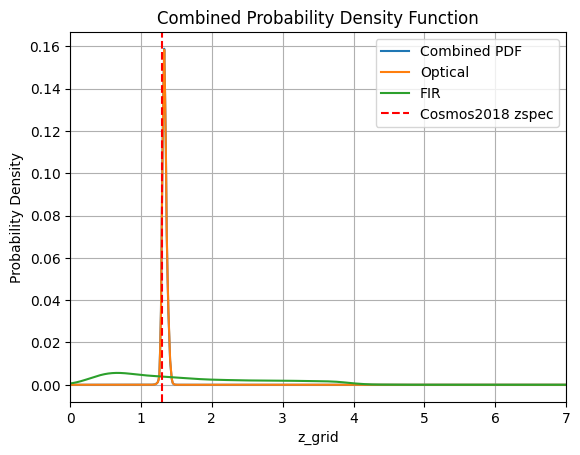

_____________ Galaxy ID :  191
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [227.25197785 220.47224186]


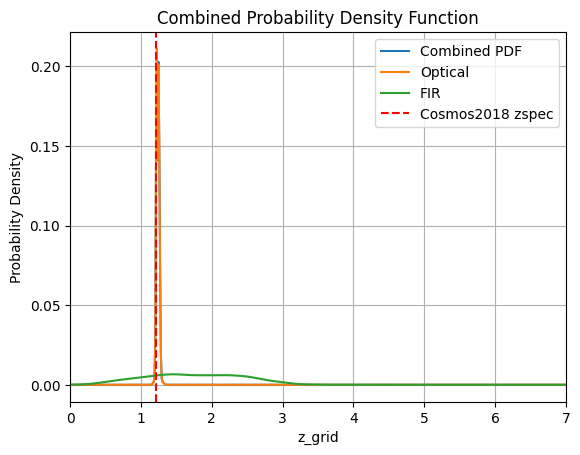

_____________ Galaxy ID :  192
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [284.97898975 286.30555977]


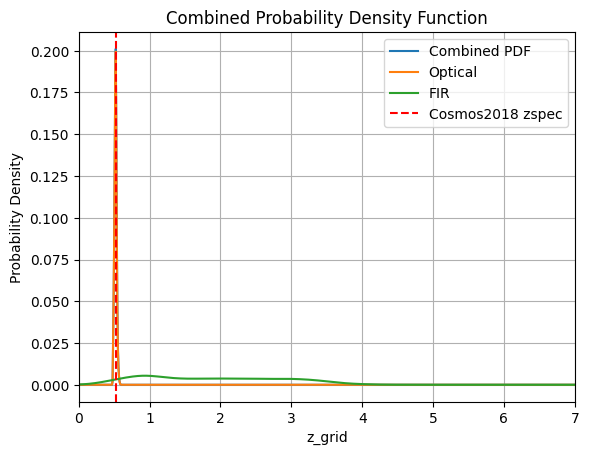

_____________ Galaxy ID :  193
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [262.71324827 262.56291942]


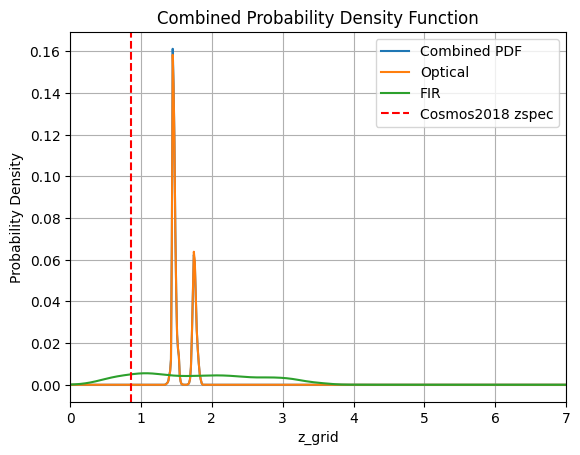

_____________ Galaxy ID :  194
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [314.99679504 319.32271298]


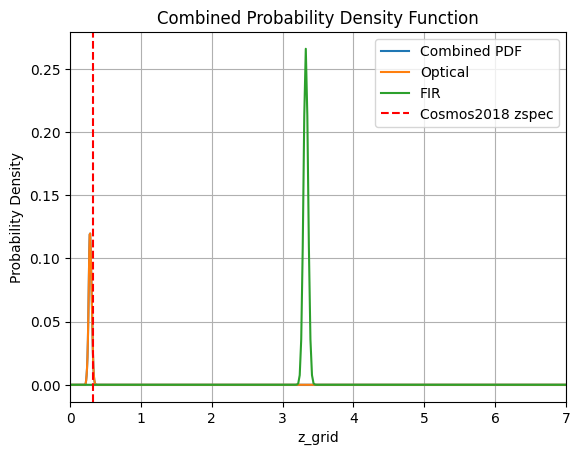

_____________ Galaxy ID :  195
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [333.40419874 334.72166355]


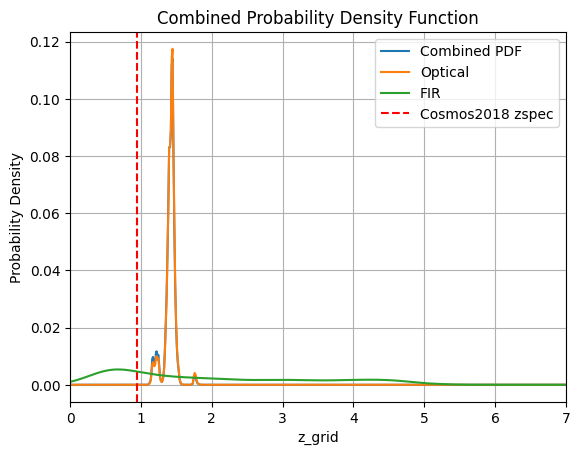

_____________ Galaxy ID :  196
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [297.58991232 297.89127415]


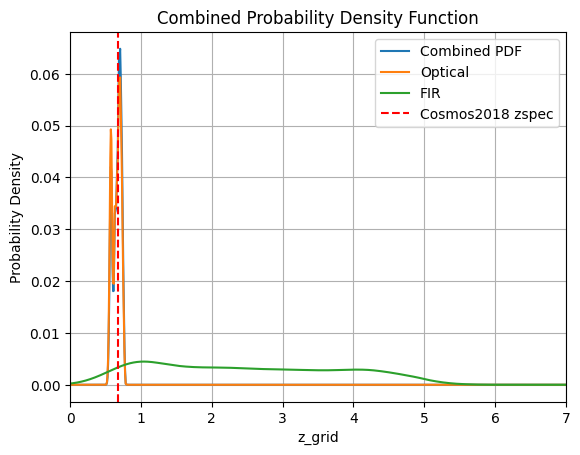

_____________ Galaxy ID :  197
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [224.6510208  227.78952024]


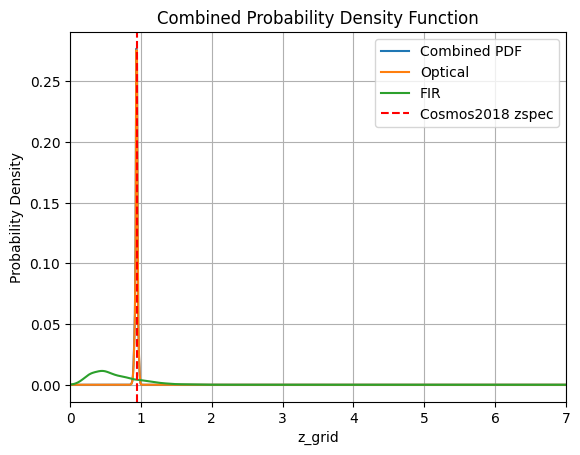

_____________ Galaxy ID :  198
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [214.81712309 217.21179644]


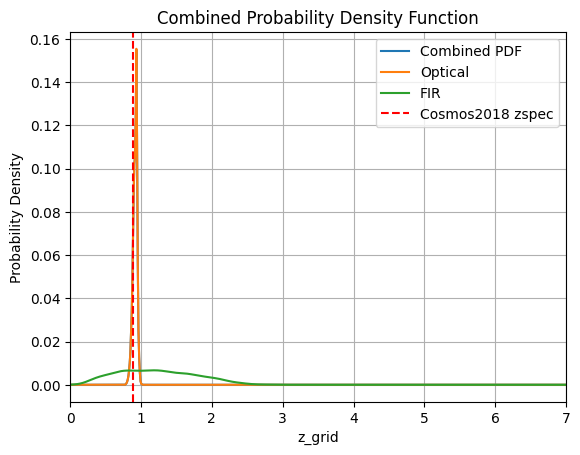

_____________ Galaxy ID :  199
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [236.42051994 233.27368632]


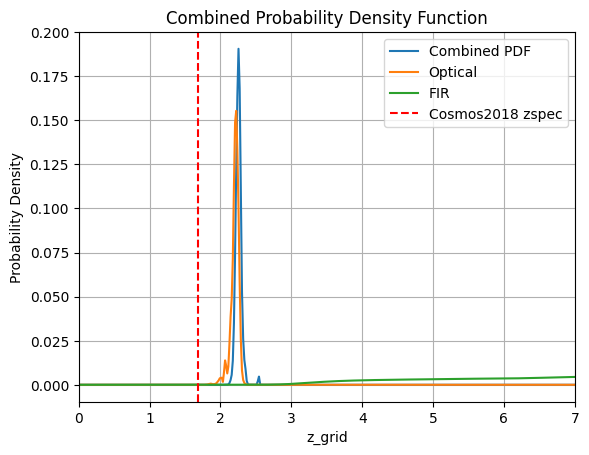

_____________ Galaxy ID :  200
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [199.22133636 198.38022622]


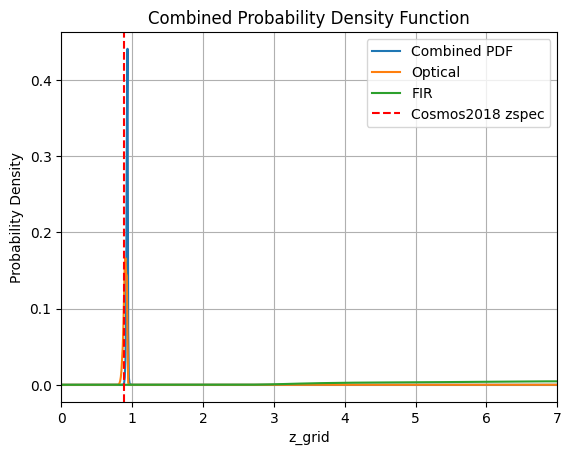

_____________ Galaxy ID :  201
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [211.7632396  210.96389226]


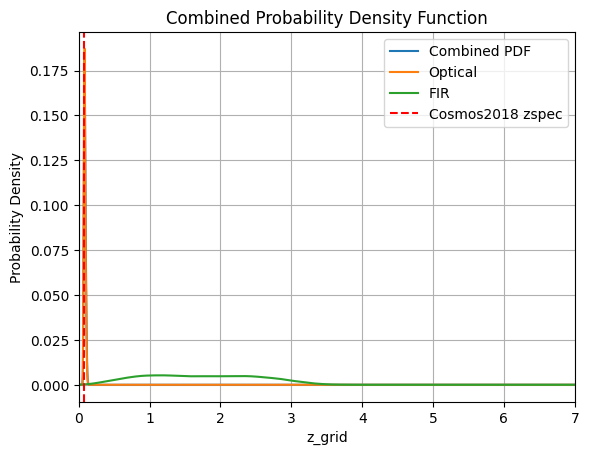

_____________ Galaxy ID :  202
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [255.31657276 254.93680113]


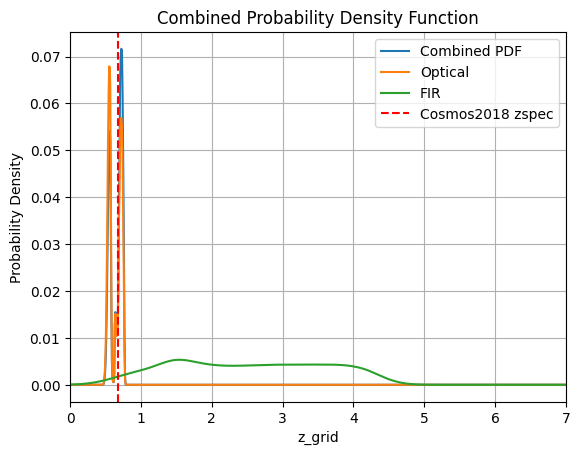

_____________ Galaxy ID :  203
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [333.32305803 335.70429395]


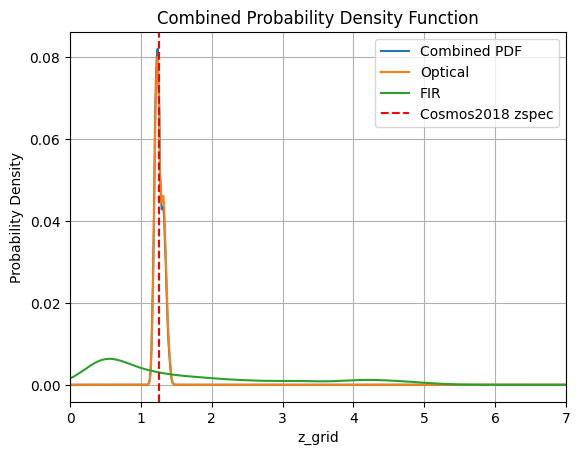

_____________ Galaxy ID :  204
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [297.78478403 293.93626493]


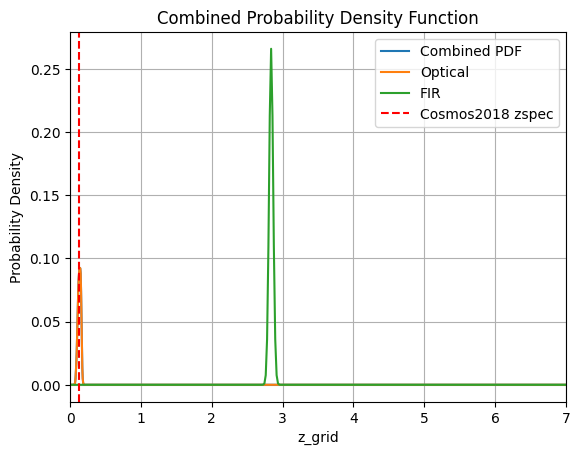

_____________ Galaxy ID :  205
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [326.54943636 327.36363207]


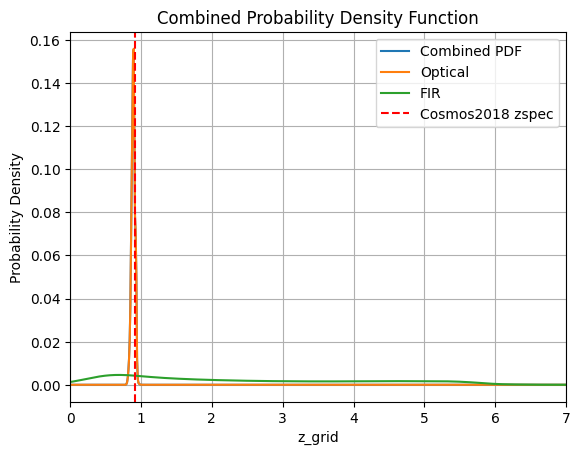

_____________ Galaxy ID :  206
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [294.04384809 294.53765792]


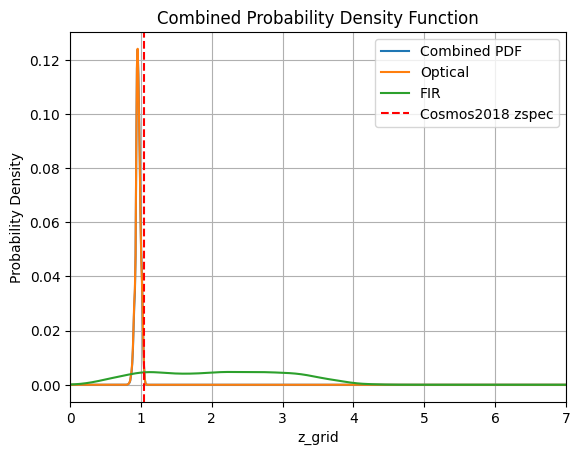

_____________ Galaxy ID :  207
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [251.9960048  257.50251719]


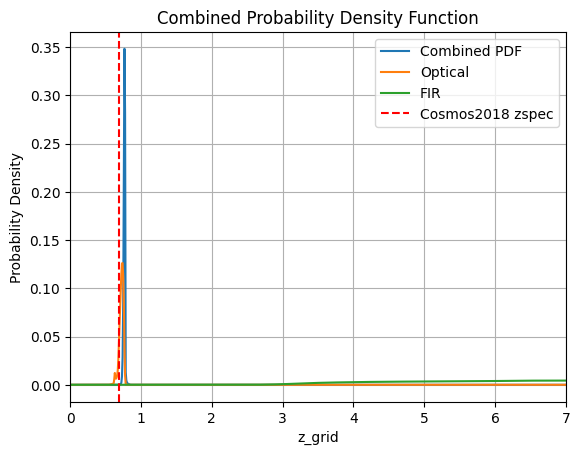

_____________ Galaxy ID :  208
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [165.35841843 166.14875833]


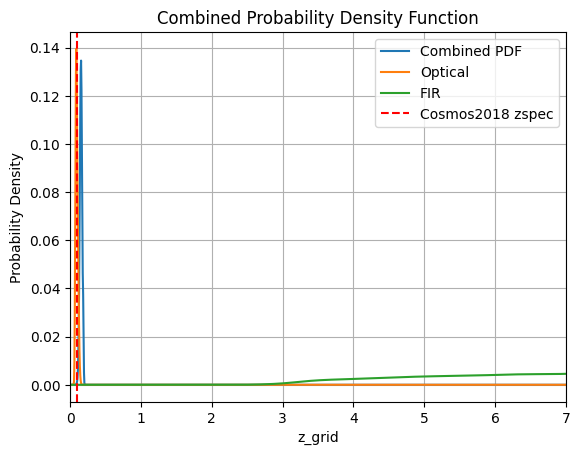

_____________ Galaxy ID :  209
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [288.27774311 291.78988138]


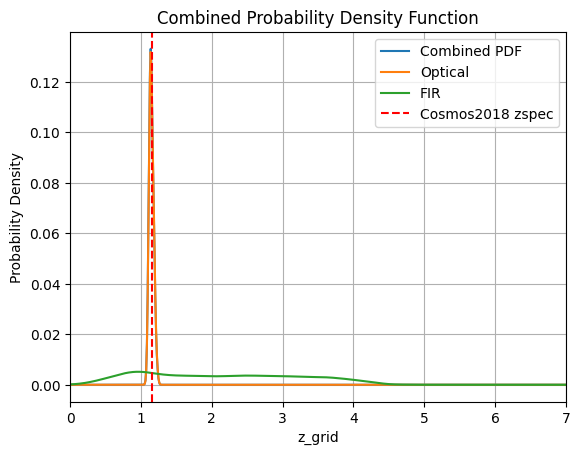

_____________ Galaxy ID :  210
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [273.73028749 271.2452642 ]


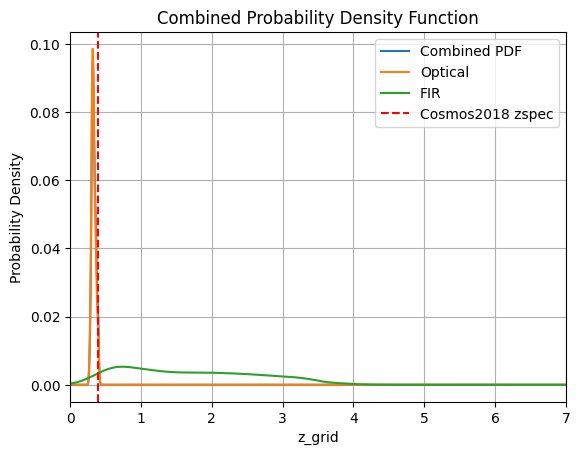

_____________ Galaxy ID :  211
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [302.66778381 343.34779679]


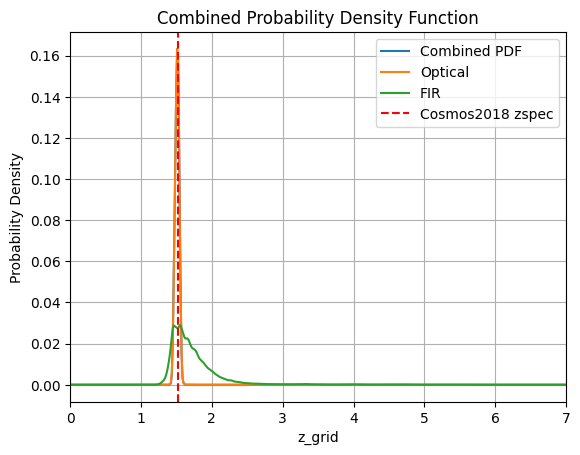

_____________ Galaxy ID :  212
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [194.99479724 194.47012165]


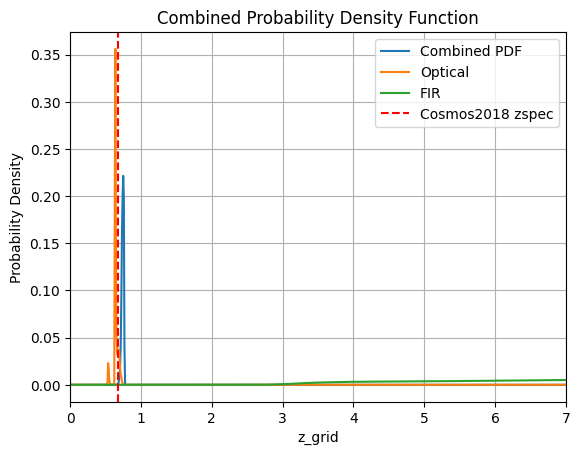

_____________ Galaxy ID :  213
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [292.50327873 292.23428654]


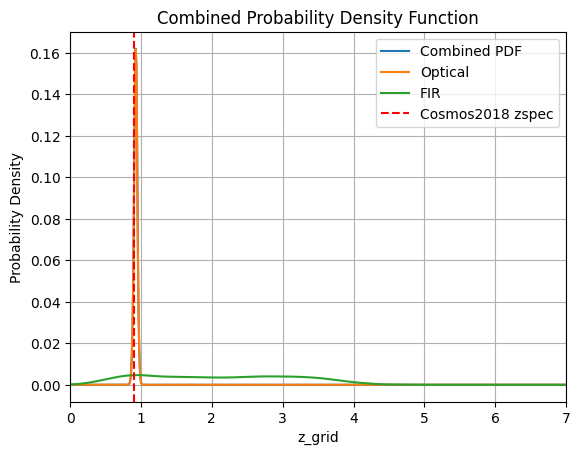

_____________ Galaxy ID :  214
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.28044532 312.36740963]


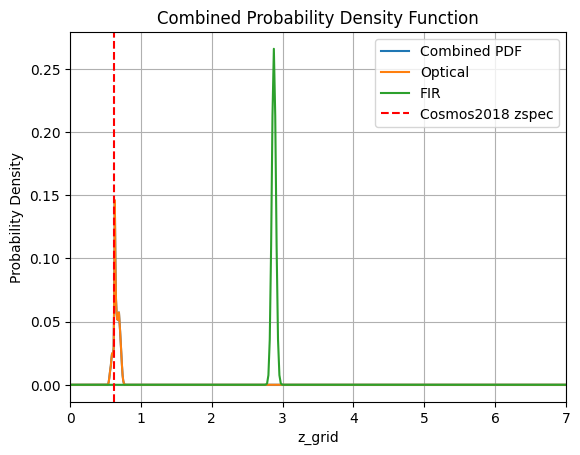

_____________ Galaxy ID :  215
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [249.23599083 356.4049335 ]


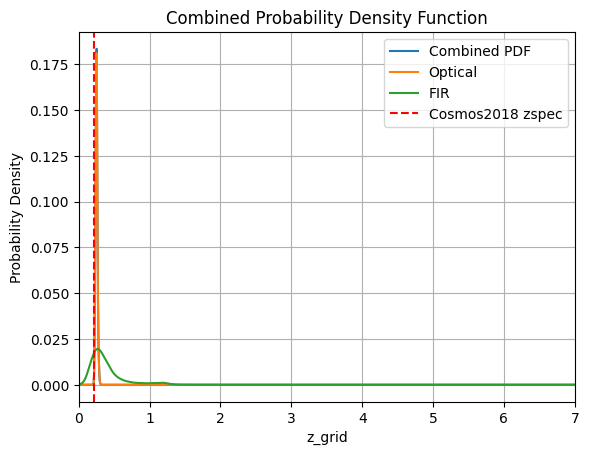

_____________ Galaxy ID :  216
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [335.90904427 336.3575052 ]


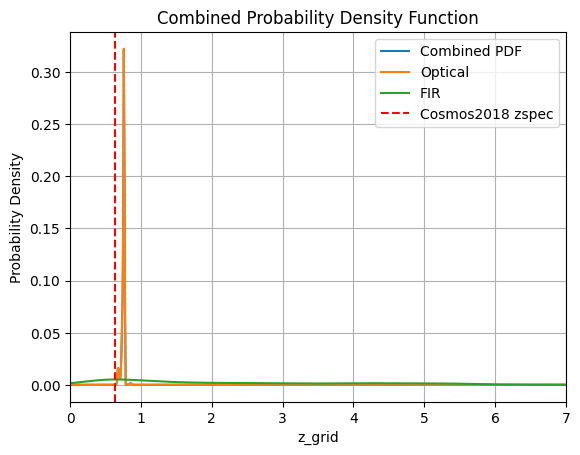

_____________ Galaxy ID :  217
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [295.38940176 296.93627478]


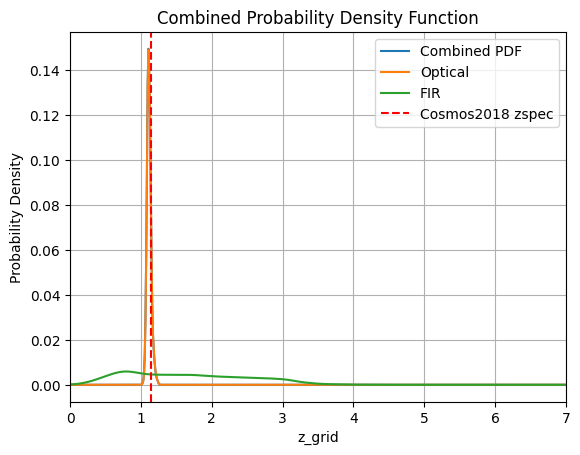

_____________ Galaxy ID :  218
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [201.91881362 205.53008083]


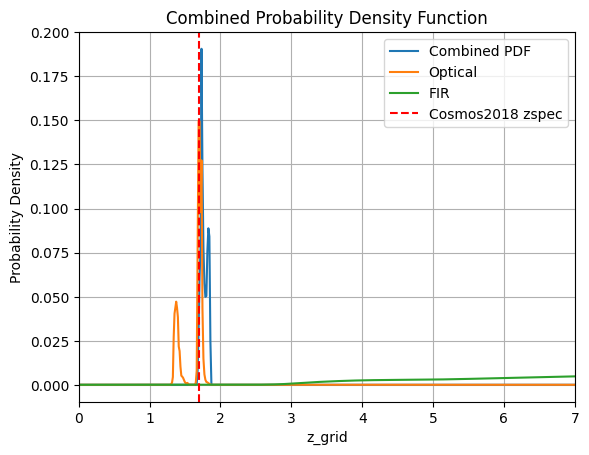

_____________ Galaxy ID :  219
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [316.96773958 316.28936022]


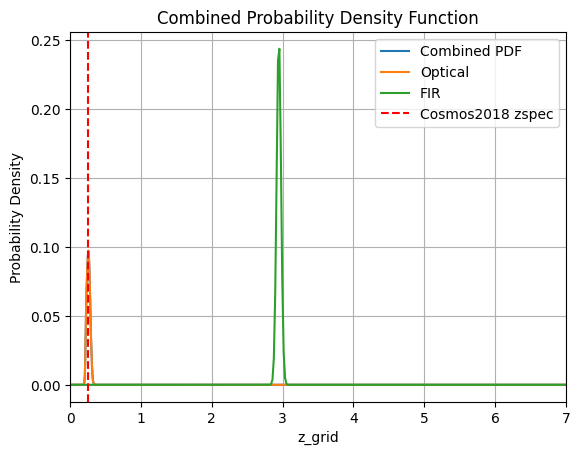

_____________ Galaxy ID :  220
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [239.32758533 230.39956772]


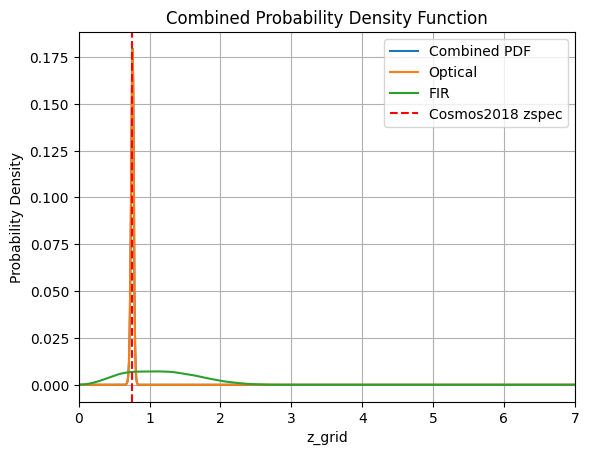

_____________ Galaxy ID :  221
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [213.75934476 208.56465112]


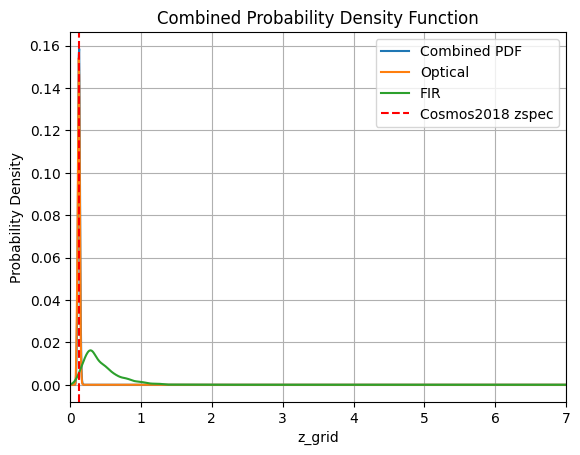

_____________ Galaxy ID :  222
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [264.53793403 269.35275835]


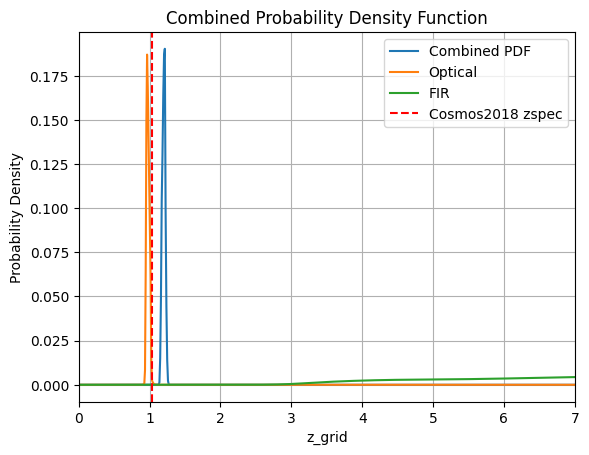

_____________ Galaxy ID :  223
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.75738536 320.27308245]


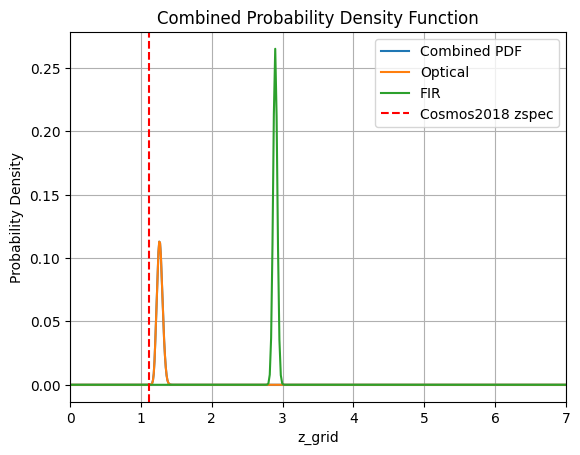

_____________ Galaxy ID :  224
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.3810763  324.95913512]


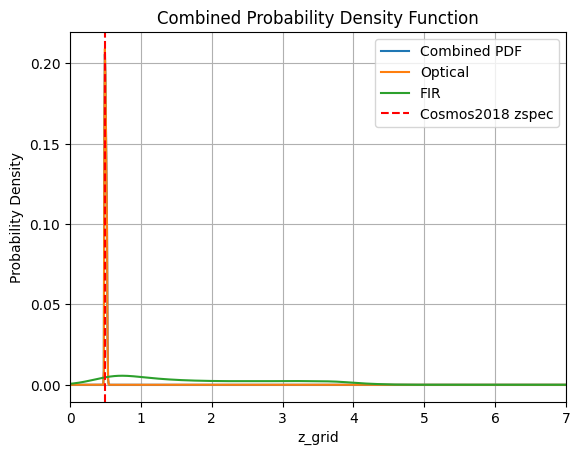

_____________ Galaxy ID :  225
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [307.1218046  309.69090074]


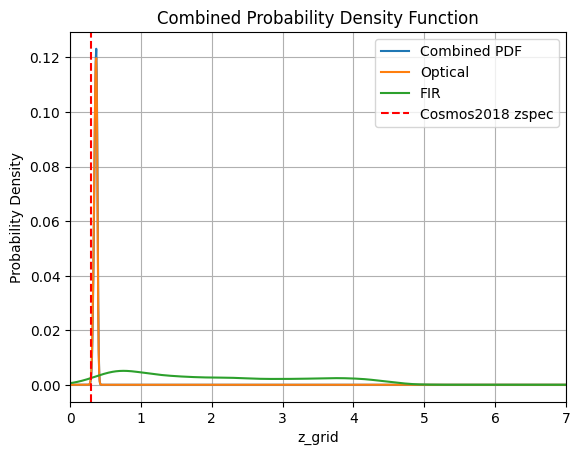

_____________ Galaxy ID :  226
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [306.25707626 307.48830723]


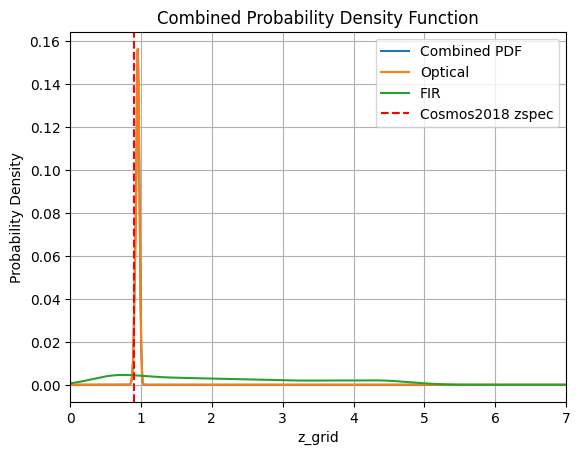

_____________ Galaxy ID :  227
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.63910923 326.8838237 ]


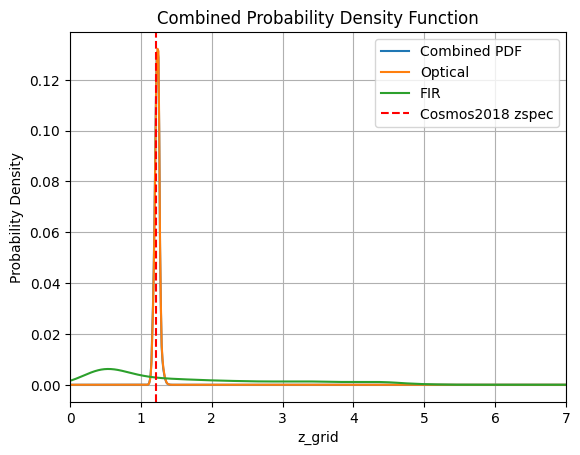

_____________ Galaxy ID :  228
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [221.4710524  208.63677779]


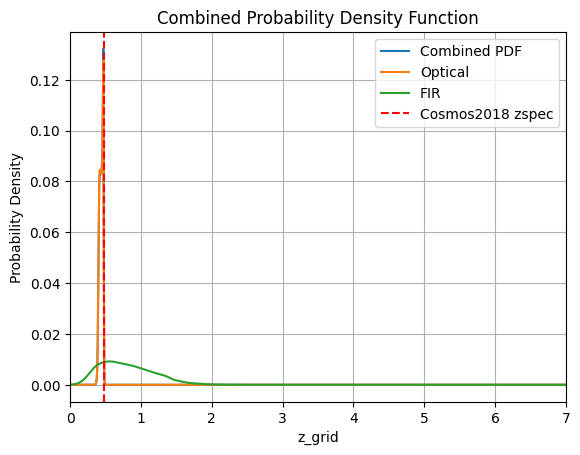

_____________ Galaxy ID :  229
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [207.13465048 213.31727505]


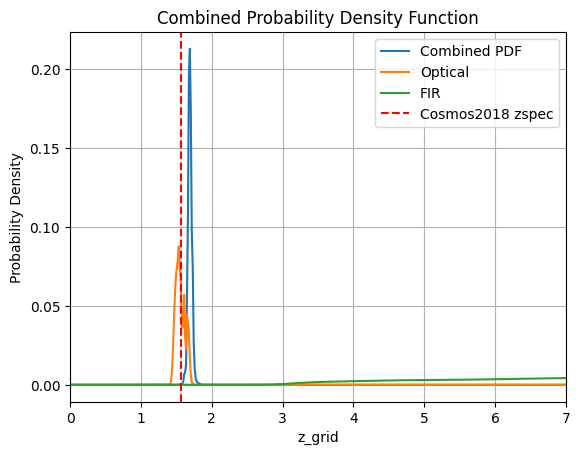

_____________ Galaxy ID :  230
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [271.76580363 267.61537096]


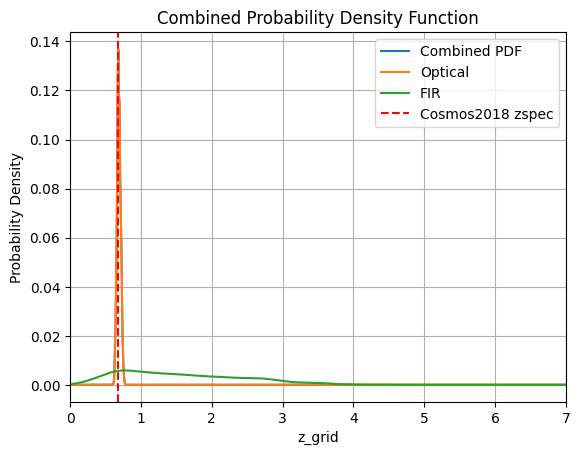

_____________ Galaxy ID :  231
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [224.78846368 213.47574113]


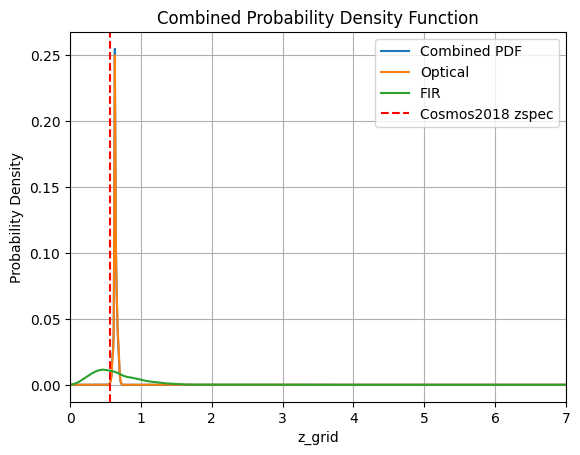

_____________ Galaxy ID :  232
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [269.04148958 269.37088281]


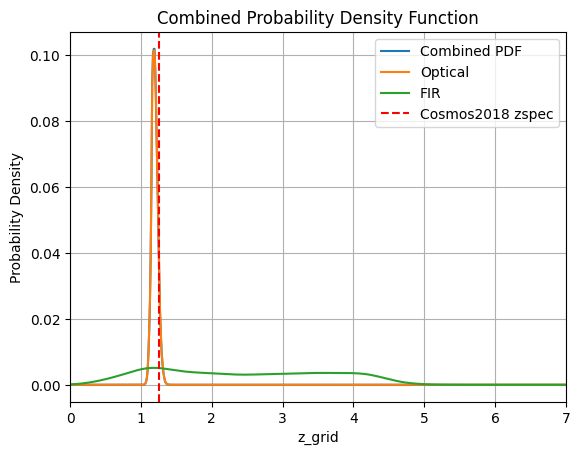

_____________ Galaxy ID :  233
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [310.09564942 318.75135875]


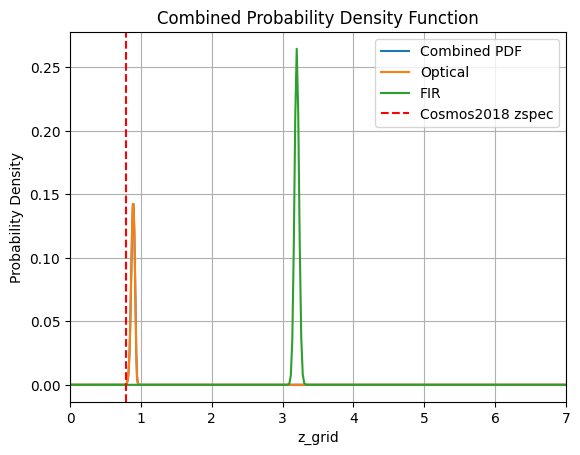

_____________ Galaxy ID :  234
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [252.08594867 256.46096494]


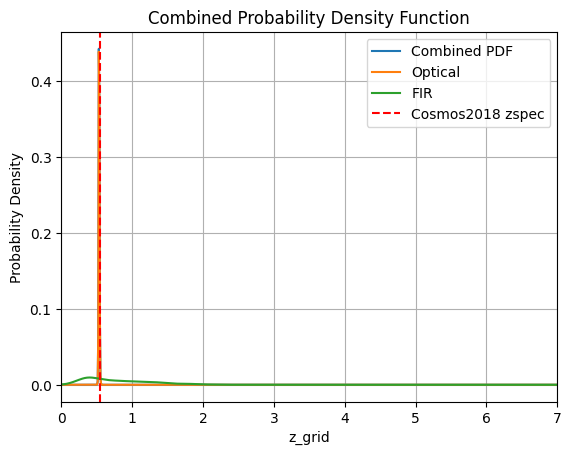

_____________ Galaxy ID :  235
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [198.44796854 200.31117973]


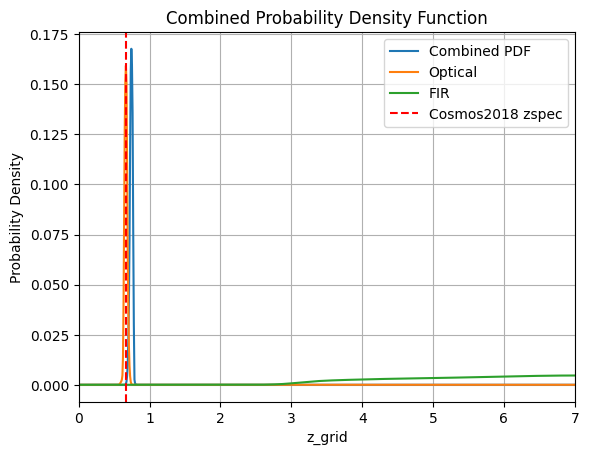

_____________ Galaxy ID :  236
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [197.08219594 186.9636303 ]


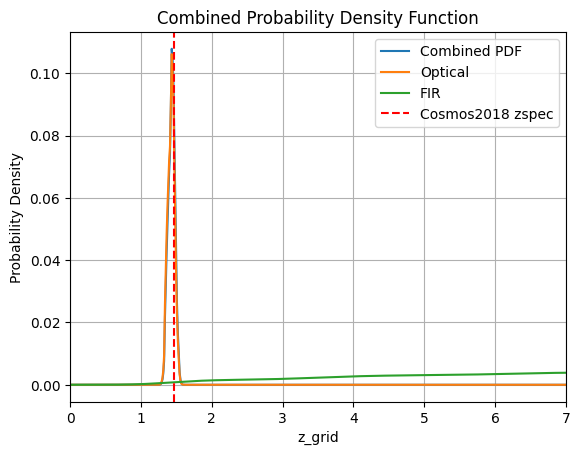

_____________ Galaxy ID :  237
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [203.92749083 210.08704595]


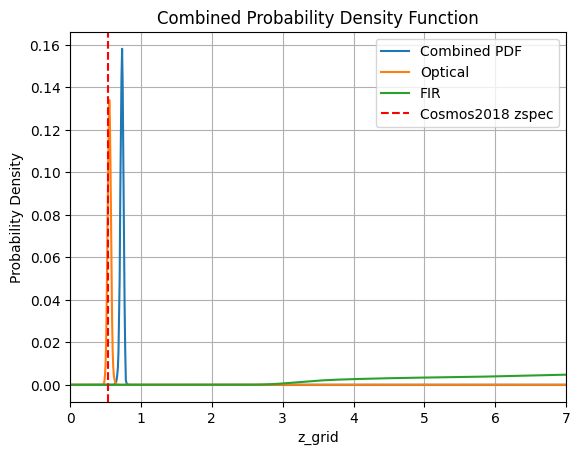

_____________ Galaxy ID :  238
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [259.65513806 252.11315205]


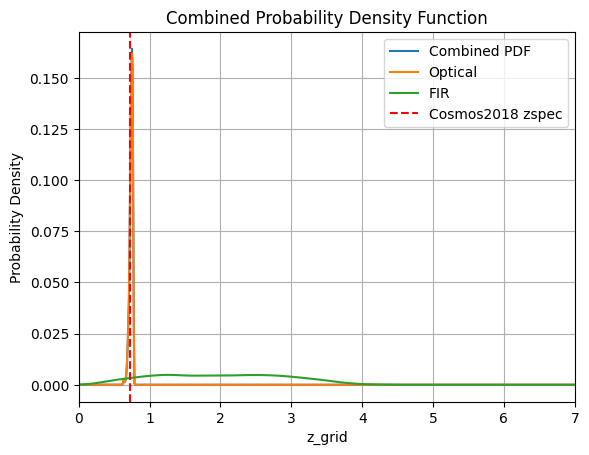

_____________ Galaxy ID :  239
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [236.11619545 219.64660751]


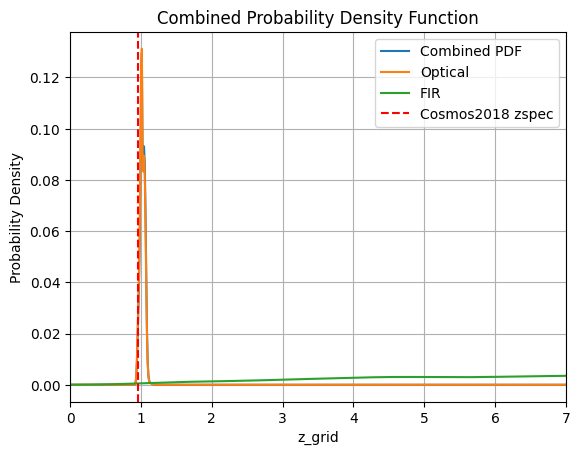

_____________ Galaxy ID :  240
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [207.82252668 200.59047333]


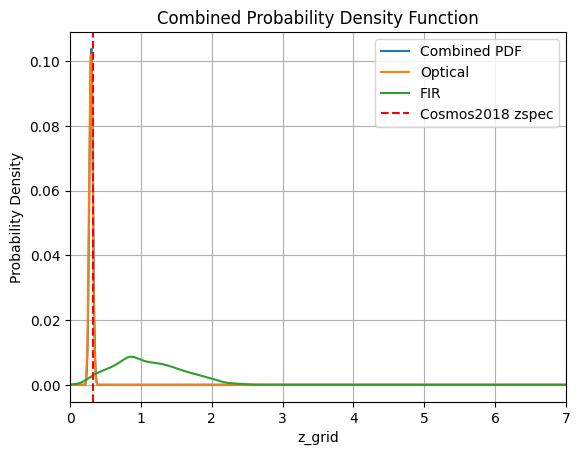

_____________ Galaxy ID :  241
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [280.01771652 279.07761931]


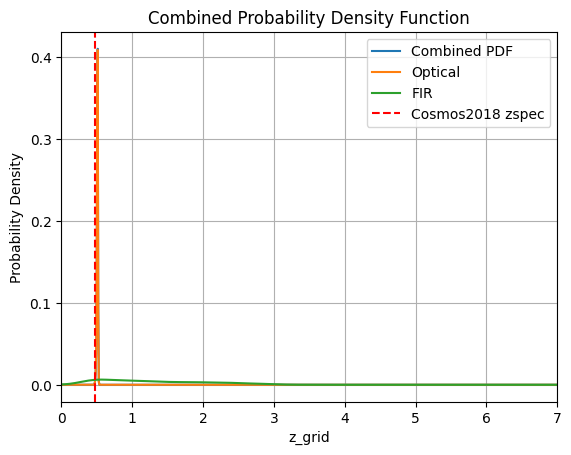

_____________ Galaxy ID :  242
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [172.97170664 174.98227173]


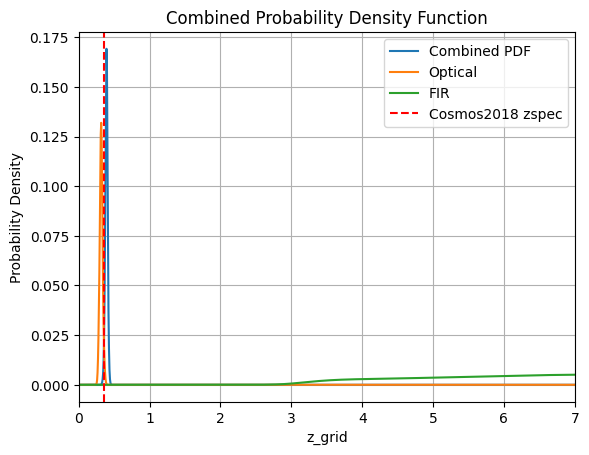

_____________ Galaxy ID :  243
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [275.39378516 275.84985149]


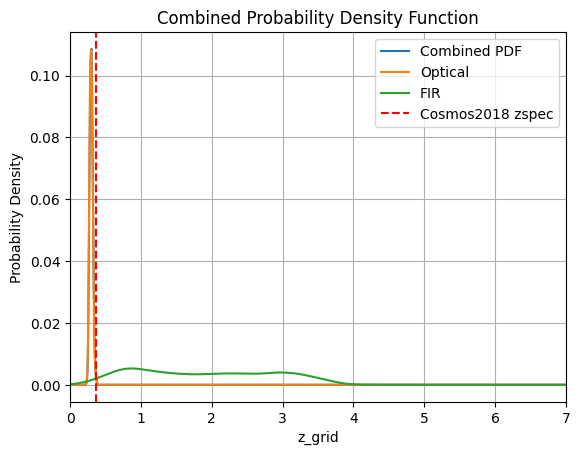

_____________ Galaxy ID :  244
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [214.85451225 211.58402582]


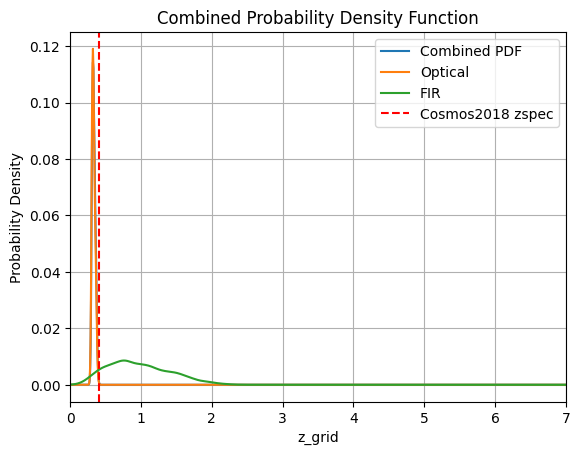

_____________ Galaxy ID :  245
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [254.63230998 236.35732117]


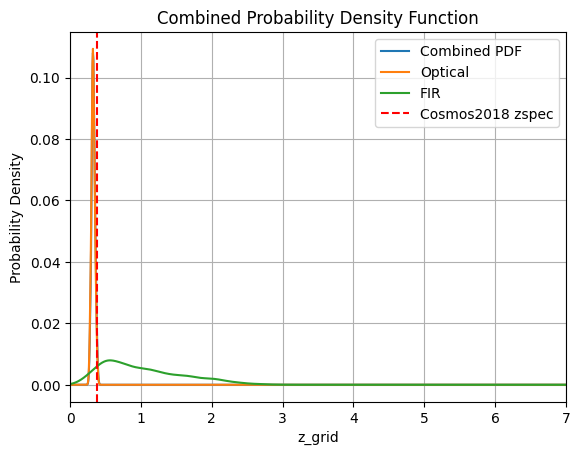

_____________ Galaxy ID :  246
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [328.72756989 315.21892367]


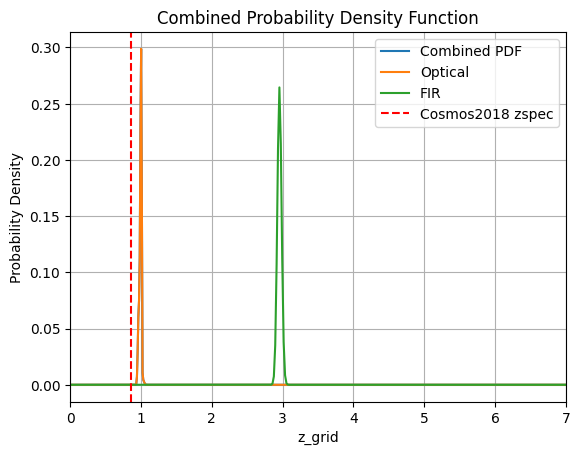

_____________ Galaxy ID :  247
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [193.56588002 192.92723327]


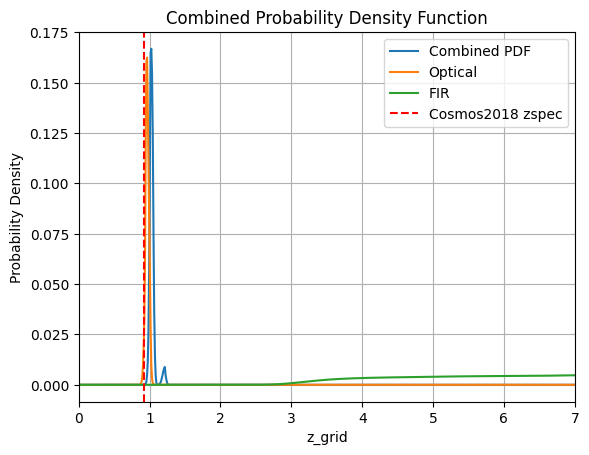

_____________ Galaxy ID :  248
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [216.9254515  214.59361109]


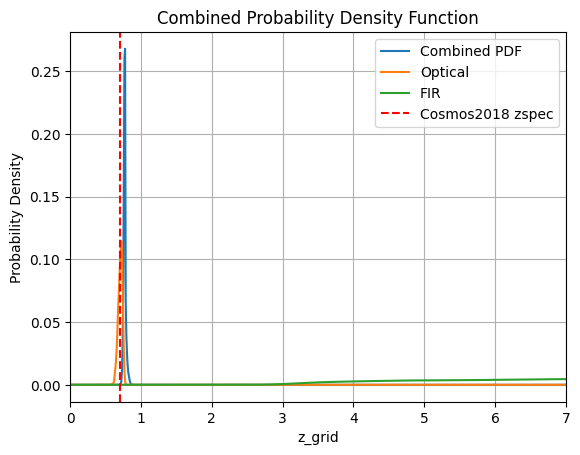

_____________ Galaxy ID :  249
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [338.96989746 332.25792365]


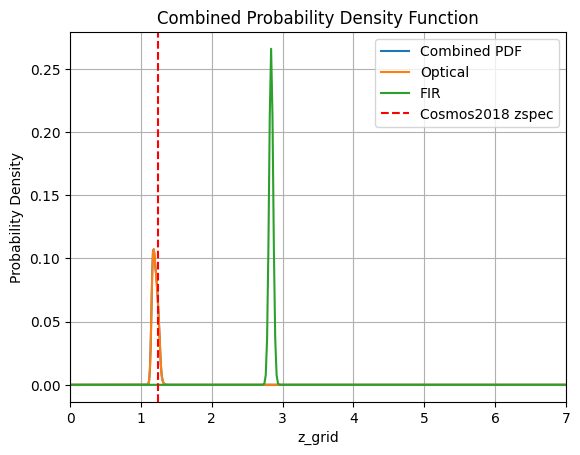

_____________ Galaxy ID :  250
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [316.18611705 313.4729583 ]


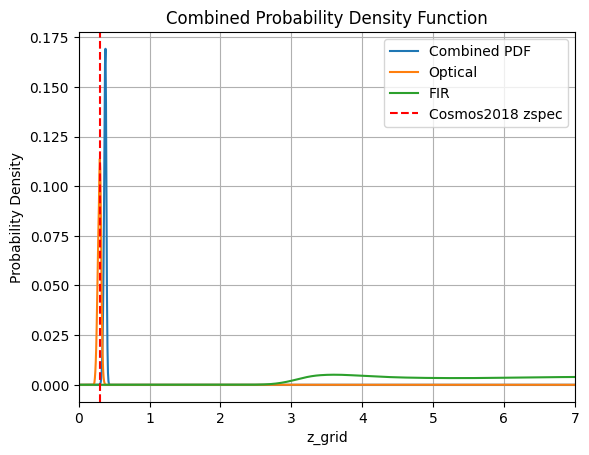

_____________ Galaxy ID :  251
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [290.33139027 288.73398089]


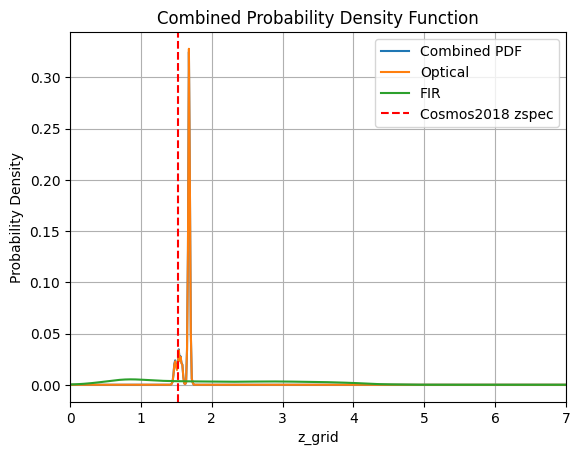

_____________ Galaxy ID :  252
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [303.80712788 321.21835008]


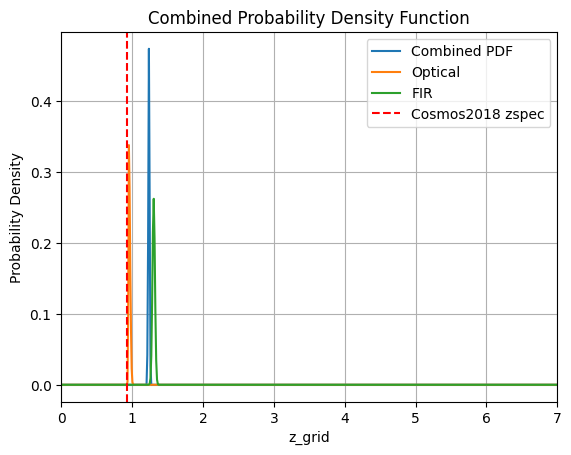

_____________ Galaxy ID :  253
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [264.32814183 263.70312135]


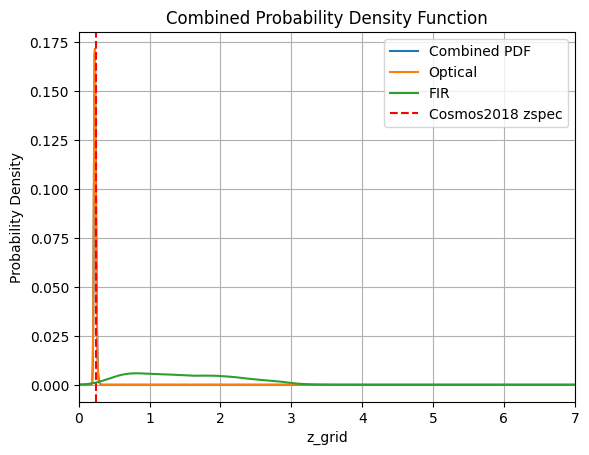

_____________ Galaxy ID :  254
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [295.38468338 292.49495028]


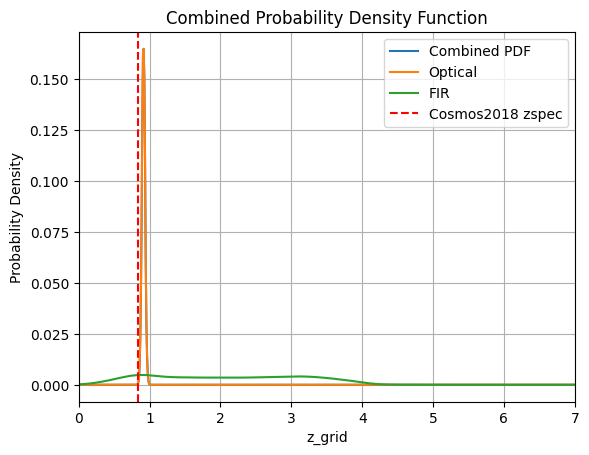

_____________ Galaxy ID :  255
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [227.74887568 229.50947249]


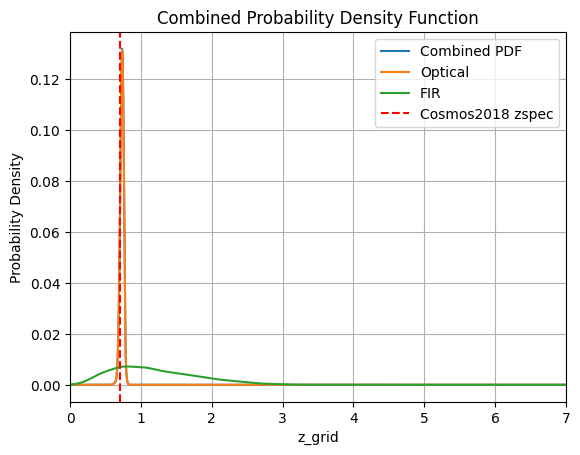

_____________ Galaxy ID :  256
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [333.69103683 326.53359983]


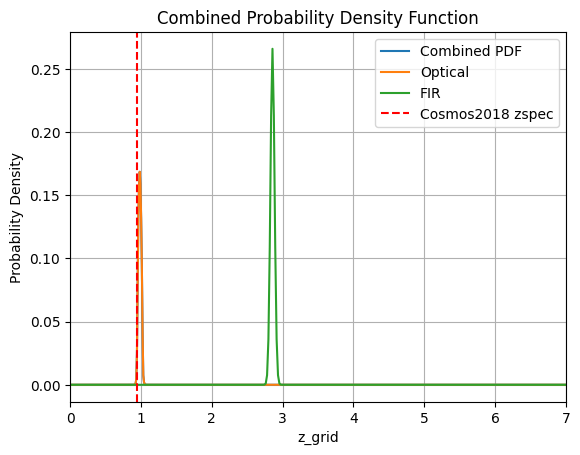

_____________ Galaxy ID :  257
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [292.15195917 292.17306499]


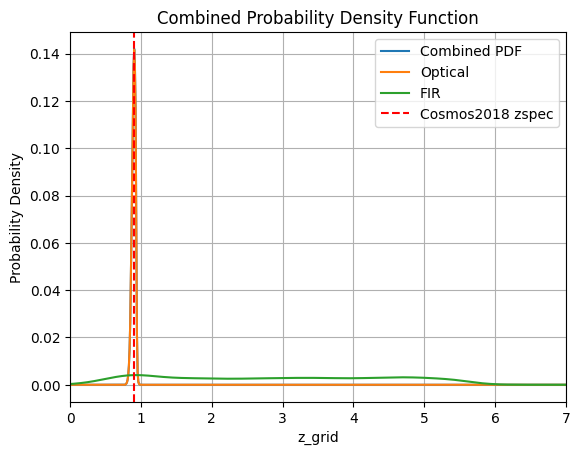

_____________ Galaxy ID :  258
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [324.9780641  308.67405968]


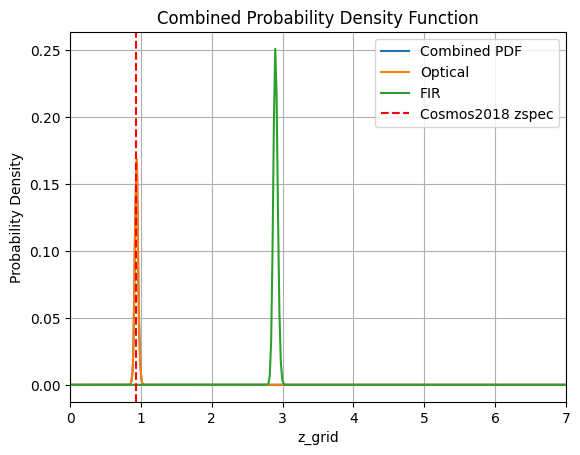

_____________ Galaxy ID :  259
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [183.40422919 182.43348812]


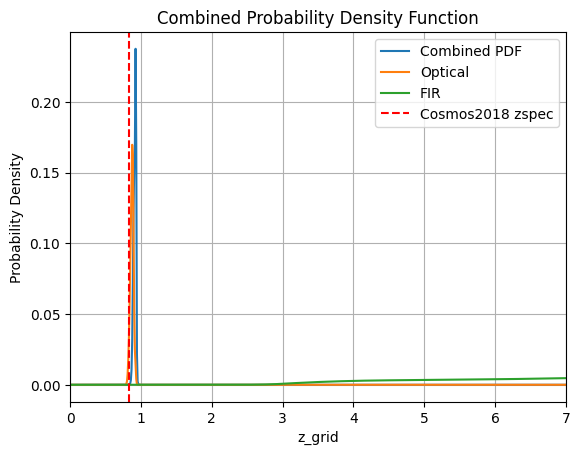

_____________ Galaxy ID :  260
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [342.48911824 343.94654835]


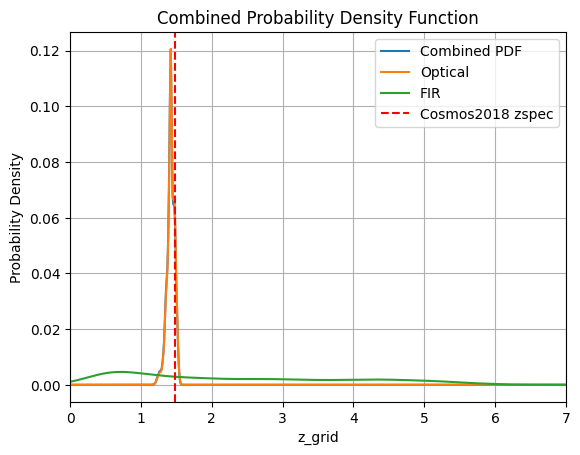

_____________ Galaxy ID :  261
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [314.81195621 305.10449646]


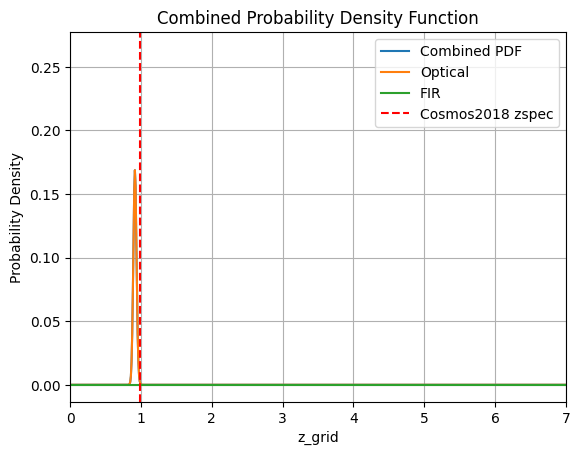

_____________ Galaxy ID :  262
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [295.19836026 297.45319014]


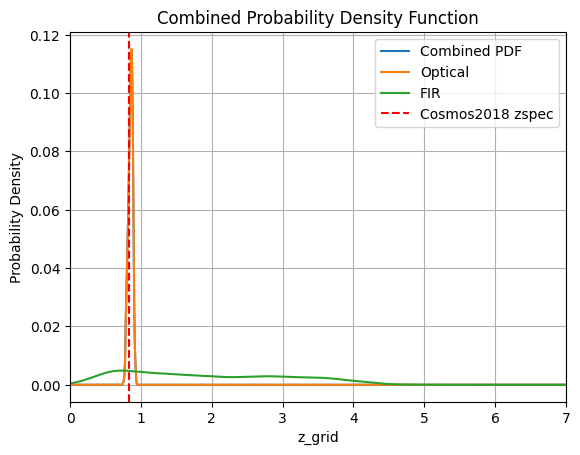

_____________ Galaxy ID :  263
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [333.96079492 333.08109336]


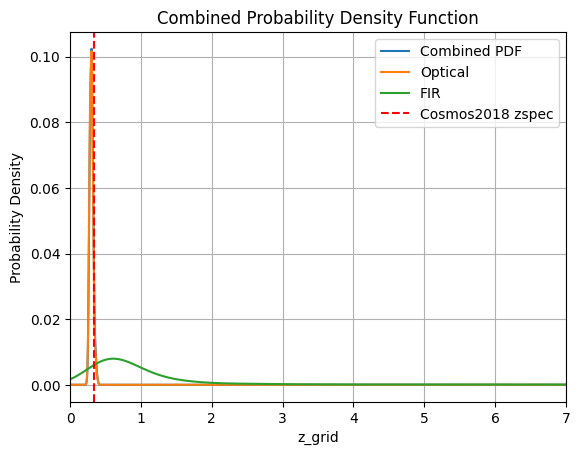

_____________ Galaxy ID :  264
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [188.99243739 189.65688907]


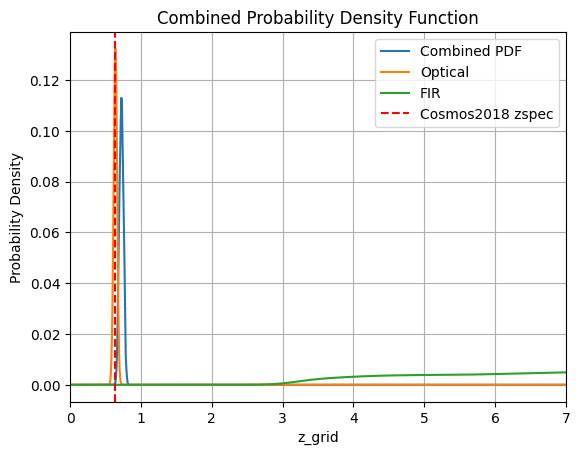

_____________ Galaxy ID :  265
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [259.27578223 263.30811149]


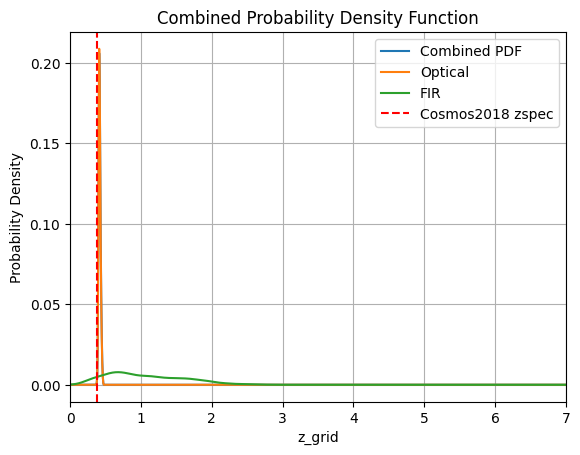

_____________ Galaxy ID :  266
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [192.78359422 191.72514101]


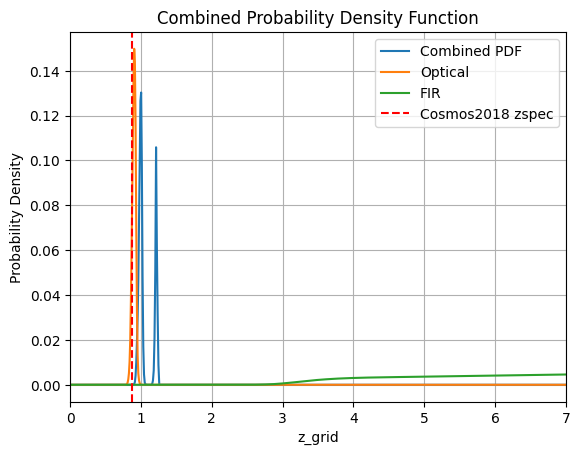

_____________ Galaxy ID :  267
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [228.03420901 226.87499621]


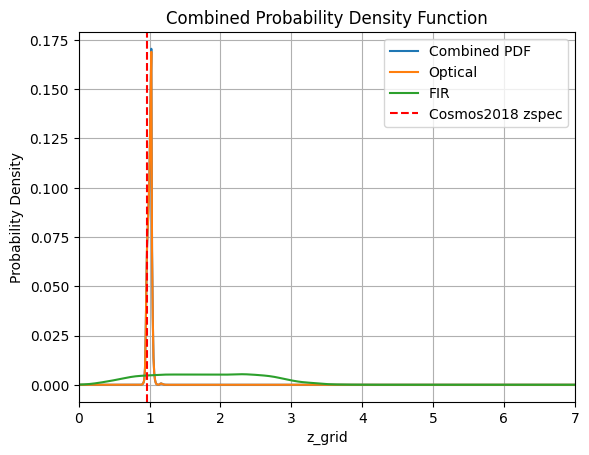

_____________ Galaxy ID :  268
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [268.39689337 268.21453359]


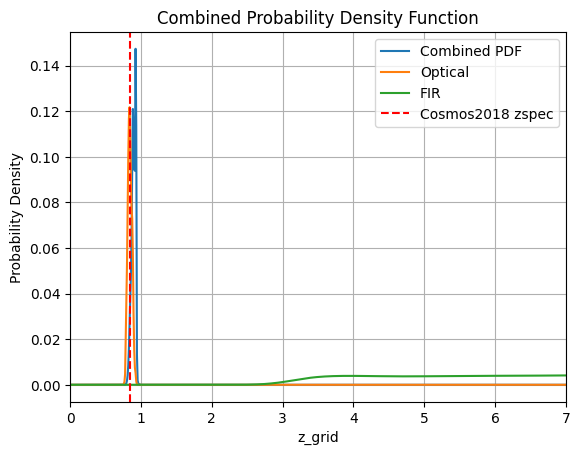

_____________ Galaxy ID :  269
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [202.91410127 187.80917909]


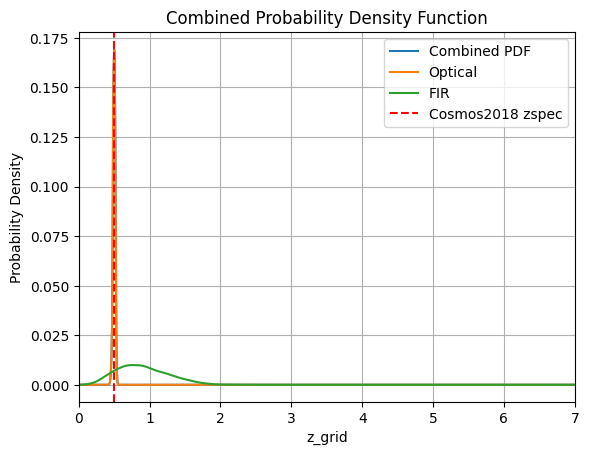

_____________ Galaxy ID :  270
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [319.95127612 314.67204818]


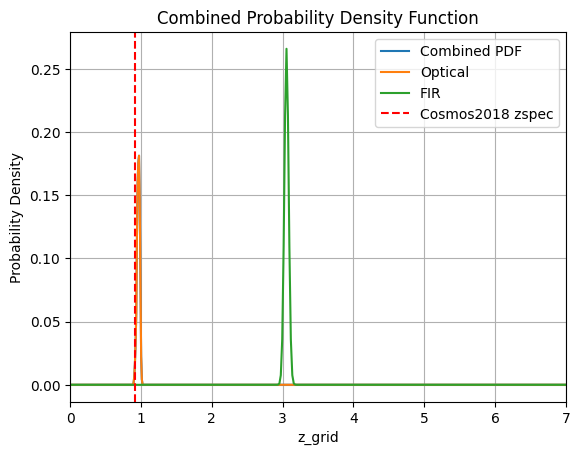

_____________ Galaxy ID :  271
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [330.94730869 332.64905081]


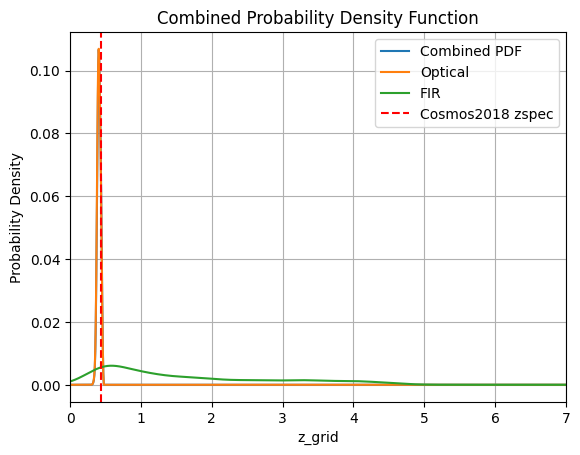

_____________ Galaxy ID :  272
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [263.974979  264.3365465]


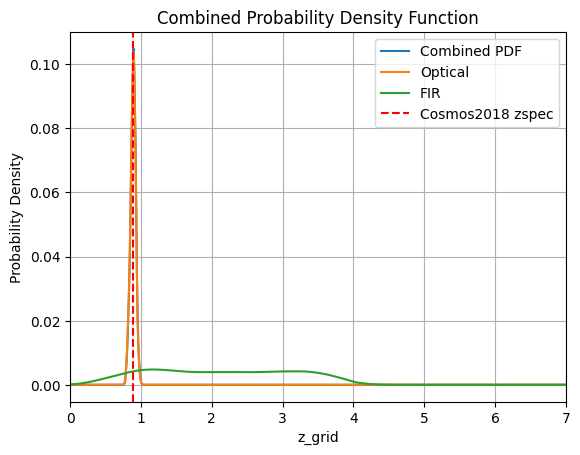

_____________ Galaxy ID :  273
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [254.58799506 251.38821293]


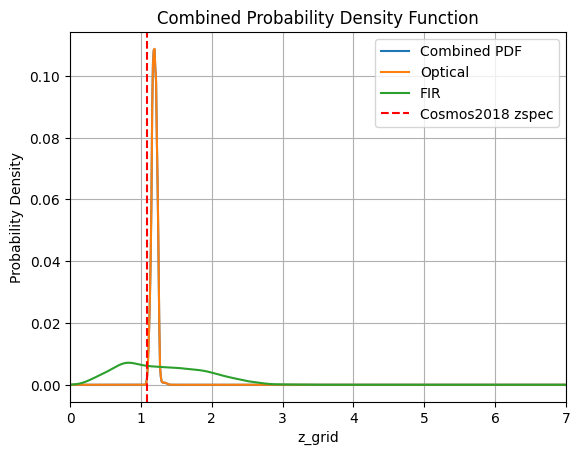

_____________ Galaxy ID :  274
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [219.06873921 219.94360955]


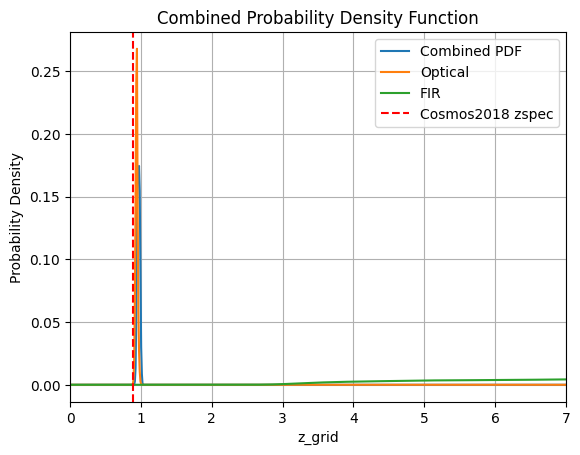

_____________ Galaxy ID :  275
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [195.6536824  194.55733364]


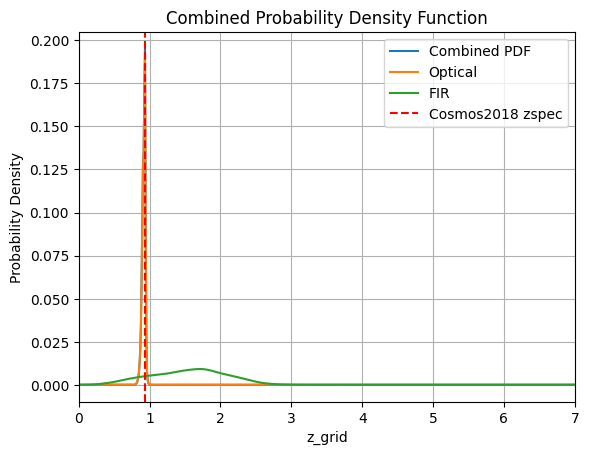

_____________ Galaxy ID :  276
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [219.22002542 210.91307855]


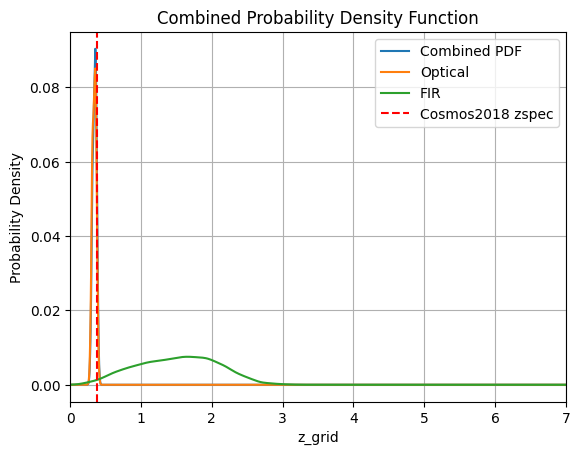

_____________ Galaxy ID :  277
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [182.35330345 179.4424188 ]


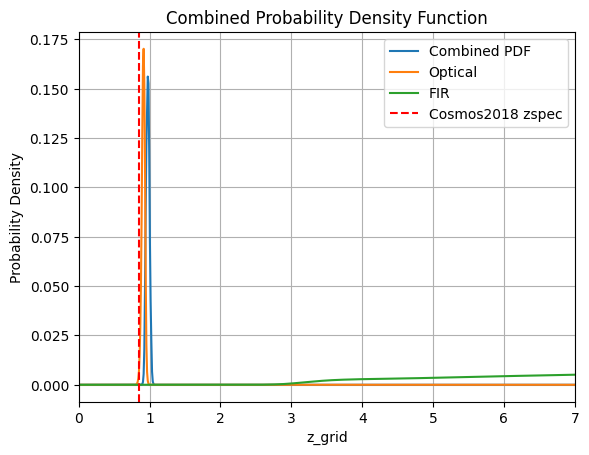

_____________ Galaxy ID :  278
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [298.29767288 300.85227767]


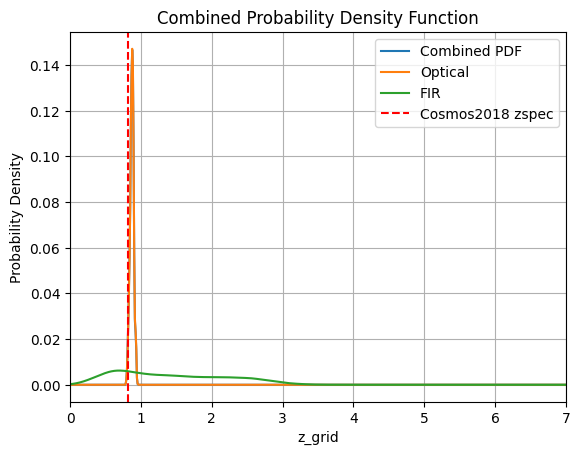

_____________ Galaxy ID :  279
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [290.28806043 290.51421701]


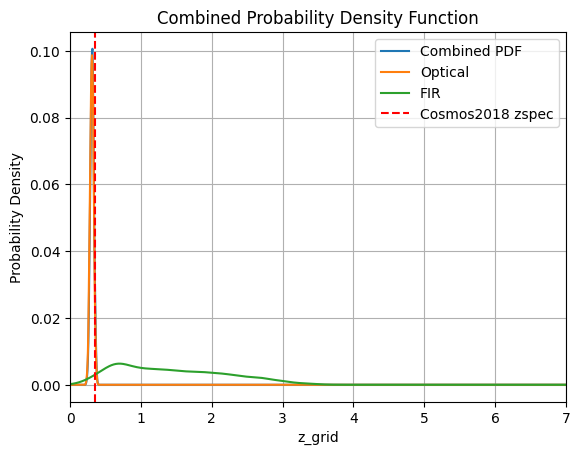

_____________ Galaxy ID :  280
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.44869509 312.06845483]


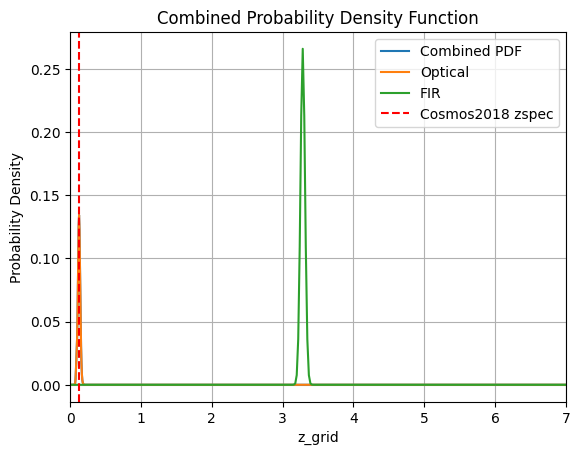

_____________ Galaxy ID :  281
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [303.51897154 305.34208957]


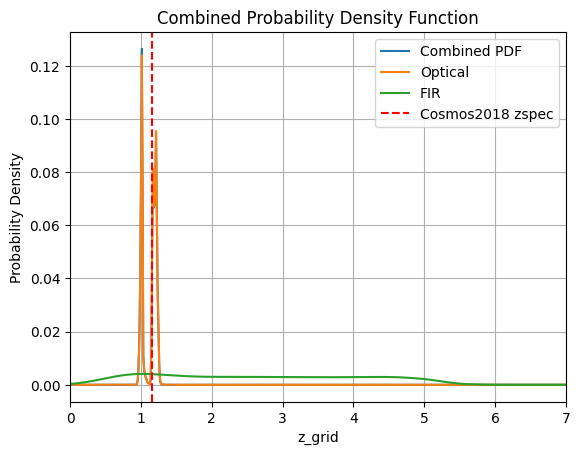

_____________ Galaxy ID :  282
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [187.88907833 190.65632021]


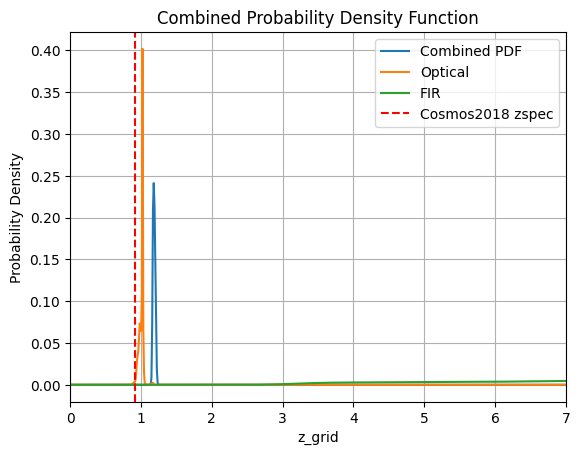

_____________ Galaxy ID :  283
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [191.88259509 194.53731413]


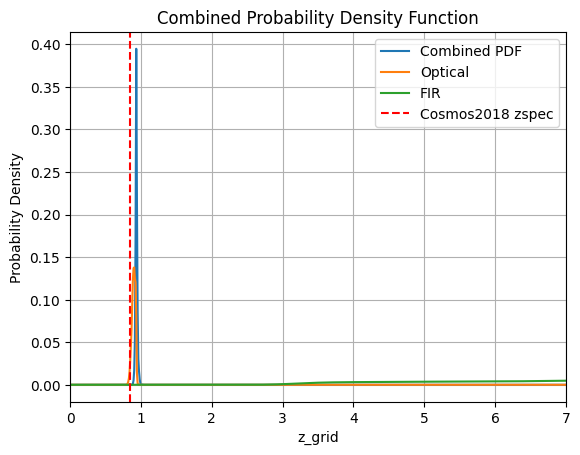

_____________ Galaxy ID :  284
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [304.09097357 305.02687041]


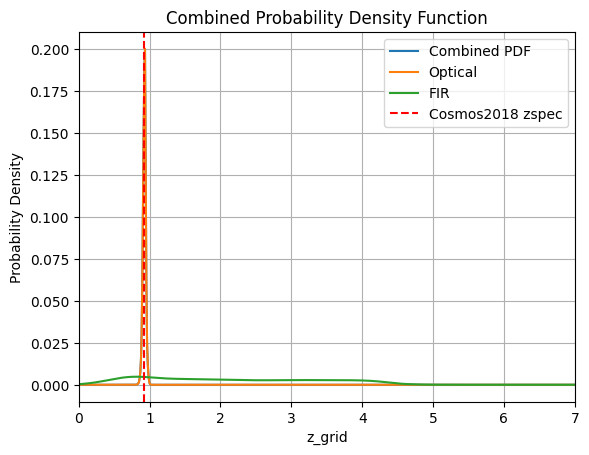

_____________ Galaxy ID :  285
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [238.49596538 235.13130746]


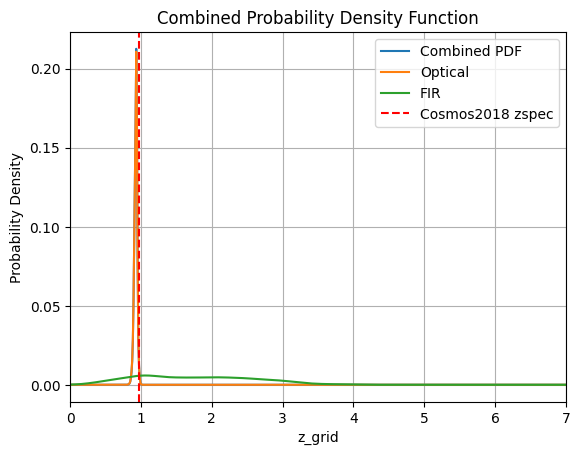

_____________ Galaxy ID :  286
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [239.56829644 236.53974444]


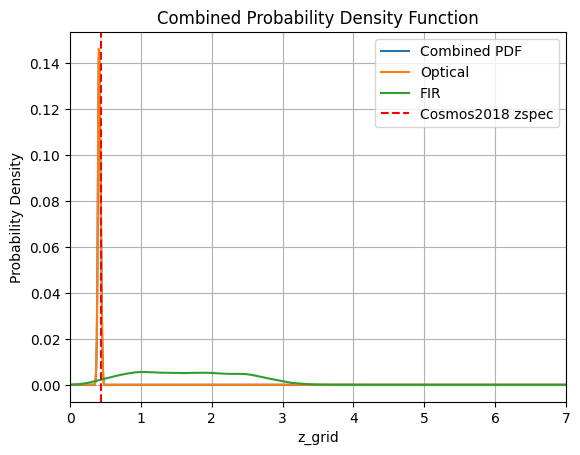

_____________ Galaxy ID :  287
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [302.3007232  308.49368702]


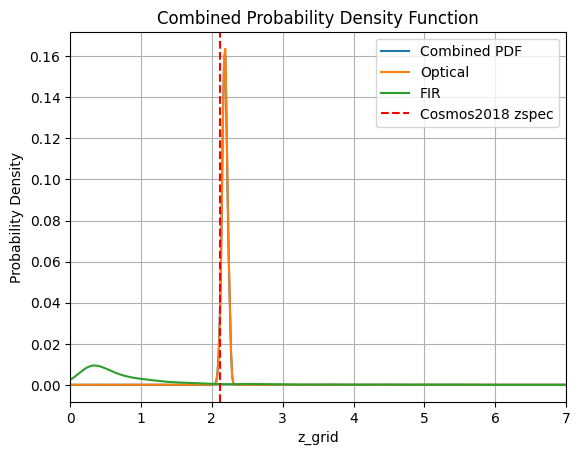

_____________ Galaxy ID :  288
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [325.89813708 323.59959656]


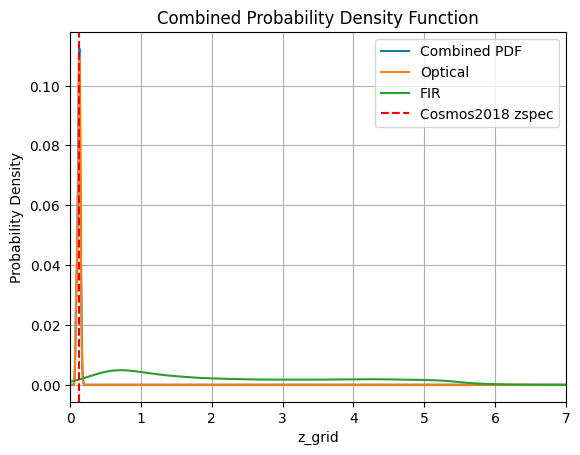

_____________ Galaxy ID :  289
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [322.39706185 314.00640044]


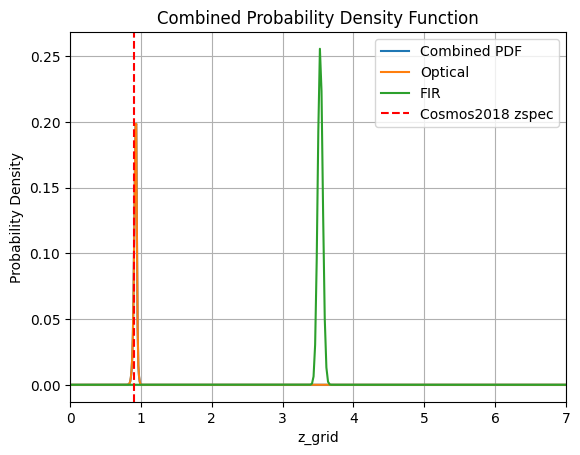

_____________ Galaxy ID :  290
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [331.79179643 332.10869221]


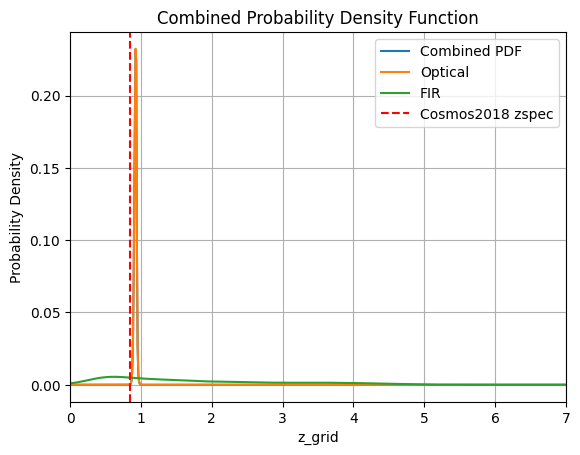

_____________ Galaxy ID :  291
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [188.37851145 187.52138838]


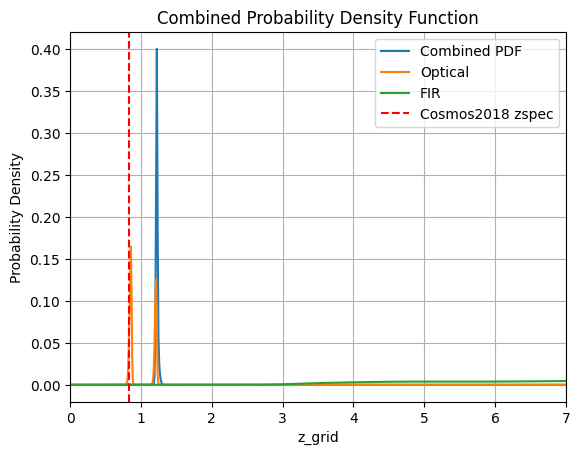

_____________ Galaxy ID :  292
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [203.42274787 202.54707636]


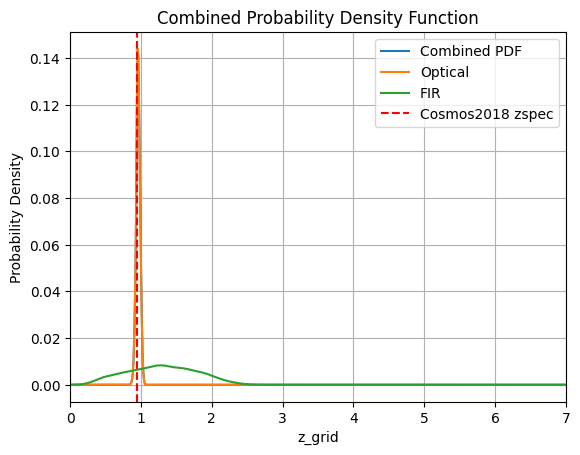

_____________ Galaxy ID :  293
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [236.29302306 222.57755432]


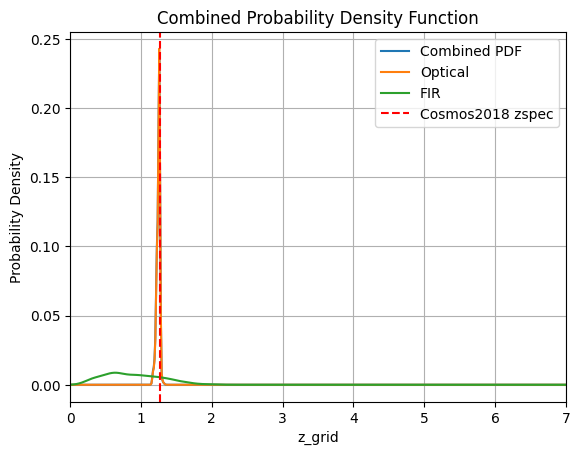

_____________ Galaxy ID :  294
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [297.96697146 296.98436788]


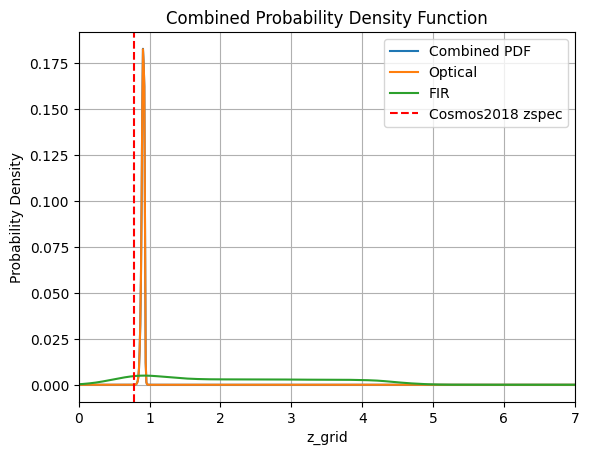

_____________ Galaxy ID :  295
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [294.72450334 293.05039879]


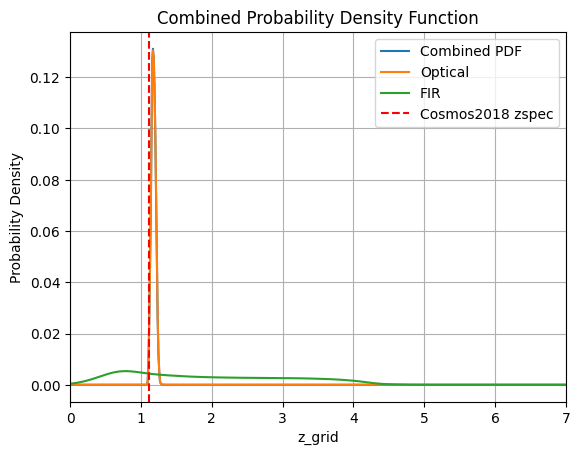

_____________ Galaxy ID :  296
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [233.91539736 238.49824391]


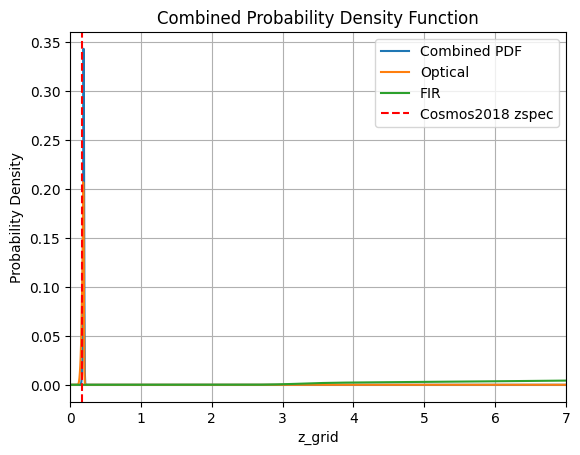

_____________ Galaxy ID :  297
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [314.34608667 310.87932849]


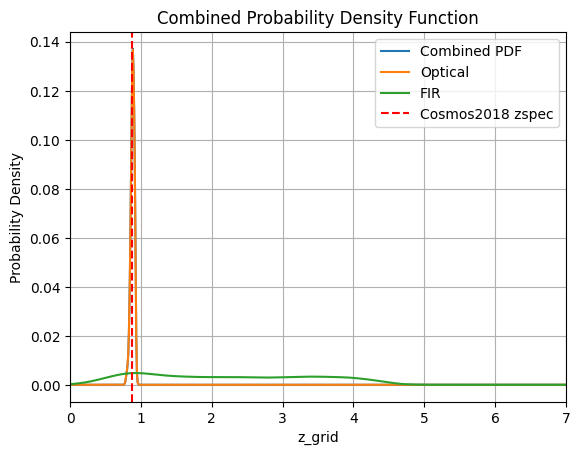

_____________ Galaxy ID :  298
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [291.97559202 288.0893354 ]


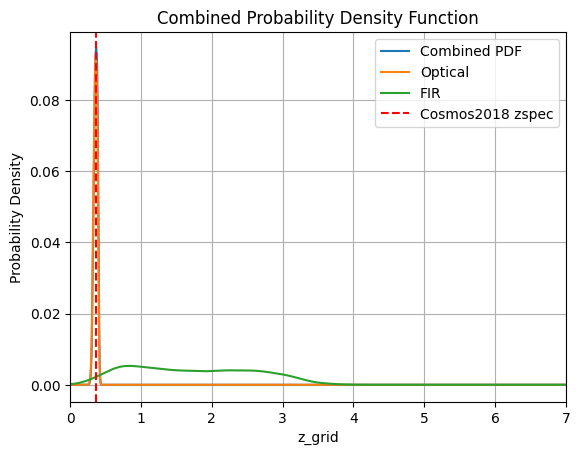

_____________ Galaxy ID :  299
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [241.55353957 240.3660766 ]


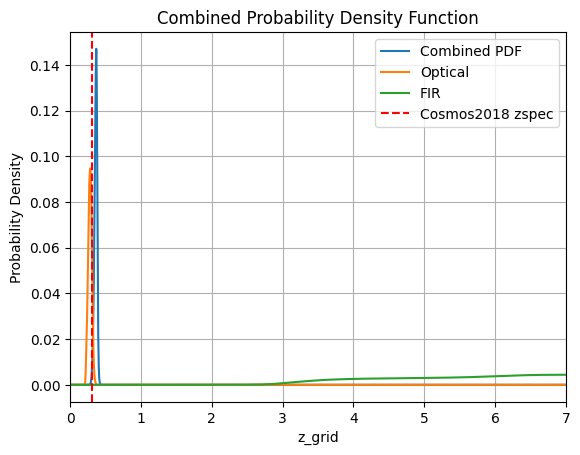

_____________ Galaxy ID :  300
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [225.45361916 228.54022922]


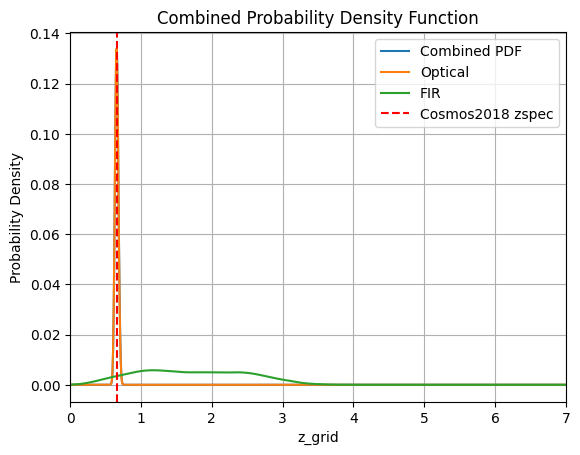

_____________ Galaxy ID :  301
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [342.53686274 343.44045671]


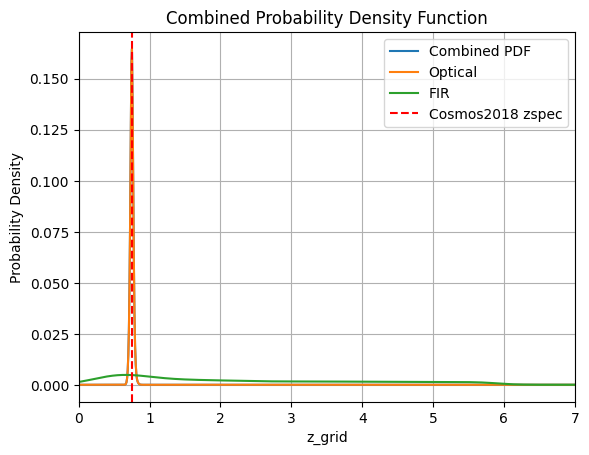

_____________ Galaxy ID :  302
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [279.74627253 279.48645607]


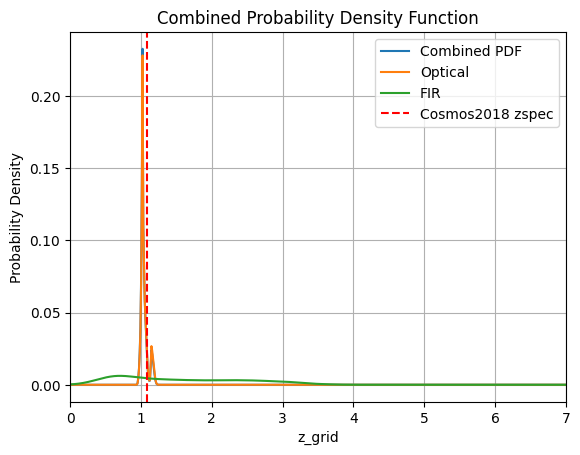

_____________ Galaxy ID :  303
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [296.27222699 296.76477499]


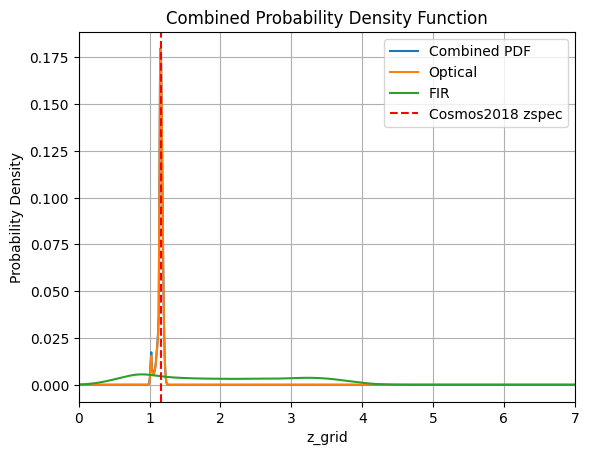

_____________ Galaxy ID :  304
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [236.03131097 234.15351641]


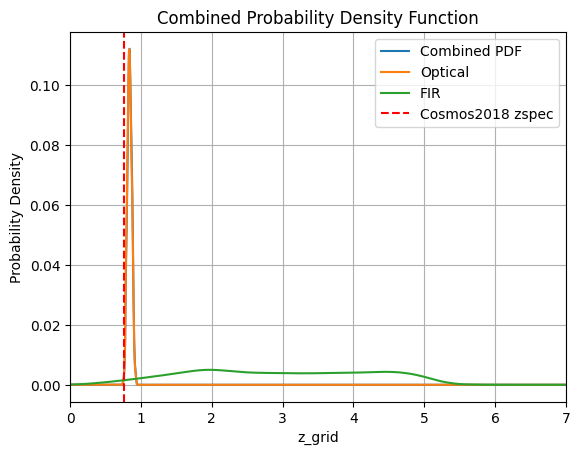

_____________ Galaxy ID :  305
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [313.37508315 313.96019022]


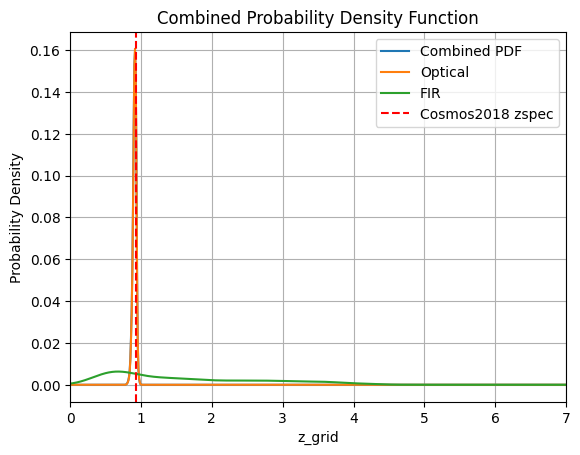

_____________ Galaxy ID :  306
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [199.59881345 196.72944614]


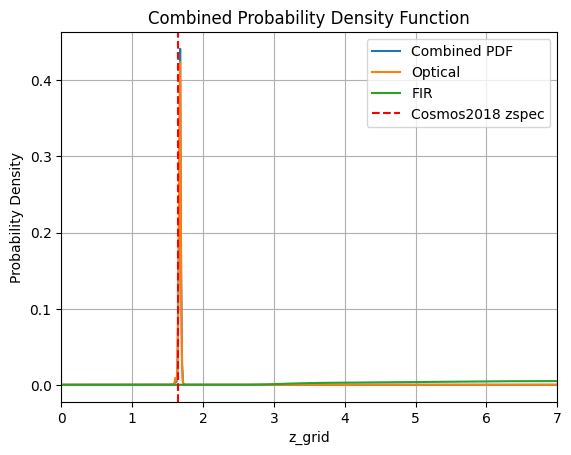

_____________ Galaxy ID :  307
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [237.39798088 237.33109792]


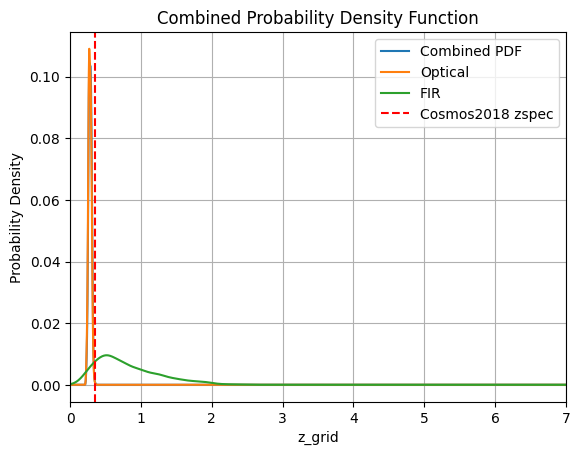

_____________ Galaxy ID :  308
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [250.07267962 258.40882858]


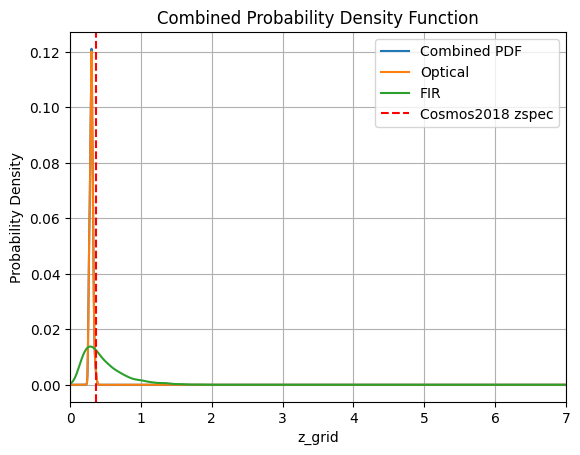

_____________ Galaxy ID :  309
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [289.1586834  247.25767803]


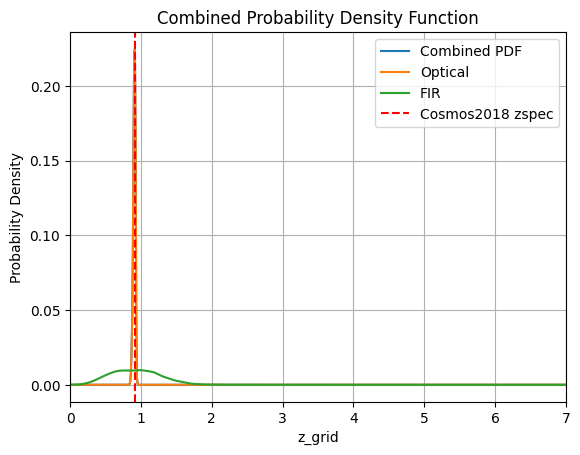

_____________ Galaxy ID :  310
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [253.29152333 257.8105931 ]


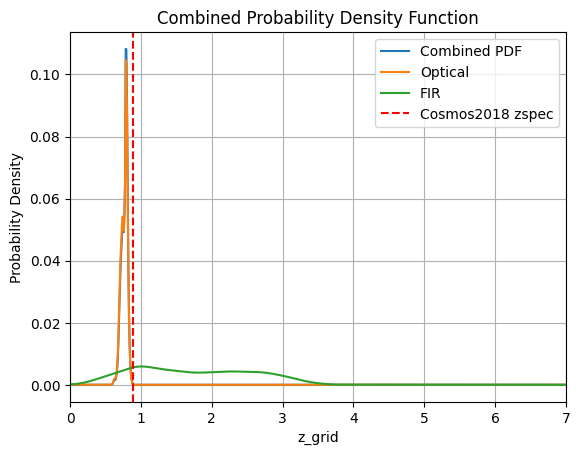

_____________ Galaxy ID :  311
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [306.69293929 305.9173701 ]


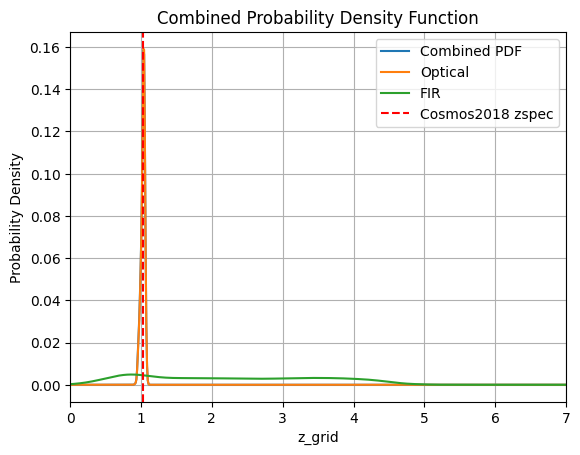

_____________ Galaxy ID :  312
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [299.39280925 300.25728111]


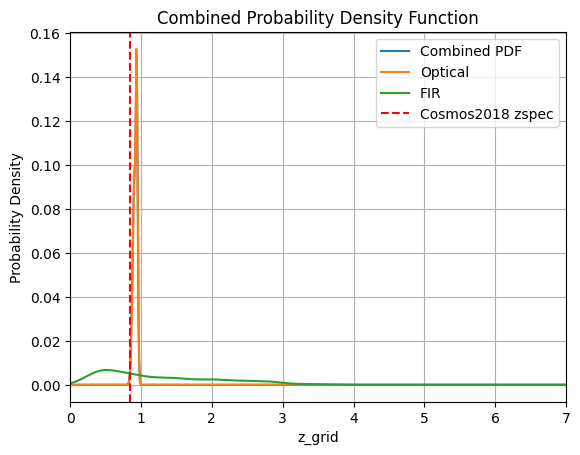

_____________ Galaxy ID :  313
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [207.44908743 212.83174197]


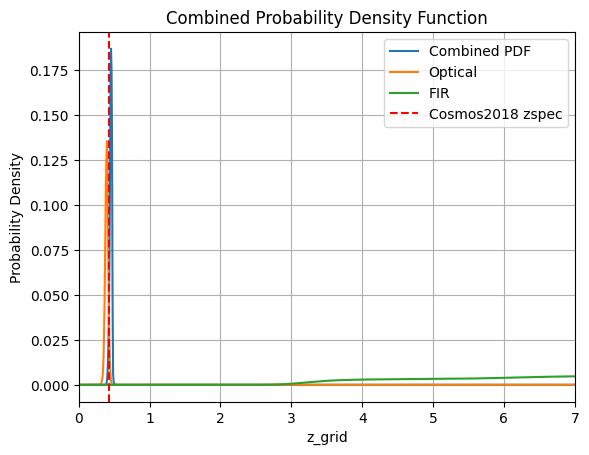

_____________ Galaxy ID :  314
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [235.36880868 224.99119278]


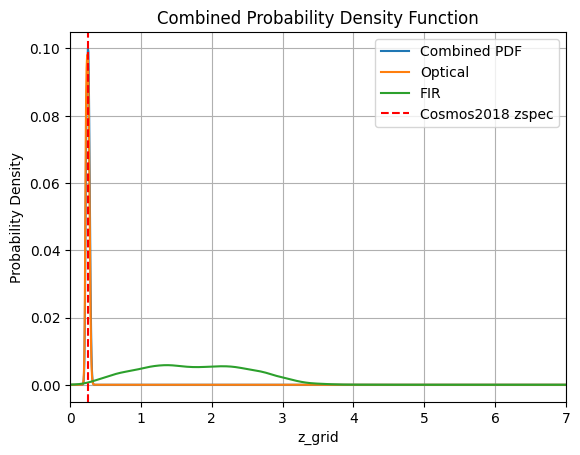

_____________ Galaxy ID :  315
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [188.90064317 190.96811582]


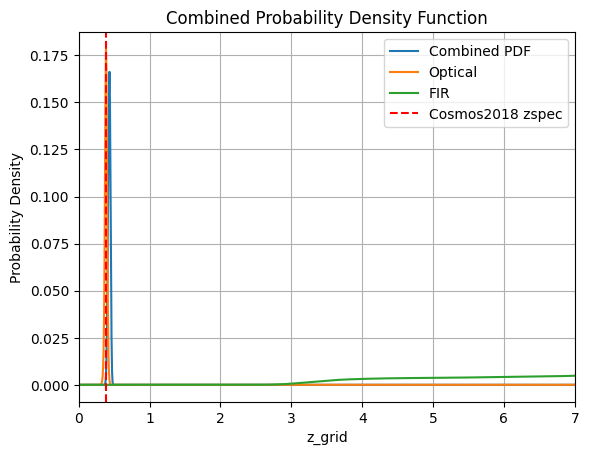

_____________ Galaxy ID :  316
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [275.65495067 272.79573449]


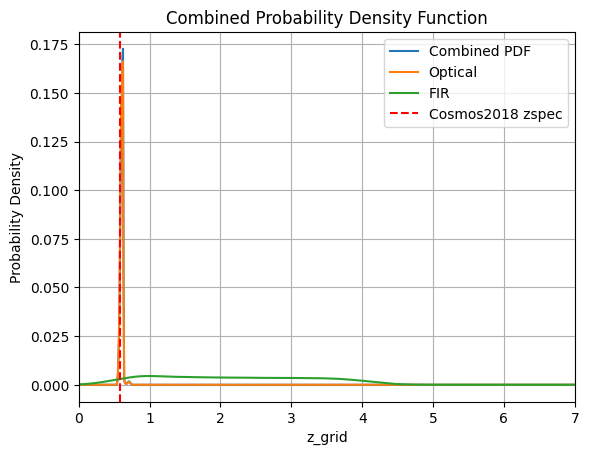

_____________ Galaxy ID :  317
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [220.17911731 214.35817849]


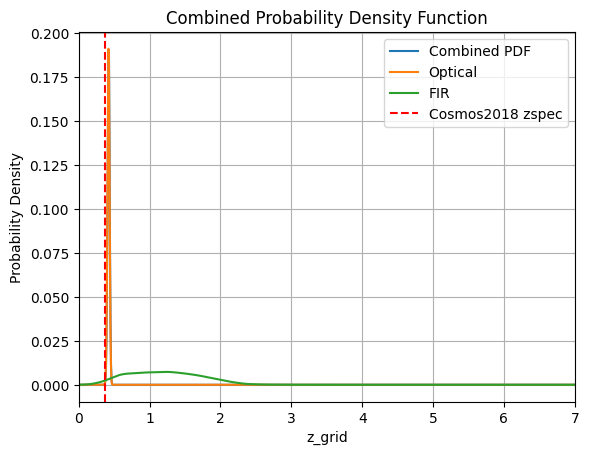

_____________ Galaxy ID :  318
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [317.55598777 318.98731153]


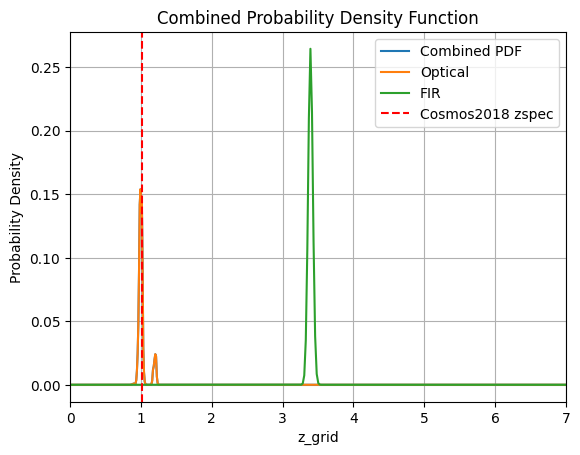

_____________ Galaxy ID :  319
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [319.16239941 387.03910511]


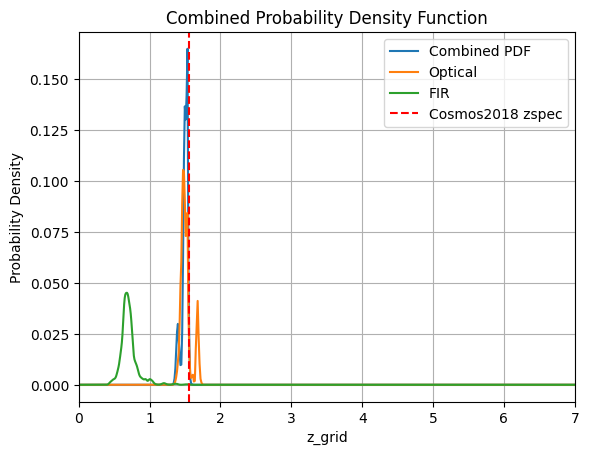

_____________ Galaxy ID :  320
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [210.55740169 216.93241526]


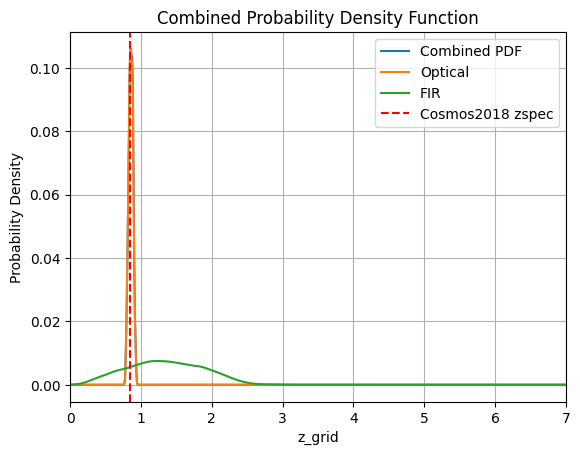

_____________ Galaxy ID :  321
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [280.77731002 281.39860939]


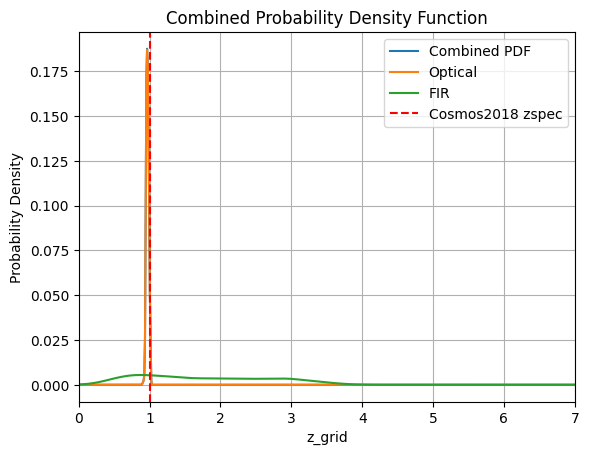

_____________ Galaxy ID :  322
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [262.45126627 264.87511836]


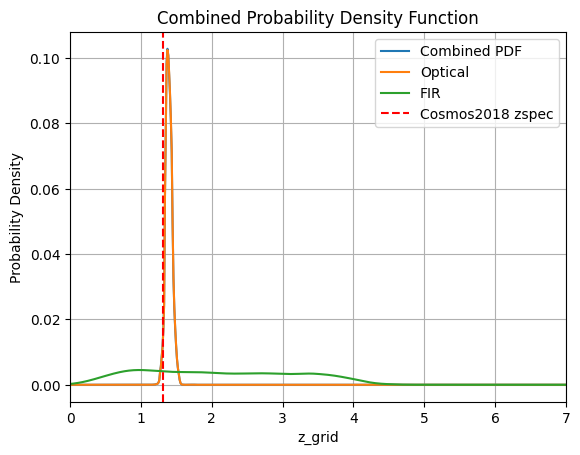

_____________ Galaxy ID :  323
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [282.19378303 282.40071977]


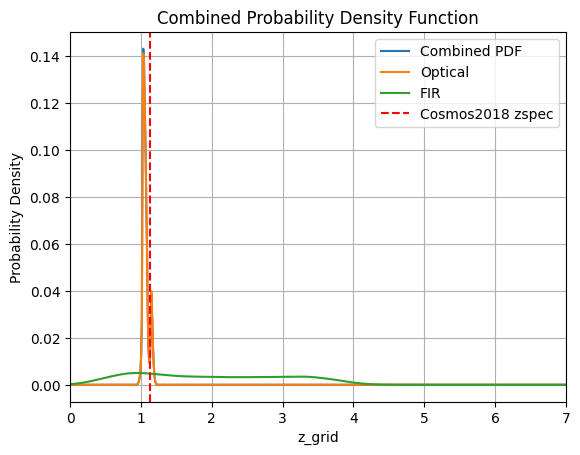

_____________ Galaxy ID :  324
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [322.70063918 321.68667262]


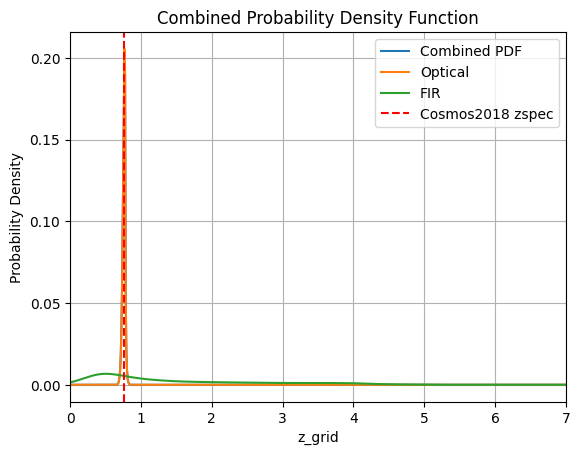

_____________ Galaxy ID :  325
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [278.12564898 269.56710885]


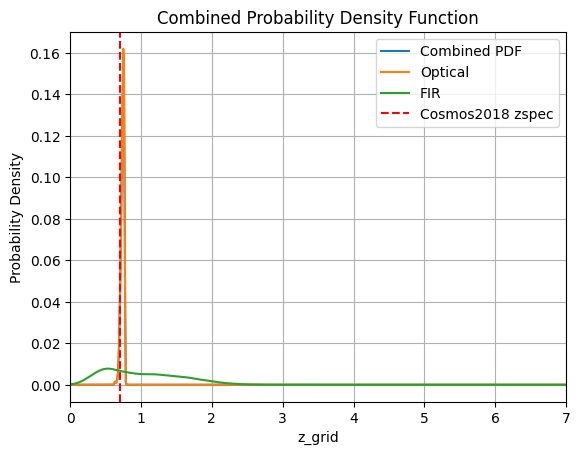

_____________ Galaxy ID :  326
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [183.51277625 181.01437391]


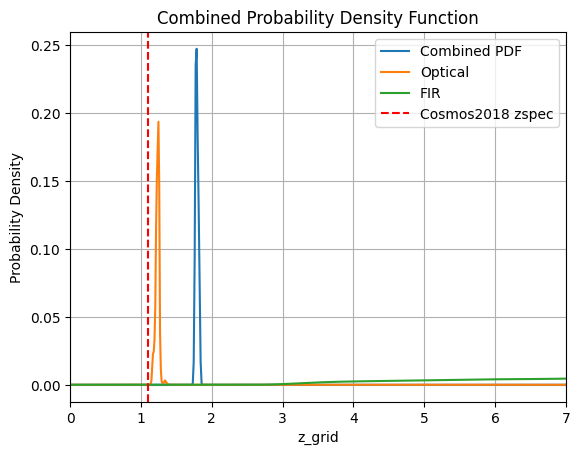

_____________ Galaxy ID :  327
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [274.42957717 279.2546347 ]


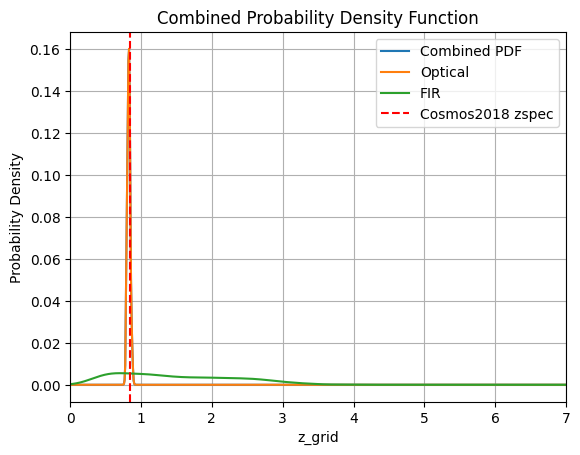

_____________ Galaxy ID :  328
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [188.98274275 193.55075752]


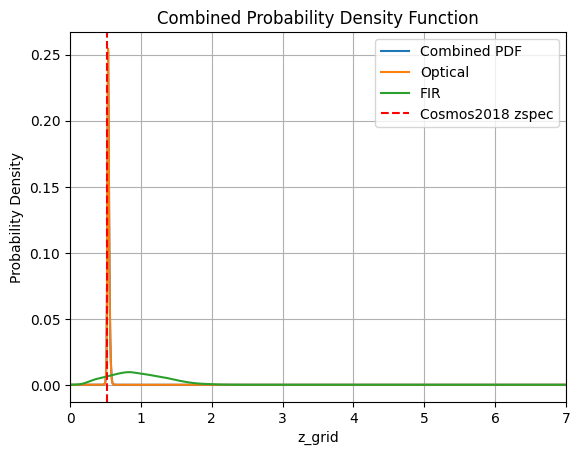

_____________ Galaxy ID :  329
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [235.07183412 241.26445455]


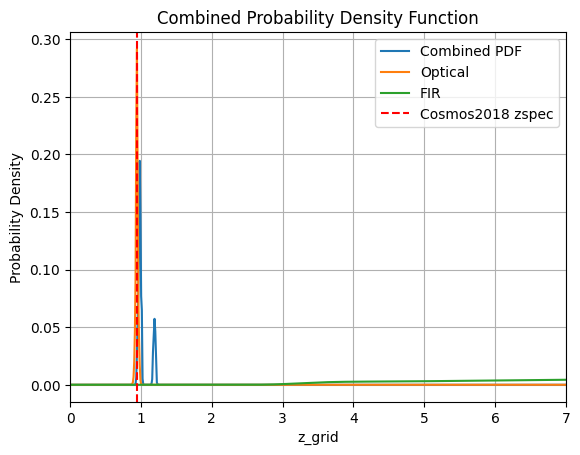

_____________ Galaxy ID :  330
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [198.51097075 193.58851607]


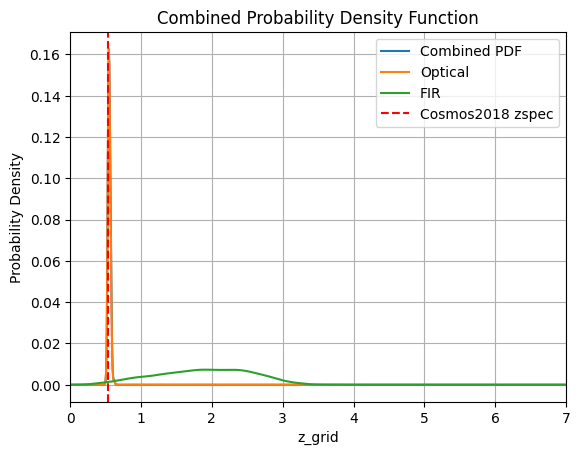

_____________ Galaxy ID :  331
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [187.4922005  193.03359676]


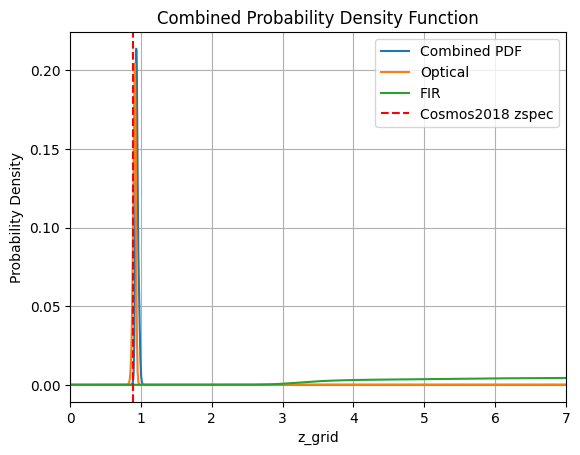

_____________ Galaxy ID :  332
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [201.29011997 212.89599092]


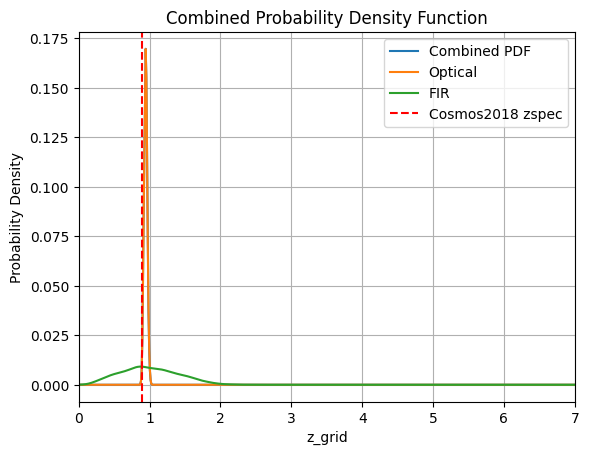

_____________ Galaxy ID :  333
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [255.41414747 257.12430268]


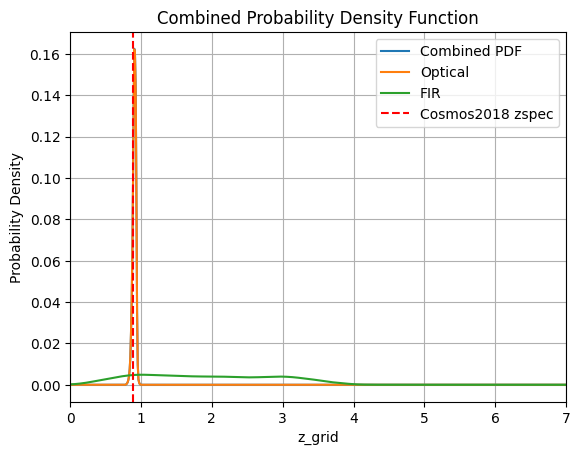

_____________ Galaxy ID :  334
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [198.19483605 194.72329201]


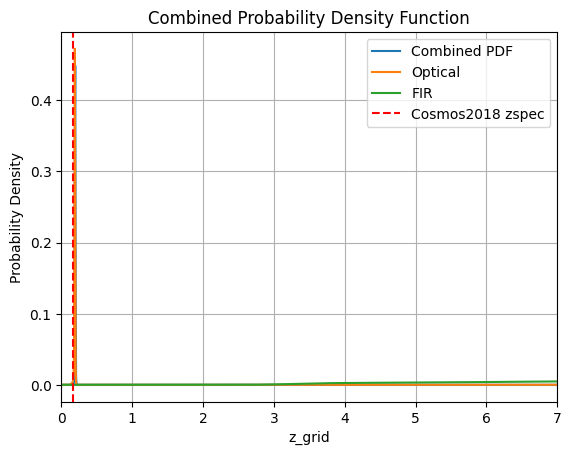

_____________ Galaxy ID :  335
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [291.37021324 287.66314544]


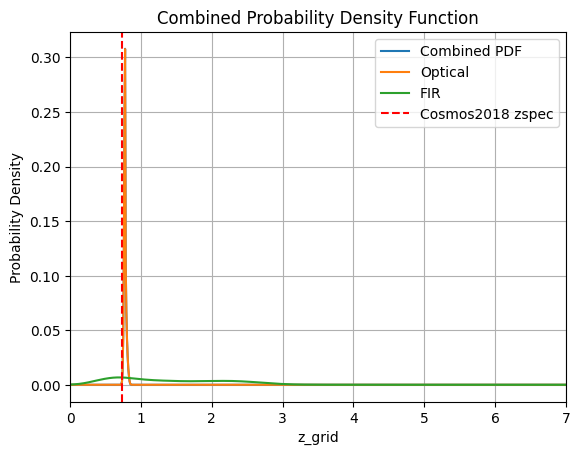

_____________ Galaxy ID :  336
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [290.07141402 288.95790795]


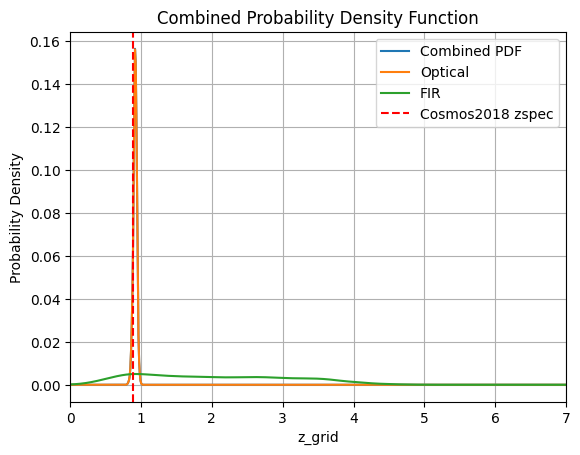

_____________ Galaxy ID :  337
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [215.47078177 204.15319507]


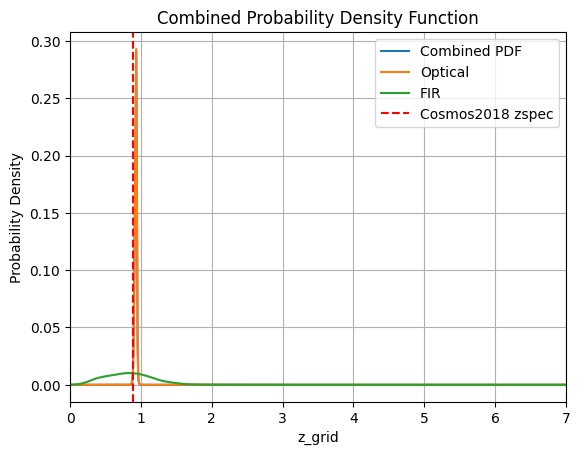

_____________ Galaxy ID :  338
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [307.25832931 315.56221195]


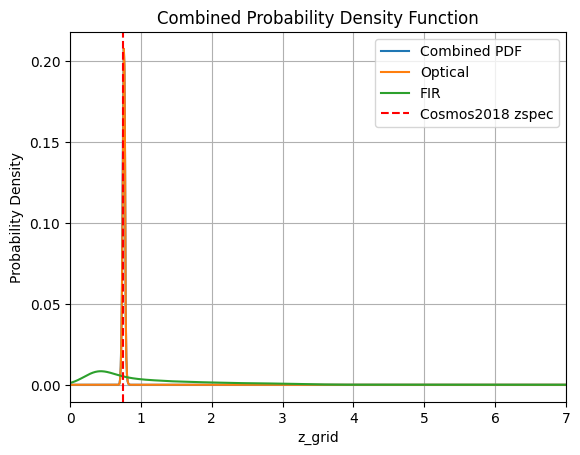

_____________ Galaxy ID :  339
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [306.13146175 296.2217839 ]


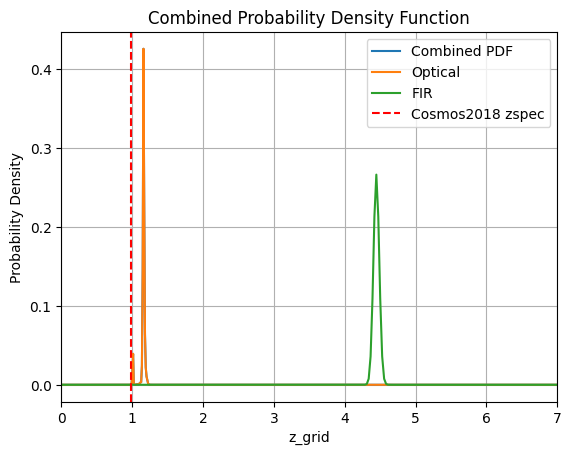

_____________ Galaxy ID :  340
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [183.48031591 186.33569895]


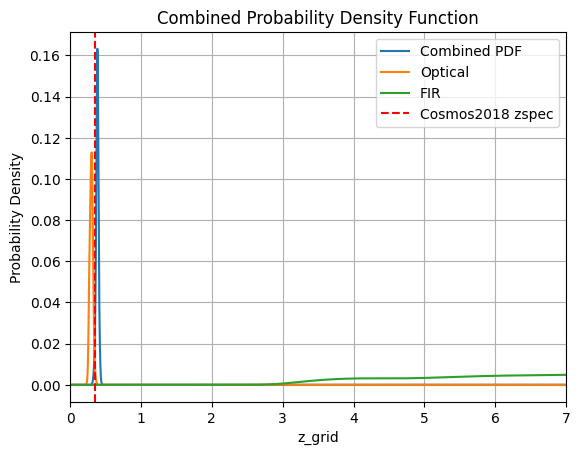

_____________ Galaxy ID :  341
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [224.84593313 229.57678094]


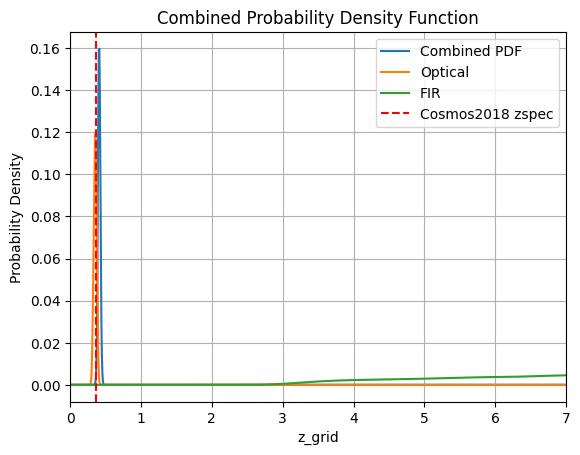

_____________ Galaxy ID :  342


ValueError: NaN values detected in your input data or the output of your objective/model function - fitting algorithms cannot handle this! Please read https://lmfit.github.io/lmfit-py/faq.html#i-get-errors-from-nan-in-my-fit-what-can-i-do for more information.

In [62]:
for i in range(len(OPTICAL_indices)):

    
    print('_____________ Galaxy ID : ', i )   
    

    
    
    try:
        get_z = get_broadband_photometry(i)
        
        
    except:
        z_photometry.append(np.nan)
        
    z_photometry.append(get_z[0])
    z_spec.append(get_z[1])
    z_EAZY.append(get_z[2])
    z_photo_dub.append(get_z[3])



    

    

In [168]:
len(z_photometry)

342

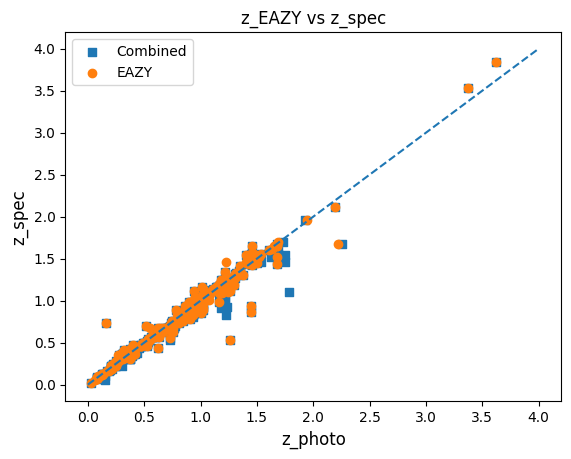

In [199]:

plt.title('z_photo vs z_spec')
plt.scatter(z_photometry,z_spec, label = 'Combined', marker='s')

plt.title('z_EAZY vs z_spec')

plt.scatter(z_EAZY,z_spec, label = 'EAZY')

# plt.scatter(z_photo_dub,z_spec, label = 'Dub Photo')

plt.plot([0,4],[0,4], linestyle = 'dashed')
plt.xlabel('z_photo', fontsize = 12)
plt.ylabel('z_spec', fontsize = 12)

plt.legend()

In [200]:
len(z_EAZY)

342

In [ ]:
print('hello')

In [89]:
a = [1,2,np.nan,5]

In [90]:
a.append(np.nan)

In [91]:
a

[1, 2, nan, 5, nan]

_____________ Galaxy ID :  343
The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 60;
tau: [347.22868986 347.88335857]


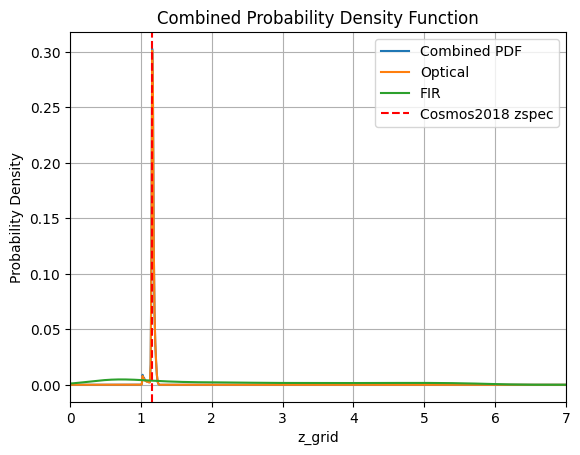

1.1596590280532837 1.1550000000000002 1.1596590280532837 1.1520000000000001


In [104]:
for i in range(1):
    
    i = i+342

    
    print('_____________ Galaxy ID : ', i )   
    

    
    
    try:
        get_z = get_broadband_photometry(i)
        
        
    except:
        get_z = np.array([np.nan,np.nan,np.nan,np.nan])
        
        
#     z_photometry.append(get_z[0])
#     z_spec.append(get_z[1])
#     z_EAZY.append(get_z[2])
#     z_photo_dub.append(get_z[3])



    

    

In [162]:
len(z_photometry)

342

()

In [204]:
try:
    
    a = [1,2,3]
    
    a[4]
    
except:
    
    print( 5)

5


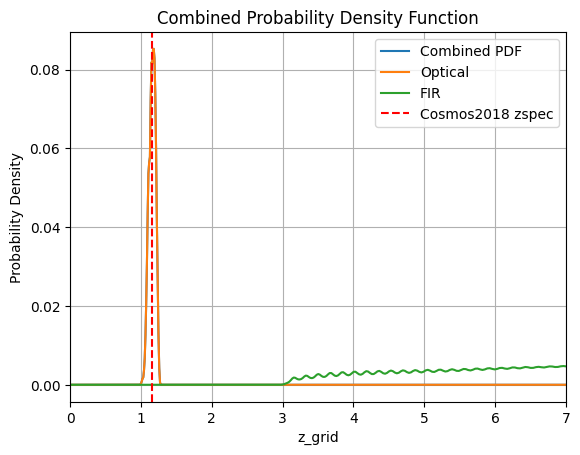

In [213]:
ccc = get_broadband_photometry(86)


In [206]:
ccc

array([1.18136394, 1.16      , 1.18136394, 1.0716    ])

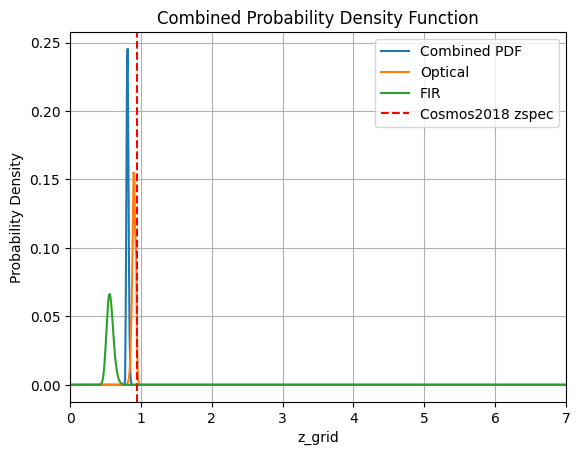

In [214]:
vvv = get_broadband_photometry(401)

In [178]:
FIR_indices[342]

365